# Modelo 

In [2]:
!pip install imblearn

Defaulting to user installation because normal site-packages is not writeable


In [3]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import roc_auc_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, precision_recall_curve, auc, f1_score, accuracy_score

# from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from statsmodels.genmod.generalized_linear_model import GLM
from statsmodels.genmod import families
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import make_scorer, f1_score, accuracy_score, precision_score, recall_score, confusion_matrix
from sklearn.metrics import confusion_matrix, classification_report
# from imblearn.under_sampling import RandomUnderSampler
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import Binarizer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomTreesEmbedding
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer, OneHotEncoder
from sklearn.ensemble import RandomTreesEmbedding, RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.datasets import make_classification
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import  LabelEncoder

from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from sklearn.preprocessing import OneHotEncoder, KBinsDiscretizer
import os

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import PowerTransformer, StandardScaler

In [4]:
cartera = pd.read_csv('binned_variables.csv')

In [5]:
cartera.columns

Index(['Unnamed: 0', 'SEX', 'PREM_PAYBL_M', 'RESCATE', 'ANTIGÜEDAD',
       'AGE_AT_ENTRY', 'G_FUND_PC', 'PU', 'ENTRY_MONTH', 'POL', 'PM_(FONDO)',
       'DUR_ANOS', 'DIFF', 'PREM_FREQ', 'Ano_VTO_woe', 'EDAD_woe'],
      dtype='object')

In [6]:
cartera = cartera.drop('Unnamed: 0', axis=1)

In [7]:
cartera = cartera.drop('POL', axis=1)

## Modelo base 
- incluyo todas las variables incluso las que menos poder predictivo tienen 

In [8]:
X = cartera.drop('RESCATE', axis=1)

In [9]:
# X = cartera[['EDAD_woe', 'Ano_VTO_woe', 'AGE_AT_ENTRY', 'PREM_PAYBL_M', 'DUR_ANOS', 'DIFF', 'PU', 'PM_(FONDO)']] # estas son las variables que mayor Information value tienen (mayor poder predictivo)
y = cartera [['RESCATE']]

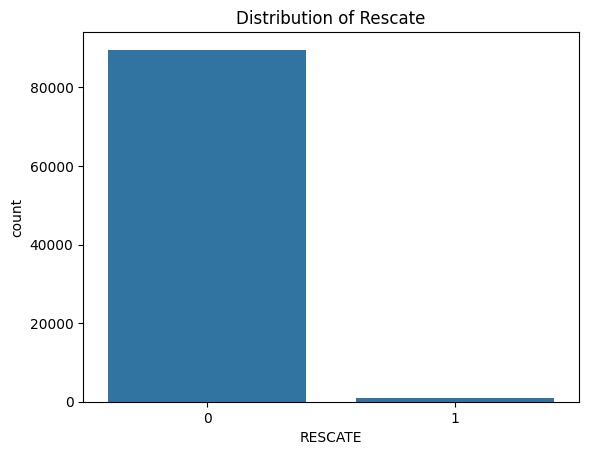

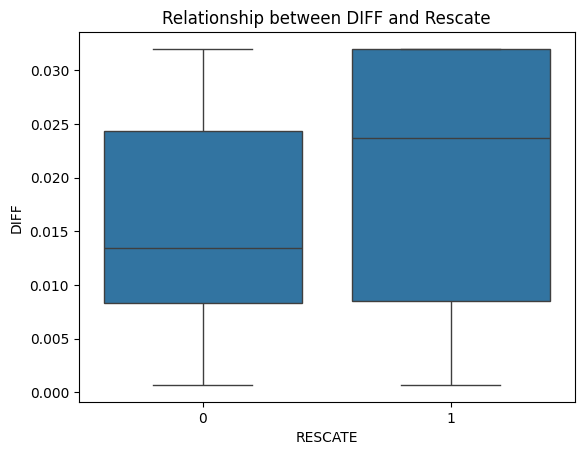

In [10]:
# Visualize the distribution of the target variable
sns.countplot(x='RESCATE', data=cartera)
plt.title('Distribution of Rescate')
plt.show()

# Visualize the relationship between features and the target variable
sns.boxplot(x='RESCATE', y='DIFF', data=cartera)
plt.title('Relationship between DIFF and Rescate')
plt.show()

In [32]:
cartera.dtypes

SEX              object
PREM_PAYBL_M      int64
RESCATE           int64
ANTIGÜEDAD        int64
AGE_AT_ENTRY      int64
G_FUND_PC       float64
PU              float64
ENTRY_MONTH       int64
PM_(FONDO)      float64
DUR_ANOS          int64
DIFF            float64
PREM_FREQ        object
Ano_VTO_woe     float64
EDAD_woe        float64
dtype: object

#### Train test split 
- Particion de train y test

In [11]:
# estratificar la variable target para que vaya una distribucion similar de la variable target en los 3 dataset (train, test, calib)
# First split: Train (80%) and Temp (20%)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Check the sizes and distribution
print("Train set:", X_train.shape, y_train.shape)
print("Test set:", X_test.shape, y_test.shape)

# Optionally, check the distribution of classes in each set
print("\nDistribution in training set:")
print(y_train.value_counts(normalize=True))
print("\nDistribution in test set:")
print(y_test.value_counts(normalize=True))

Train set: (72368, 13) (72368, 1)
Test set: (18092, 13) (18092, 1)

Distribution in training set:
RESCATE
0          0.990286
1          0.009714
Name: proportion, dtype: float64

Distribution in test set:
RESCATE
0          0.990272
1          0.009728
Name: proportion, dtype: float64


In [12]:
# Preprocessing for numerical features: scale them
numeric_features = ['PU', 'G_FUND_PC', 'AGE_AT_ENTRY', 'ENTRY_MONTH', 'DIFF', 'PREM_PAYBL_M',
                    'ANTIGÜEDAD', 'DUR_ANOS', 'Ano_VTO_woe', 'PM_(FONDO)', 'EDAD_woe']
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

# Preprocessing for categorical features: one-hot encode them
categorical_features = ['PREM_FREQ', 'SEX']
categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(drop='first'))])

# Combine preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)])

# Create a pipeline with preprocessing and logistic regression model
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', LogisticRegression(solver='liblinear'))])

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['l1', 'l2']
}

# Define custom scorers
scorers = {
    'recall_score': make_scorer(recall_score),
    'f1_score': make_scorer(f1_score)
}

# Perform GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring=scorers, refit='f1_score', cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best model after GridSearchCV
best_model = grid_search.best_estimator_

# Predict probabilities
y_pred_prob = best_model.predict_proba(X_test)[:, 1]


# Optimize threshold based on F1 score
def find_best_threshold(y_true, y_prob):
    thresholds = np.arange(0.0, 1.0, 0.01)
    f1_scores = [f1_score(y_true, y_prob >= t) for t in thresholds]
    best_threshold = thresholds[np.argmax(f1_scores)]
    return best_threshold

best_threshold = find_best_threshold(y_test, y_pred_prob)
y_pred_optimized = (y_pred_prob >= best_threshold).astype(int)

# Calculate AUC
auc = roc_auc_score(y_test, y_pred_prob)
print('AUC:', auc)

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Print classification report
print('Classification Report:')
print(classification_report(y_test, y_pred_optimized))

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_optimized)
conf_matrix_df = pd.DataFrame(conf_matrix, index=best_model.classes_, columns=best_model.classes_)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Print best parameters and best threshold
print('Best Parameters:', grid_search.best_params_)
print('Best Threshold:', best_threshold)

BrokenProcessPool: A task has failed to un-serialize. Please ensure that the arguments of the function are all picklable.

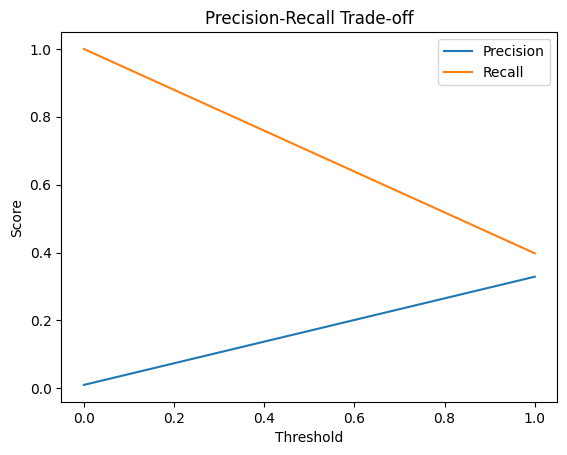

[0 1]


In [ ]:
# Evaluate different thresholds for precision-recall trade-offs
precisions, recalls, thresholds = precision_recall_curve(y_test, y_pred_optimized)

# Plot precision-recall curve
plt.figure()
plt.plot(thresholds, precisions[:-1], label="Precision")
plt.plot(thresholds, recalls[:-1], label="Recall")
plt.xlabel("Threshold")
plt.ylabel("Score")
plt.title("Precision-Recall Trade-off")
plt.legend()
plt.show()
print(thresholds)

In [36]:
lr_model = LogisticRegression(class_weight='balanced', random_state=42)

# Crea el pipeline con preprocesamiento y modelo de regresión logística
pipeline_lr = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', lr_model)])

# Define la cuadrícula de hiperparámetros para GridSearchCV
param_grid_lr = {
    'classifier__solver': ['liblinear', 'lbfgs', 'saga'],  # Incluyendo solvers adicionales
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['l1', 'l2', 'elasticnet'],  # Incluyendo Elastic Net
    'classifier__l1_ratio': [0.0, 0.5, 1.0]  # Sólo aplicable si penalty='elasticnet'
}


In [37]:
from sklearn.model_selection import train_test_split, GridSearchCV, ParameterGrid


# Sacar el feature importance y AUC del modelo

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversio

Mejores hiperparámetros para Regresión Logística:  {'classifier__C': 0.1, 'classifier__l1_ratio': None, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs'}
AUC: 0.9616160136191113
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.23      0.56      0.33       176

    accuracy                           0.98     18092
   macro avg       0.61      0.77      0.66     18092
weighted avg       0.99      0.98      0.98     18092

Confusion Matrix:
[[17589   327]
 [   77    99]]


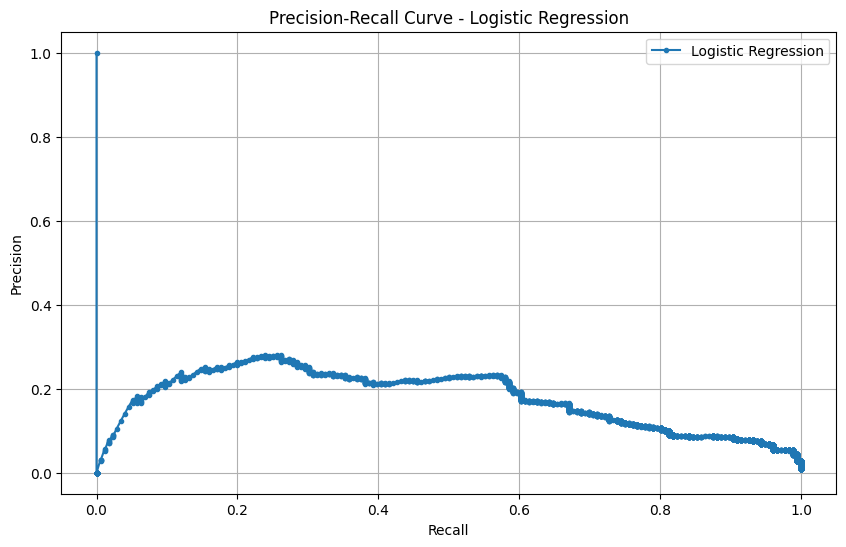

In [38]:
valid_params = []
for params in ParameterGrid(param_grid_lr):
    if params['classifier__penalty'] == 'elasticnet' and params['classifier__solver'] != 'saga':
        continue  # Elastic Net solo es compatible con el solver 'saga'
    if params['classifier__penalty'] in ['l1', 'elasticnet'] and params['classifier__solver'] in ['lbfgs']:
        continue  # 'lbfgs' no es compatible con 'l1' o 'elasticnet'
    if params['classifier__penalty'] != 'elasticnet':
        params['classifier__l1_ratio'] = None  # l1_ratio sólo es aplicable para elasticnet
    valid_params.append(params)

# Asegura que todos los parámetros sean listas o arrays
for params in valid_params:
    for key, value in params.items():
        if not isinstance(value, (list, np.ndarray)):
            params[key] = [value]

# Custom scorer to optimize F1 score
f1_scorer = make_scorer(f1_score, greater_is_better=True)

# Inicializa GridSearchCV con las combinaciones válidas de hiperparámetros
grid_search_lr = GridSearchCV(pipeline_lr, valid_params, scoring=f1_scorer, cv=5)
grid_search_lr.fit(X_train, y_train)

# Obtén el mejor modelo
best_model_lr = grid_search_lr.best_estimator_
print("Mejores hiperparámetros para Regresión Logística: ", grid_search_lr.best_params_)

# Predice probabilidades y clases
y_pred_proba = best_model_lr.predict_proba(X_test)[:, 1]

# Calculate AUC
auc = roc_auc_score(y_test, y_pred_proba)
print('AUC:', auc)

# Encuentra el mejor umbral para F1 score
thresholds = np.linspace(0, 1, 100)
f1_scores = [f1_score(y_test, y_pred_proba > t) for t in thresholds]
best_threshold = thresholds[np.argmax(f1_scores)]

# Usa el mejor umbral para hacer predicciones finales
y_pred_best_threshold = (y_pred_proba > best_threshold).astype(int)

# Reporte de clasificación y matriz de confusión
print("Classification Report:")
print(classification_report(y_test, y_pred_best_threshold))
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_best_threshold))

# Curva precision-recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Logistic Regression')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Logistic Regression')
plt.legend()
plt.grid(True)
plt.show()

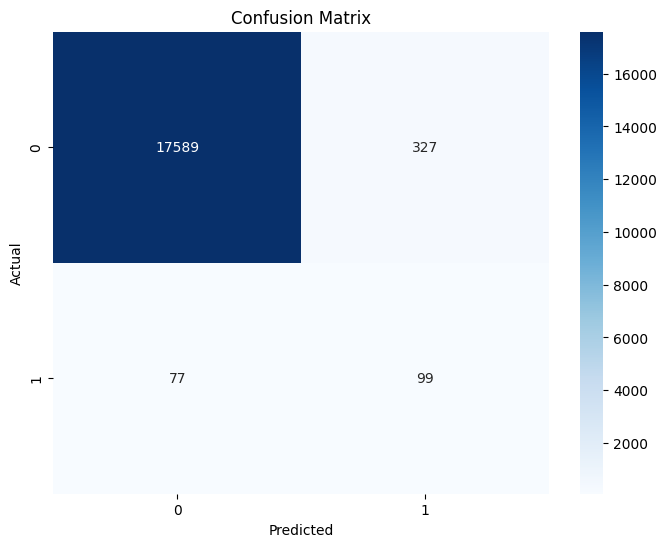

In [40]:

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_best_threshold)
conf_matrix_df = pd.DataFrame(conf_matrix, index=best_model.classes_, columns=best_model.classes_)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Resample Models

In [14]:
import numpy as np
import pandas as pd
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_curve, f1_score, make_scorer
import matplotlib.pyplot as plt
import joblib
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.under_sampling import RandomUnderSampler, ClusterCentroids
from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek, SMOTEENN
from imblearn.under_sampling import TomekLinks, EditedNearestNeighbours
from collections import Counter
from sklearn.metrics import f1_score, make_scorer, classification_report, confusion_matrix, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTEENN, SMOTETomek
from imblearn.under_sampling import TomekLinks, EditedNearestNeighbours
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import joblib

In [15]:
# Import Counter
from collections import Counter
# Import ADASYN
from imblearn.over_sampling import ADASYN

Class distribution after resampling with SMOTE: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Logistic Regression with oversampler on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     71665
           1       0.07      0.91      0.13       703

    accuracy                           0.88     72368
   macro avg       0.53      0.90      0.53     72368
weighted avg       0.99      0.88      0.93     72368

Confusion Matrix for Logistic Regression with oversampler on Training Set:
[[63193  8472]
 [   60   643]]
Classification Report for Logistic Regression with oversampler on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     17916
           1       0.07      0.94      0.14       176

    accuracy                           0.88     18092
   macro avg       0.54      0.91      0.54     18092
weighted avg       0.99      0.88      0.93     18092

Confusion Matrix for Logistic Regression with oversampler on Test Set:
[[15813  2103

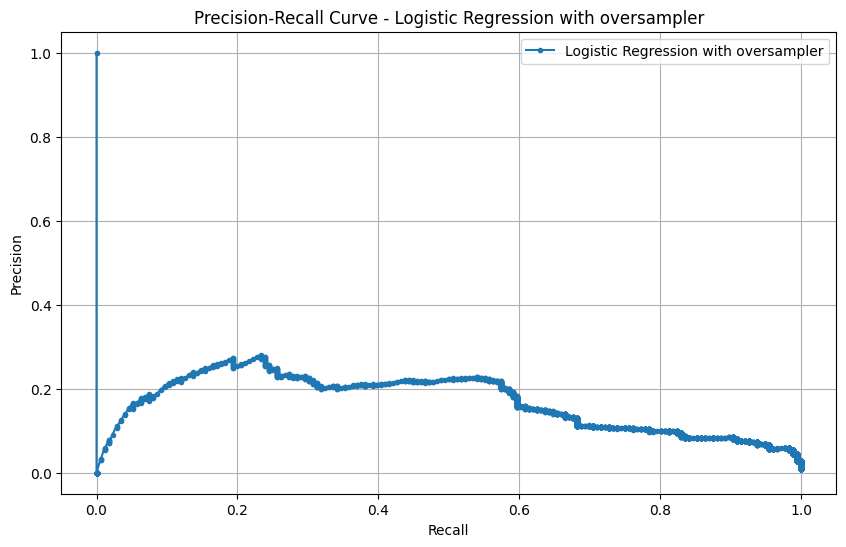

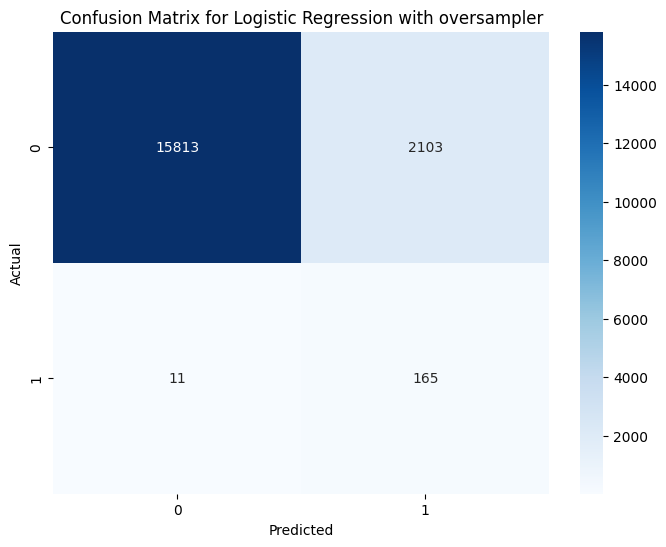

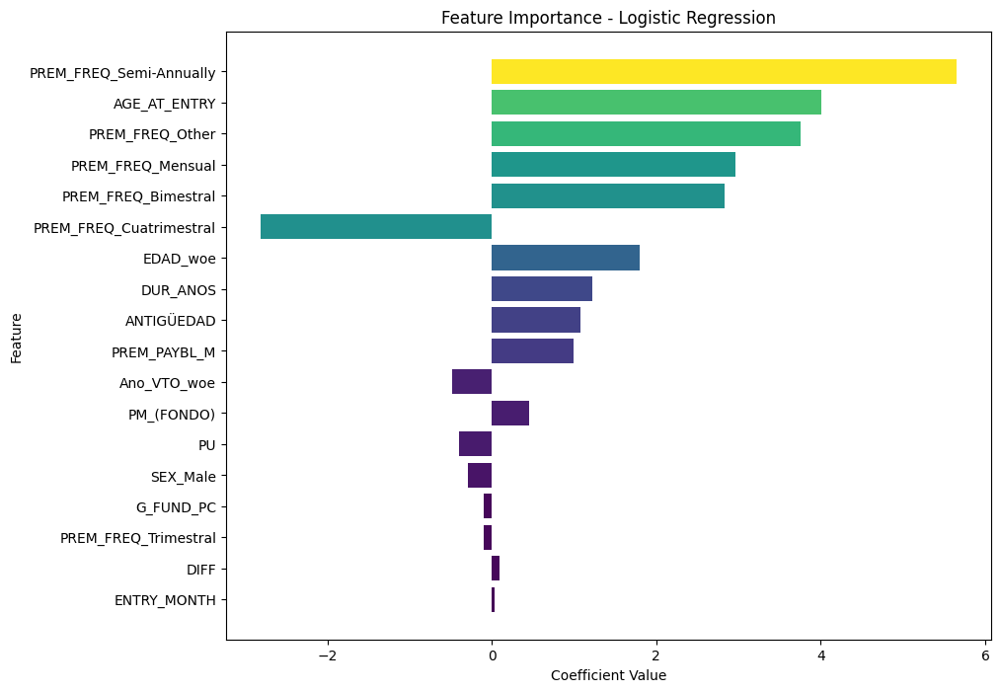

Best F1 score for Logistic Regression with oversampler on Training Set: 0.13098390710939092
Best F1 score for Logistic Regression with oversampler on Test Set: 0.13502454991816695

Class distribution after resampling with TomekLinks: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Logistic Regression with tomeklinks on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     71665
           1       0.07      0.91      0.13       703

    accuracy                           0.88     72368
   macro avg       0.53      0.90      0.53     72368
weighted avg       0.99      0.88      0.93     72368

Confusion Matrix for Logistic Regression with tomeklinks on Training Set:
[[63206  8459]
 [   60   643]]
Classification Report for Logistic Regression with tomeklinks on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     17916
           1       0.07      0.94      0.14       176

    accuracy                           0.88     18092
   macro avg       0.54      0.91      0.54     18092
weighted avg       0.99      0.88      0.93     18092

Confusion Matrix for Logistic Regression with tomeklinks on Test Set:
[[15813  2103]
 [

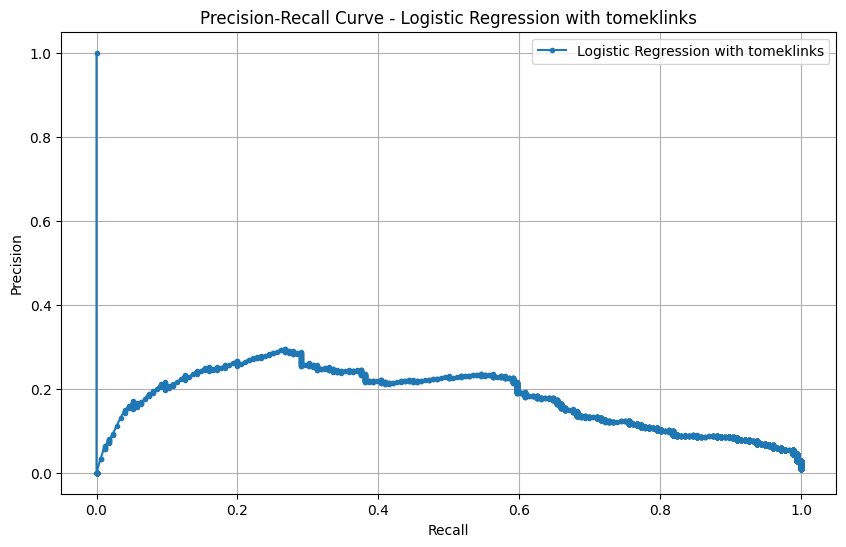

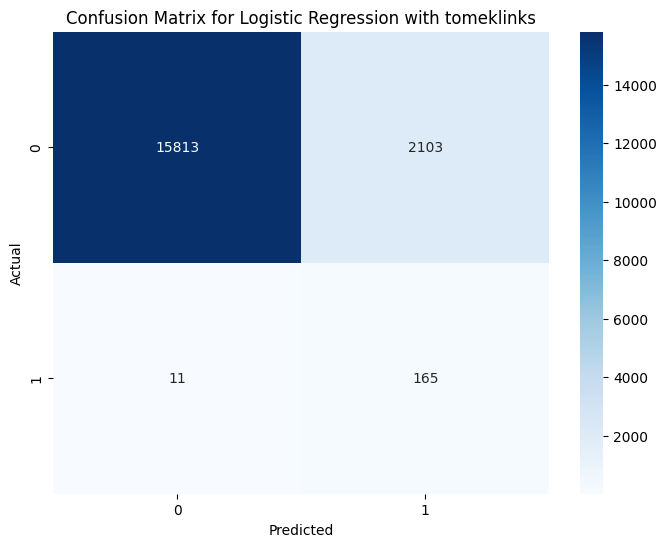

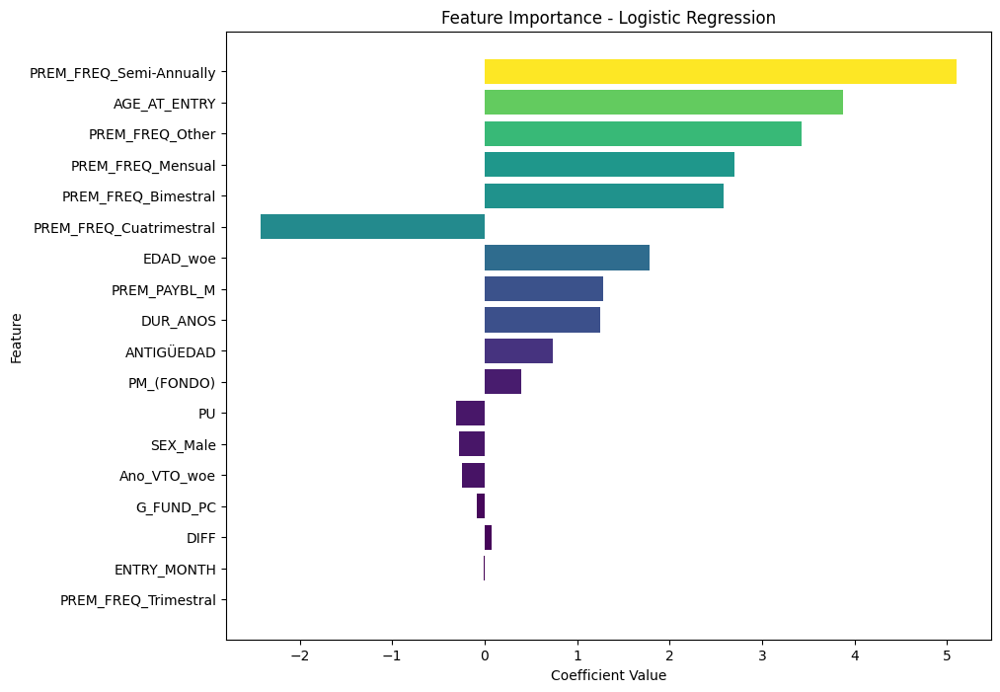

Best F1 score for Logistic Regression with tomeklinks on Training Set: 0.13115757266700662
Best F1 score for Logistic Regression with tomeklinks on Test Set: 0.13502454991816695

Class distribution after resampling with EditedNearestNeighbours: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Logistic Regression with enn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     71665
           1       0.07      0.91      0.13       703

    accuracy                           0.88     72368
   macro avg       0.53      0.90      0.53     72368
weighted avg       0.99      0.88      0.93     72368

Confusion Matrix for Logistic Regression with enn on Training Set:
[[63011  8654]
 [   60   643]]
Classification Report for Logistic Regression with enn on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     17916
           1       0.07      0.94      0.13       176

    accuracy                           0.88     18092
   macro avg       0.54      0.91      0.53     18092
weighted avg       0.99      0.88      0.93     18092

Confusion Matrix for Logistic Regression with enn on Test Set:
[[15774  2142]
 [   11   165]]


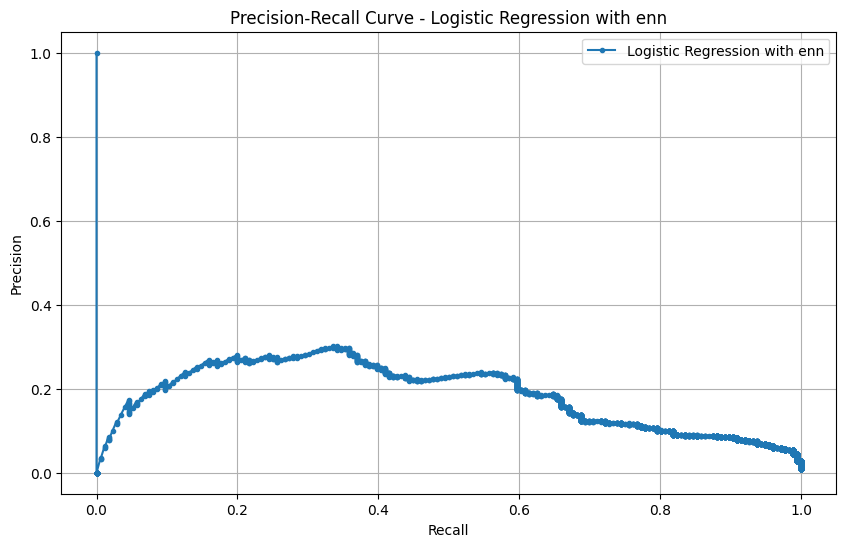

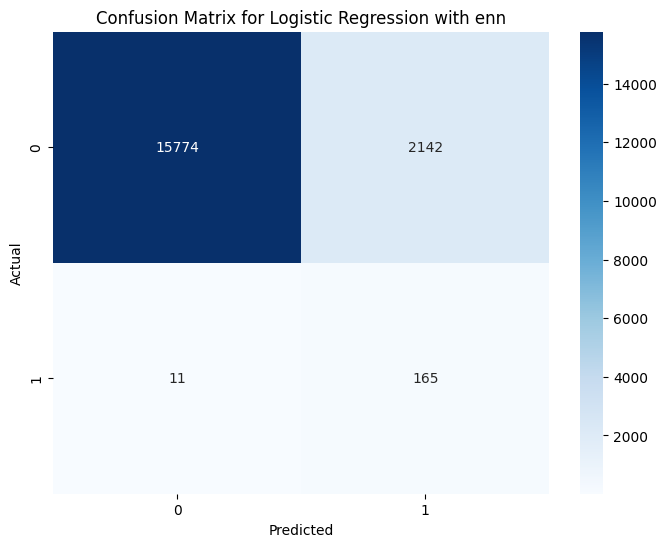

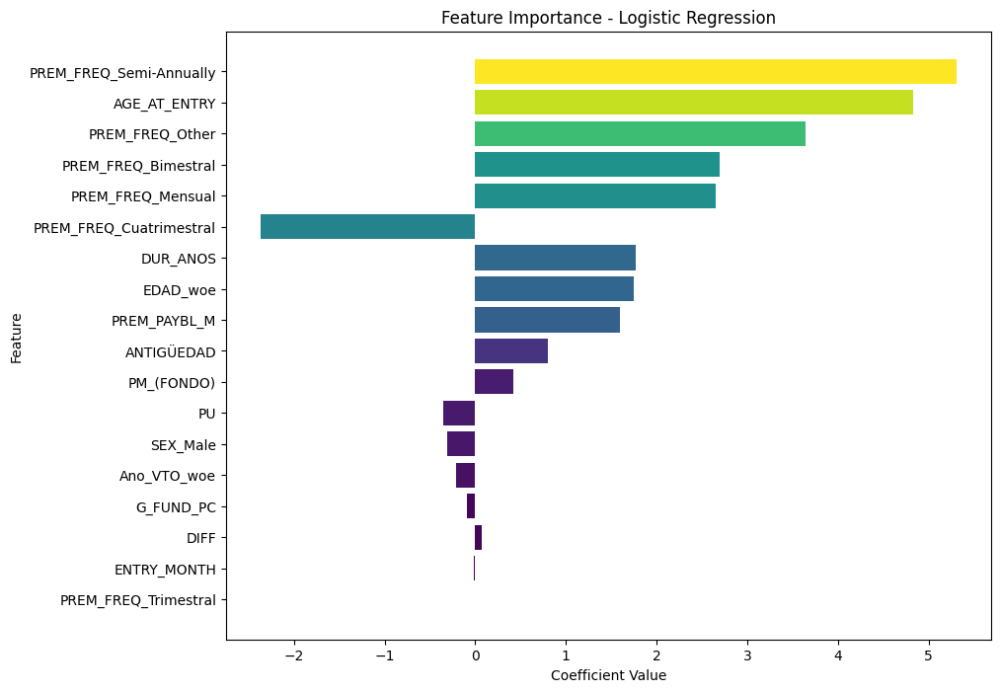

Best F1 score for Logistic Regression with enn on Training Set: 0.1286
Best F1 score for Logistic Regression with enn on Test Set: 0.13290374546919048

Class distribution after resampling with SMOTEENN: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Logistic Regression with smoteenn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.93     71665
           1       0.07      0.91      0.13       703

    accuracy                           0.88     72368
   macro avg       0.53      0.90      0.53     72368
weighted avg       0.99      0.88      0.93     72368

Confusion Matrix for Logistic Regression with smoteenn on Training Set:
[[62863  8802]
 [   60   643]]
Classification Report for Logistic Regression with smoteenn on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     17916
           1       0.07      0.94      0.13       176

    accuracy                           0.88     18092
   macro avg       0.54      0.91      0.53     18092
weighted avg       0.99      0.88      0.93     18092

Confusion Matrix for Logistic Regression with smoteenn on Test Set:
[[15750  2166]
 [   11   

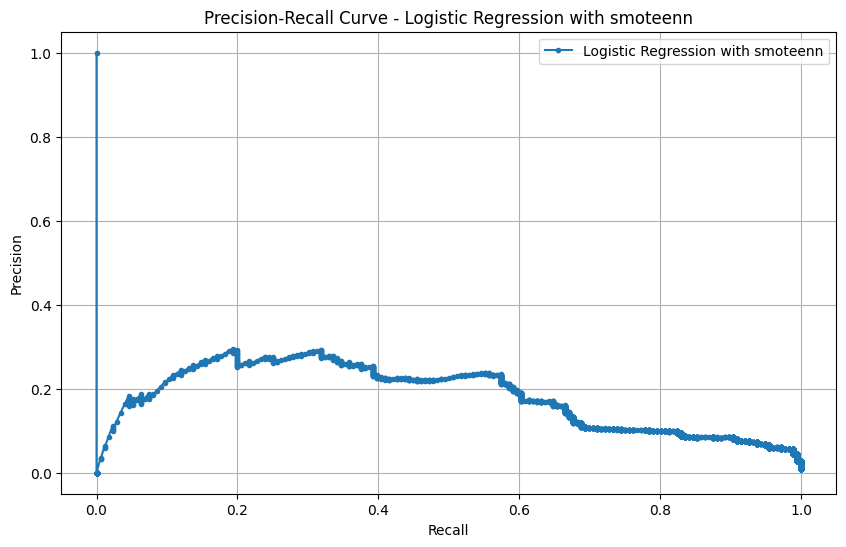

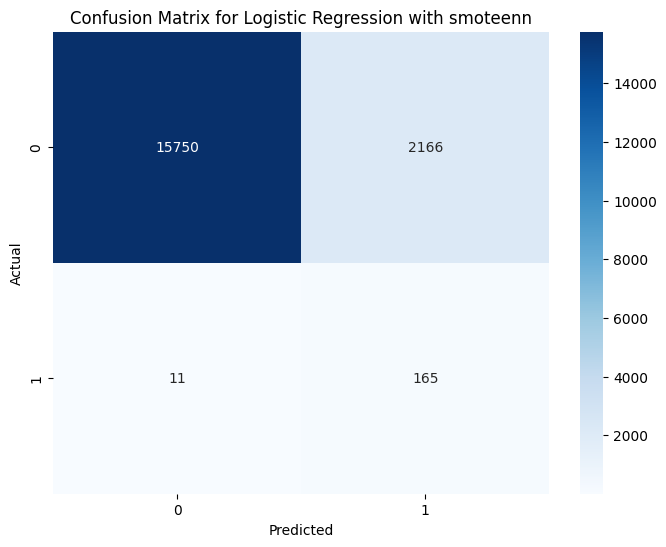

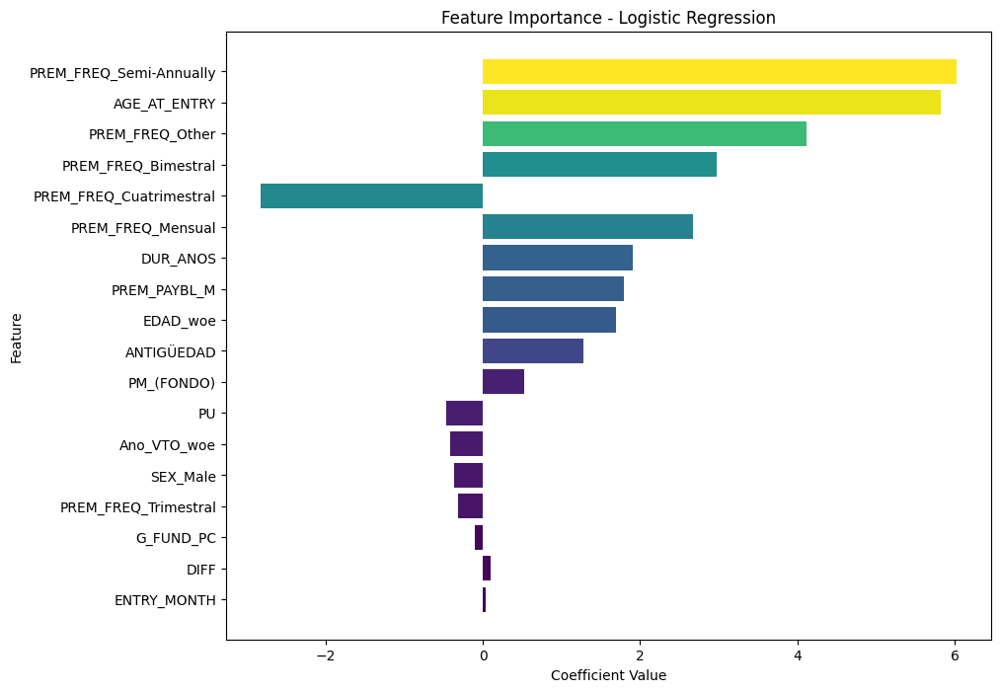

Best F1 score for Logistic Regression with smoteenn on Training Set: 0.12672447772960188
Best F1 score for Logistic Regression with smoteenn on Test Set: 0.13163143199042682

Class distribution after resampling with SMOTETomek: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Logistic Regression with smotemek on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     71665
           1       0.07      0.91      0.13       703

    accuracy                           0.88     72368
   macro avg       0.53      0.90      0.53     72368
weighted avg       0.99      0.88      0.93     72368

Confusion Matrix for Logistic Regression with smotemek on Training Set:
[[63179  8486]
 [   61   642]]
Classification Report for Logistic Regression with smotemek on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.88      0.94     17916
           1       0.07      0.94      0.14       176

    accuracy                           0.88     18092
   macro avg       0.54      0.91      0.54     18092
weighted avg       0.99      0.88      0.93     18092

Confusion Matrix for Logistic Regression with smotemek on Test Set:
[[15813  2103]
 [   11   

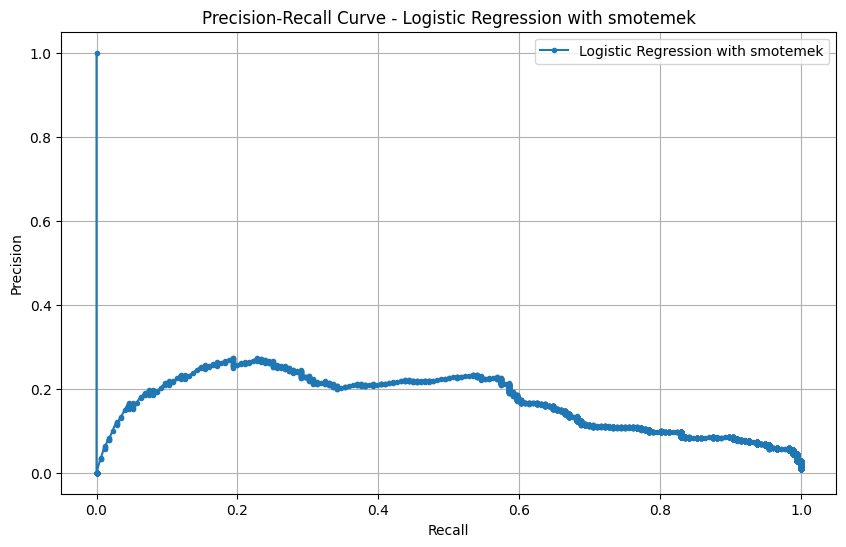

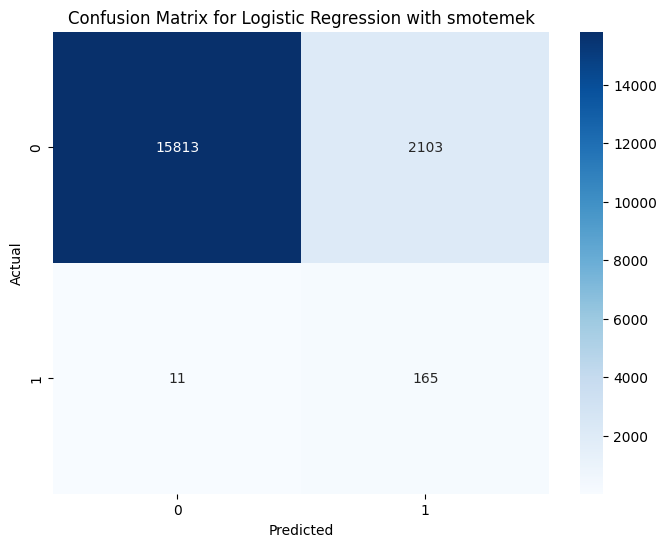

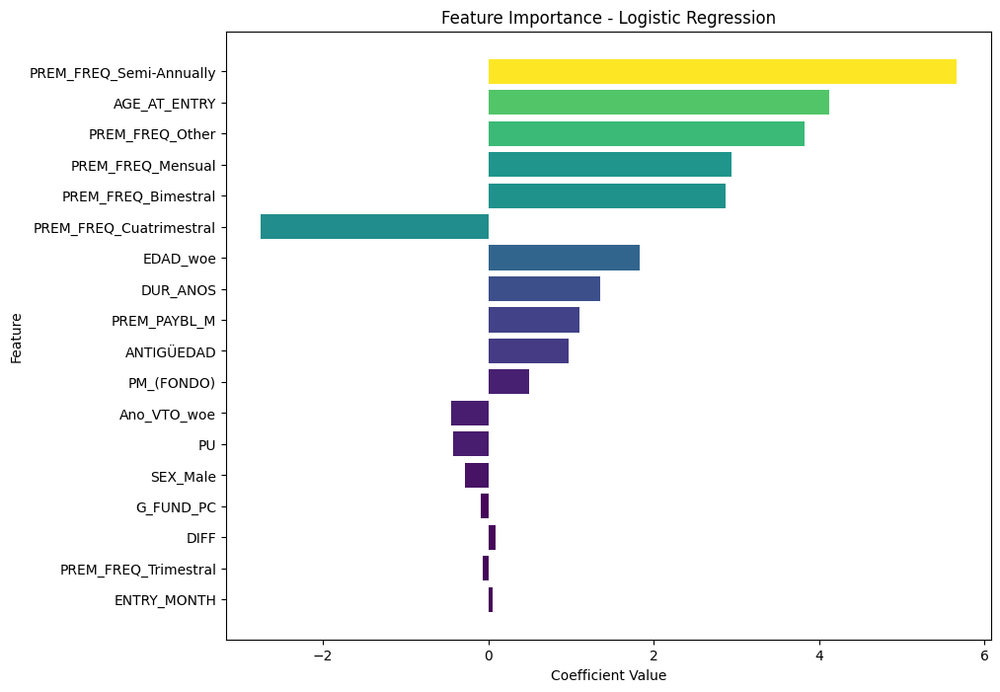

Best F1 score for Logistic Regression with smotemek on Training Set: 0.13060726274031126
Best F1 score for Logistic Regression with smotemek on Test Set: 0.13502454991816695

Class distribution after resampling with ADASYN: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Logistic Regression with adasyn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.87      0.93     71665
           1       0.07      0.93      0.12       703

    accuracy                           0.87     72368
   macro avg       0.53      0.90      0.53     72368
weighted avg       0.99      0.87      0.92     72368

Confusion Matrix for Logistic Regression with adasyn on Training Set:
[[62297  9368]
 [   50   653]]
Classification Report for Logistic Regression with adasyn on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.87      0.93     17916
           1       0.07      0.95      0.13       176

    accuracy                           0.87     18092
   macro avg       0.53      0.91      0.53     18092
weighted avg       0.99      0.87      0.92     18092

Confusion Matrix for Logistic Regression with adasyn on Test Set:
[[15607  2309]
 [    9   167]]


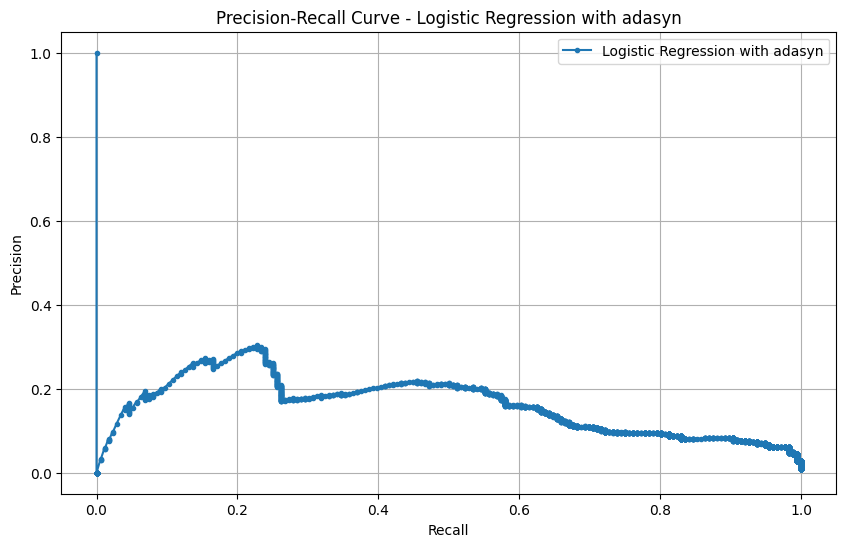

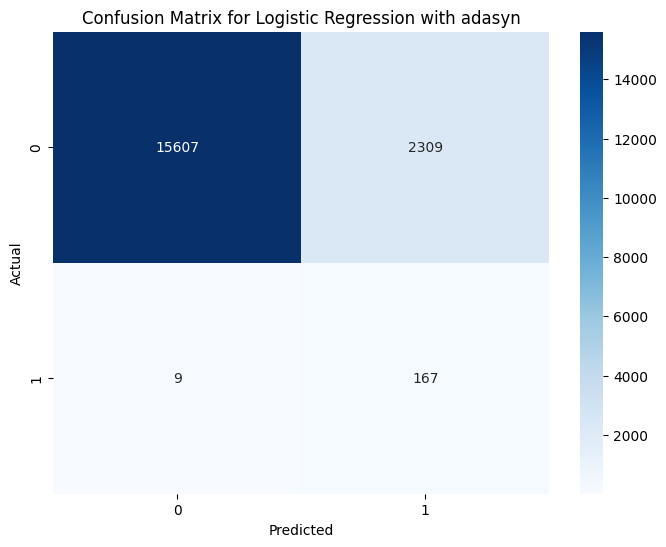

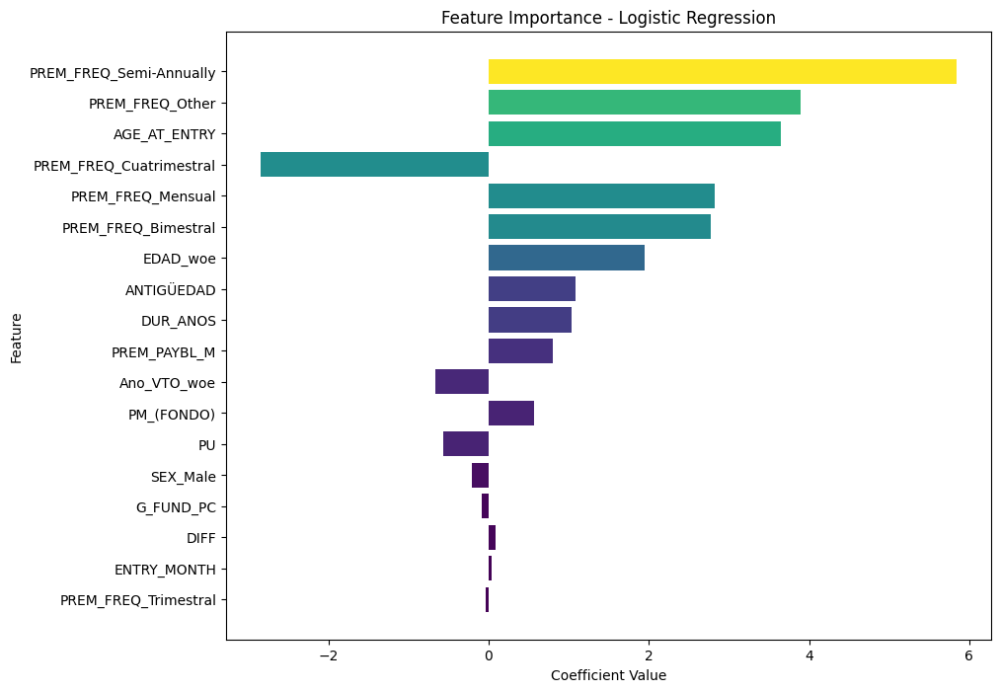

Best F1 score for Logistic Regression with adasyn on Training Set: 0.12178291682208131
Best F1 score for Logistic Regression with adasyn on Test Set: 0.12594268476621417

Class distribution after resampling with SMOTE: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Classification Report for Random Forest with oversampler on Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71665
           1       0.89      0.83      0.86       703

    accuracy                           1.00     72368
   macro avg       0.94      0.91      0.93     72368
weighted avg       1.00      1.00      1.00     72368

Confusion Matrix for Random Forest with oversampler on Training Set:
[[71593    72]
 [  120   583]]
Classification Report for Random Forest with oversampler on Test Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.33      0.35      0.34       176

    accuracy                           0.99     18092
   macro avg       0.66      0.67      0.67     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Random Forest with oversampler on Test Set:
[[17789   127]
 [  114    62]]


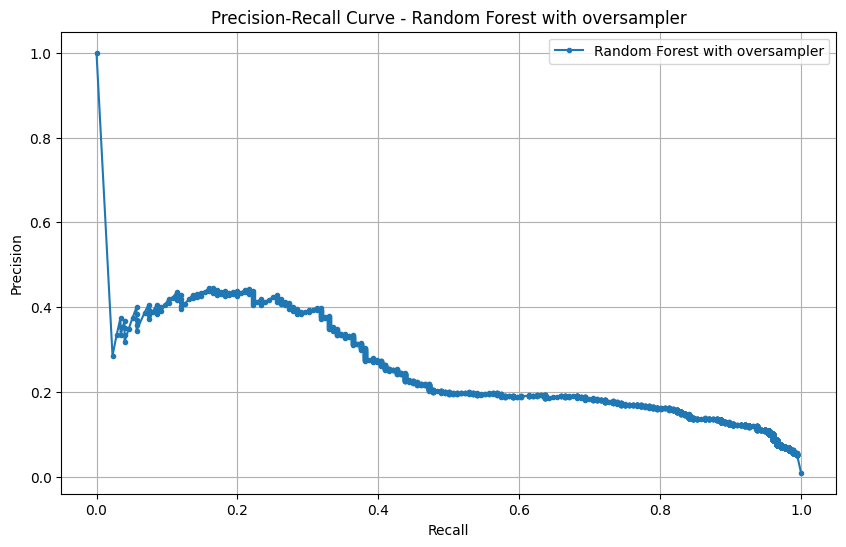

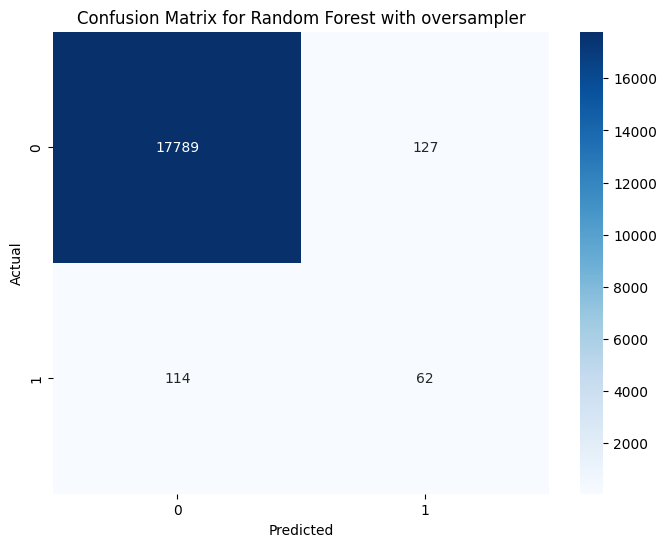

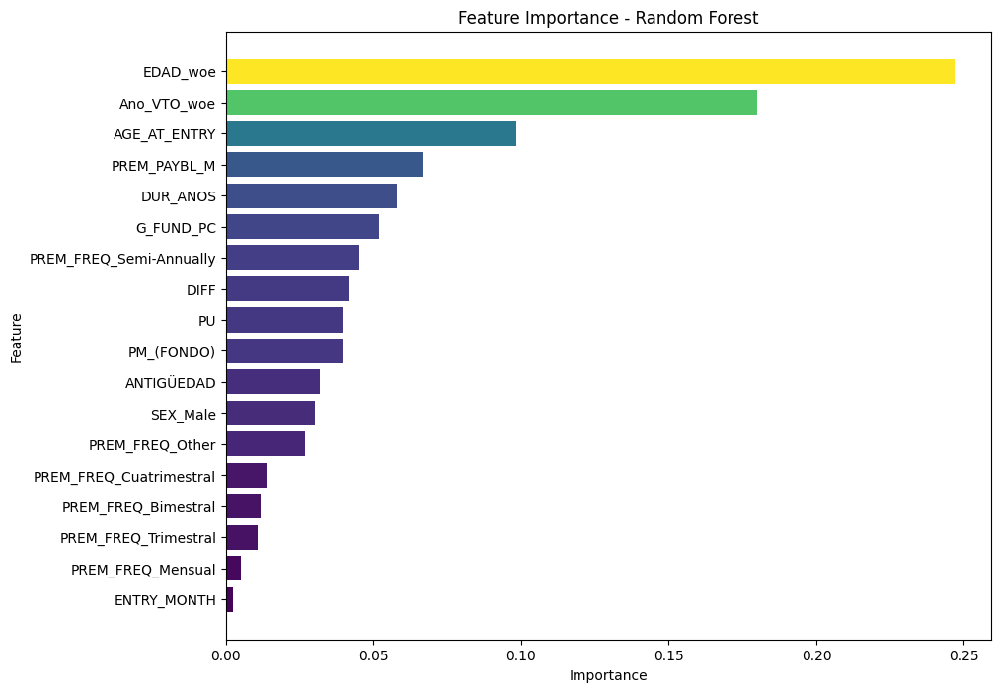

Best F1 score for Random Forest with oversampler on Training Set: 0.8586156111929307
Best F1 score for Random Forest with oversampler on Test Set: 0.33972602739726027

Class distribution after resampling with TomekLinks: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Classification Report for Random Forest with tomeklinks on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     71665
           1       0.57      1.00      0.73       703

    accuracy                           0.99     72368
   macro avg       0.79      1.00      0.86     72368
weighted avg       1.00      0.99      0.99     72368

Confusion Matrix for Random Forest with tomeklinks on Training Set:
[[71141   524]
 [    0   703]]
Classification Report for Random Forest with tomeklinks on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.33      0.50      0.40       176

    accuracy                           0.99     18092
   macro avg       0.66      0.75      0.70     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Random Forest with tomeklinks on Test Set:
[[17739   177]
 [   88    88]]


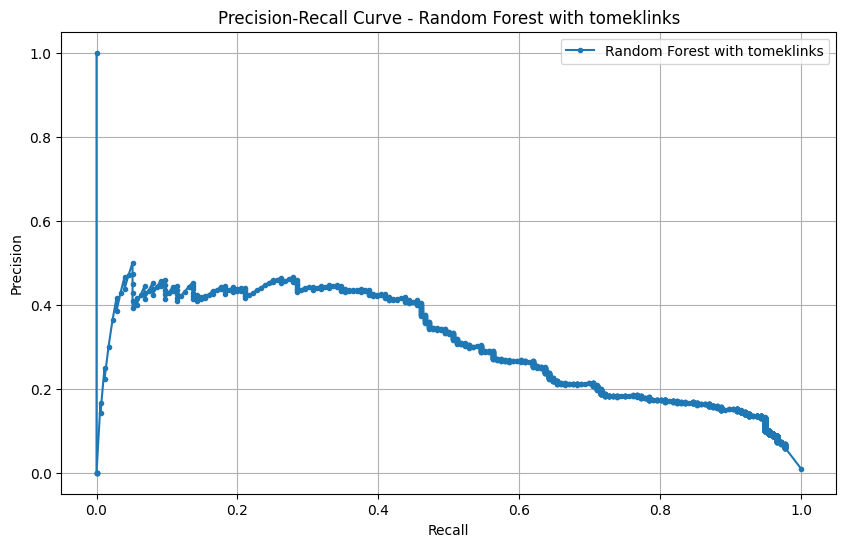

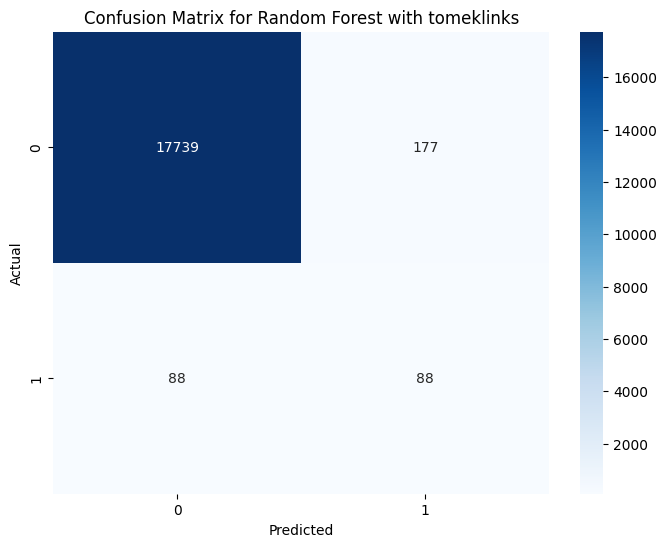

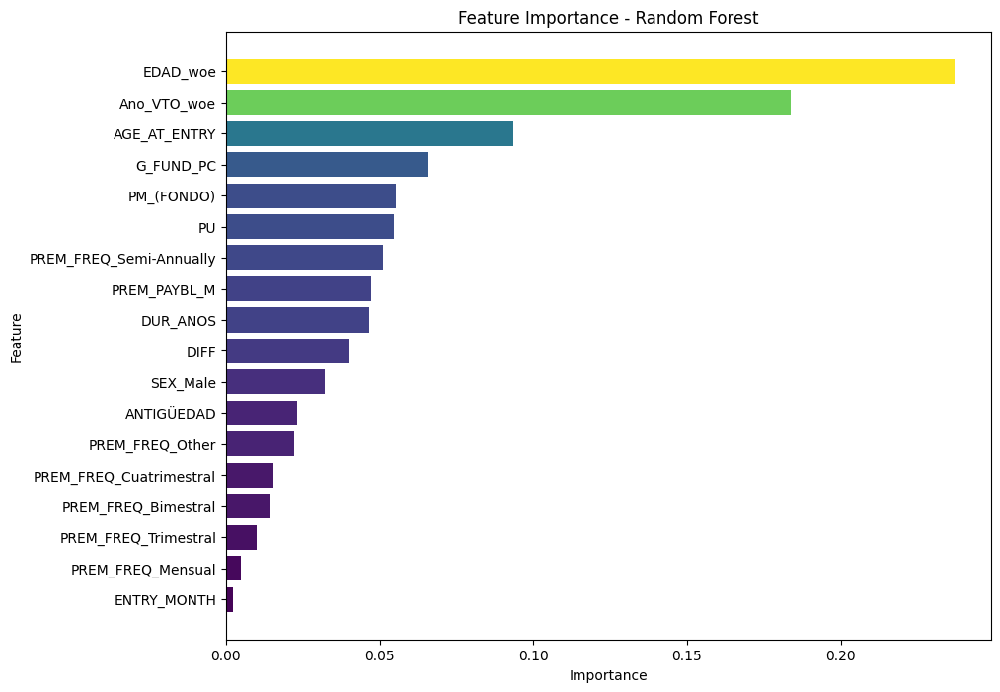

Best F1 score for Random Forest with tomeklinks on Training Set: 0.7284974093264248
Best F1 score for Random Forest with tomeklinks on Test Set: 0.39909297052154197

Class distribution after resampling with EditedNearestNeighbours: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Classification Report for Random Forest with enn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     71665
           1       0.46      1.00      0.63       703

    accuracy                           0.99     72368
   macro avg       0.73      0.99      0.81     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Random Forest with enn on Training Set:
[[70826   839]
 [    0   703]]
Classification Report for Random Forest with enn on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.28      0.56      0.37       176

    accuracy                           0.98     18092
   macro avg       0.64      0.77      0.68     18092
weighted avg       0.99      0.98      0.98     18092

Confusion Matrix for Random Forest with enn on Test Set:
[[17660   256]
 [   77    99]]


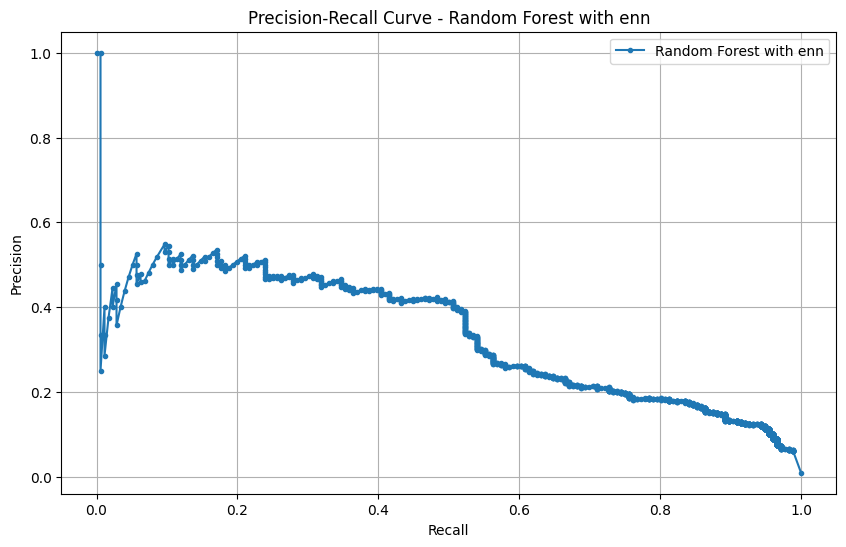

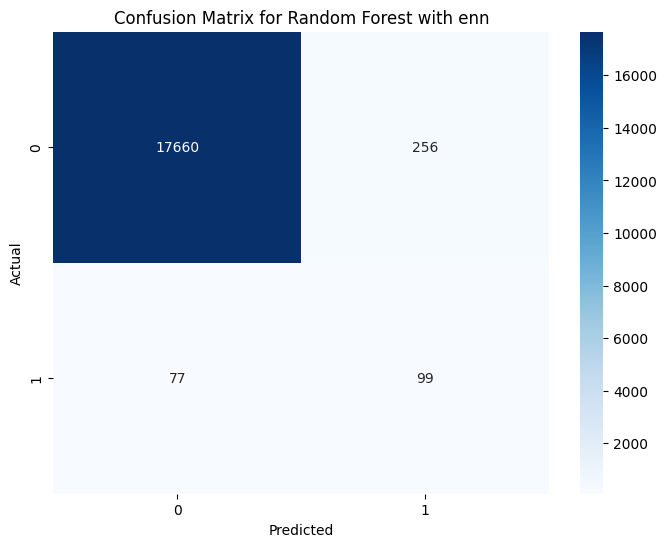

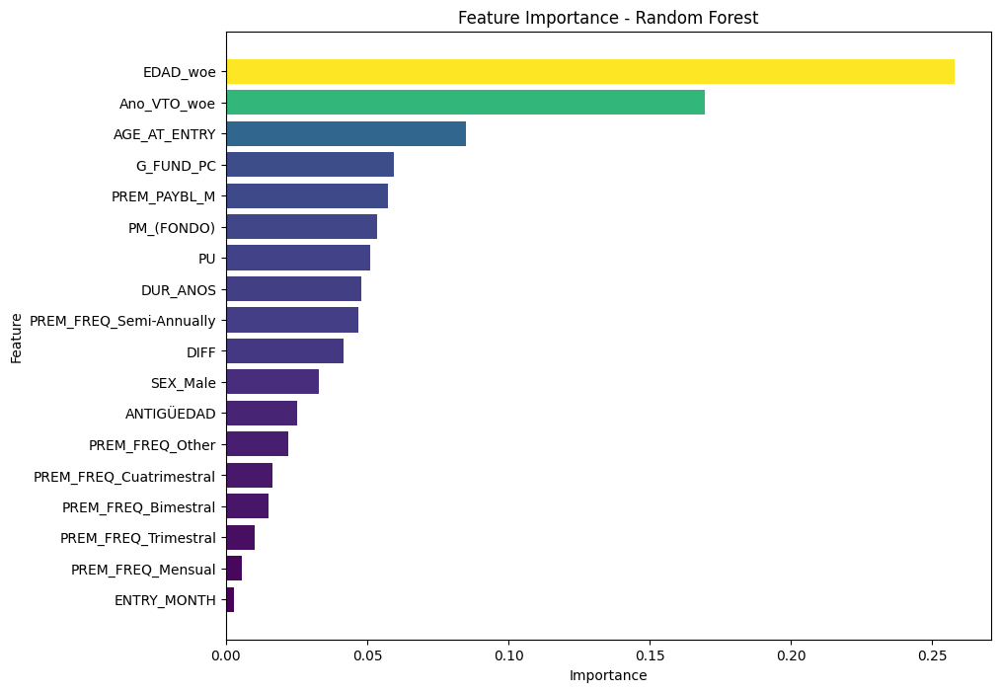

Best F1 score for Random Forest with enn on Training Set: 0.6262806236080178
Best F1 score for Random Forest with enn on Test Set: 0.3728813559322034

Class distribution after resampling with SMOTEENN: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Classification Report for Random Forest with smoteenn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     71665
           1       0.37      0.94      0.53       703

    accuracy                           0.98     72368
   macro avg       0.68      0.96      0.76     72368
weighted avg       0.99      0.98      0.99     72368

Confusion Matrix for Random Forest with smoteenn on Training Set:
[[70527  1138]
 [   45   658]]
Classification Report for Random Forest with smoteenn on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.22      0.59      0.32       176

    accuracy                           0.98     18092
   macro avg       0.61      0.78      0.65     18092
weighted avg       0.99      0.98      0.98     18092

Confusion Matrix for Random Forest with smoteenn on Test Set:
[[17544   372]
 [   73   103]]


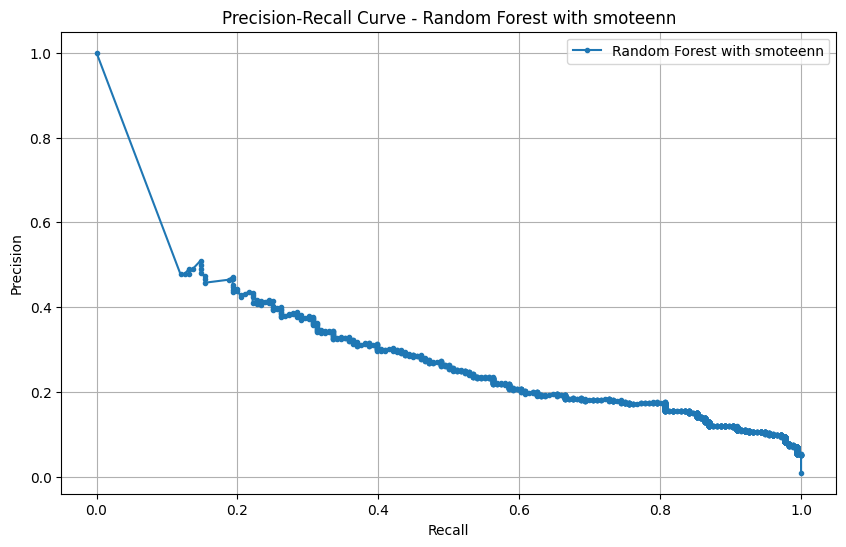

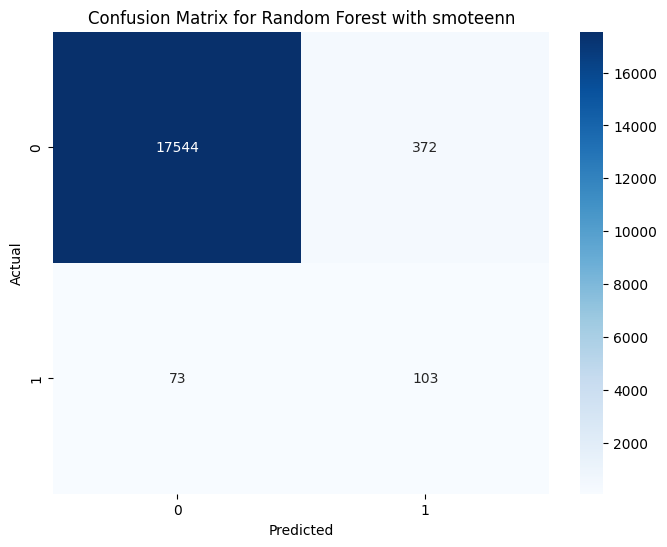

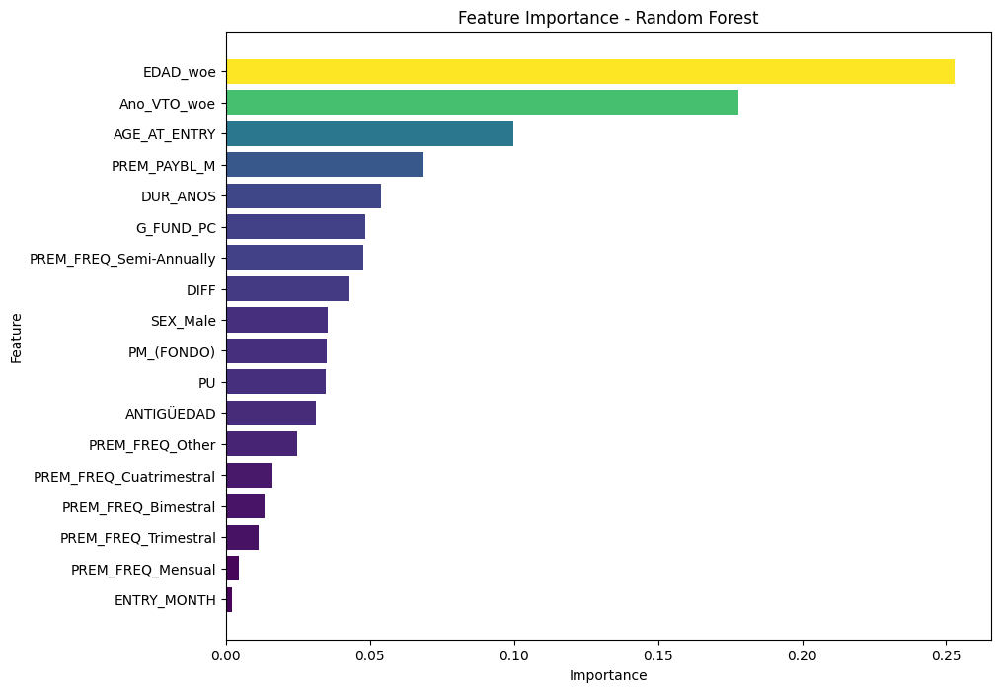

Best F1 score for Random Forest with smoteenn on Training Set: 0.5266106442577031
Best F1 score for Random Forest with smoteenn on Test Set: 0.31643625192012287

Class distribution after resampling with SMOTETomek: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Classification Report for Random Forest with smotemek on Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71665
           1       0.84      0.84      0.84       703

    accuracy                           1.00     72368
   macro avg       0.92      0.92      0.92     72368
weighted avg       1.00      1.00      1.00     72368

Confusion Matrix for Random Forest with smotemek on Training Set:
[[71556   109]
 [  111   592]]
Classification Report for Random Forest with smotemek on Test Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.32      0.35      0.34       176

    accuracy                           0.99     18092
   macro avg       0.66      0.67      0.67     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Random Forest with smotemek on Test Set:
[[17787   129]
 [  114    62]]


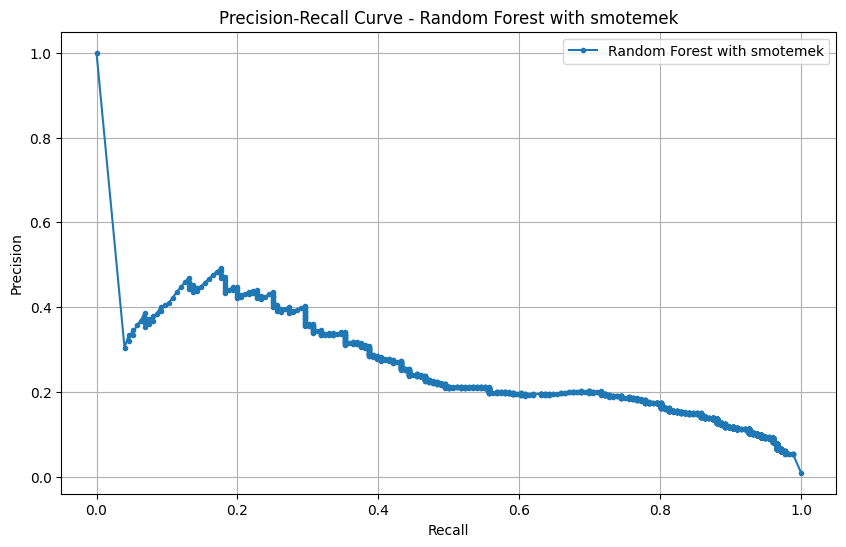

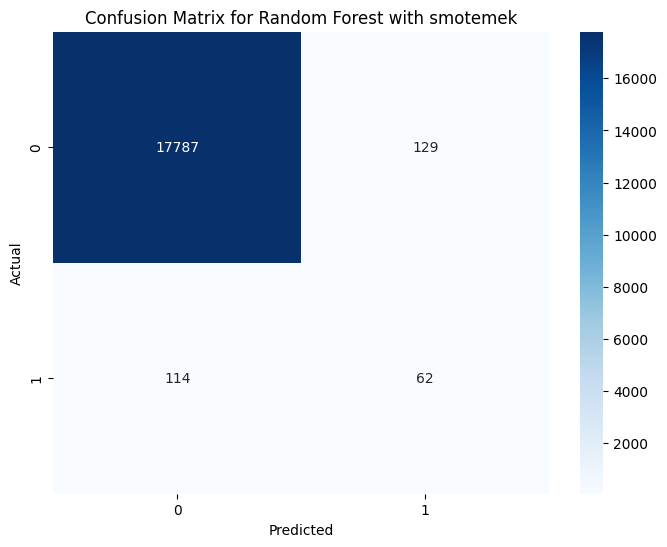

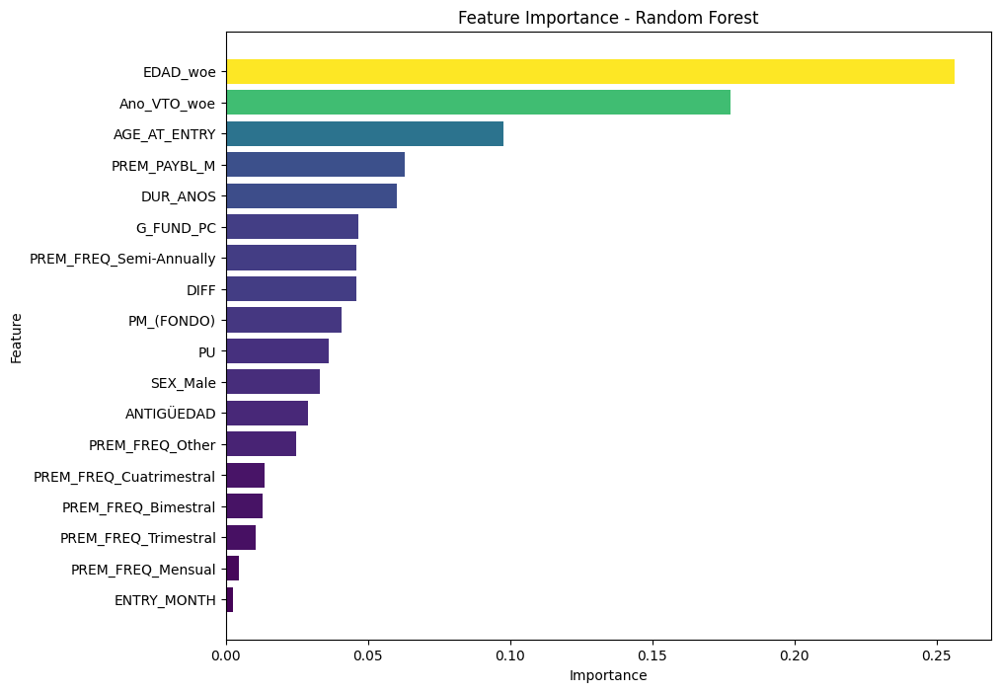

Best F1 score for Random Forest with smotemek on Training Set: 0.8433048433048433
Best F1 score for Random Forest with smotemek on Test Set: 0.33787465940054495

Class distribution after resampling with ADASYN: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Classification Report for Random Forest with adasyn on Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71665
           1       0.88      0.84      0.86       703

    accuracy                           1.00     72368
   macro avg       0.94      0.92      0.93     72368
weighted avg       1.00      1.00      1.00     72368

Confusion Matrix for Random Forest with adasyn on Training Set:
[[71587    78]
 [  109   594]]
Classification Report for Random Forest with adasyn on Test Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.34      0.36      0.35       176

    accuracy                           0.99     18092
   macro avg       0.67      0.68      0.67     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Random Forest with adasyn on Test Set:
[[17793   123]
 [  113    63]]


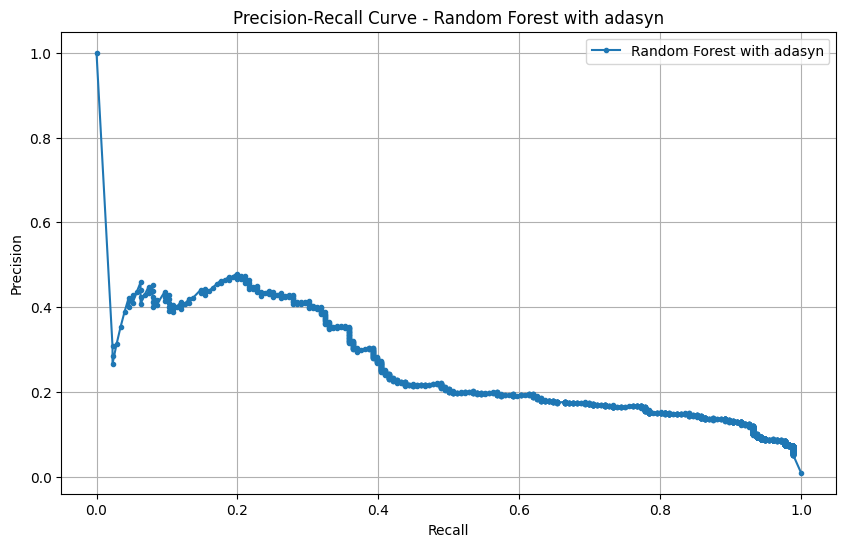

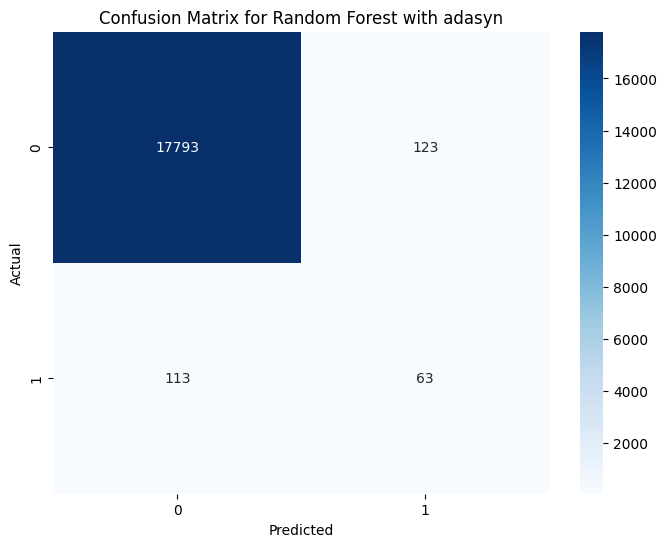

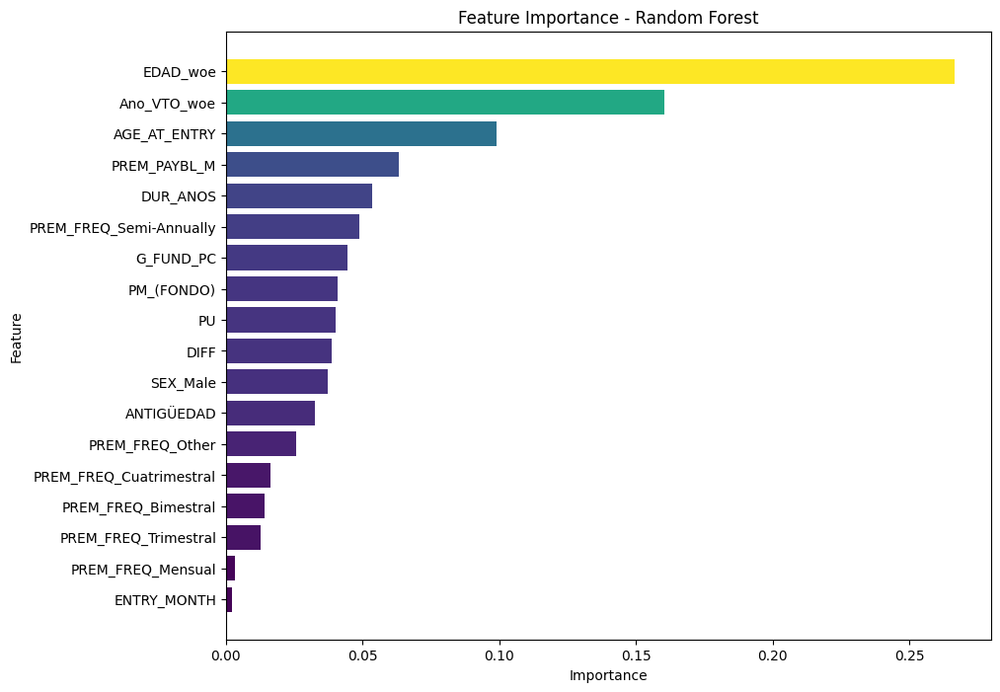

Best F1 score for Random Forest with adasyn on Training Set: 0.864
Best F1 score for Random Forest with adasyn on Test Set: 0.34806629834254144

Class distribution after resampling with SMOTE: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Gradient Boosting with oversampler on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     71665
           1       0.58      0.73      0.65       703

    accuracy                           0.99     72368
   macro avg       0.79      0.86      0.82     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Gradient Boosting with oversampler on Training Set:
[[71288   377]
 [  188   515]]
Classification Report for Gradient Boosting with oversampler on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.38      0.51      0.44       176

    accuracy                           0.99     18092
   macro avg       0.69      0.75      0.71     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting with oversampler on Test Set:
[[17773   143]
 [   8

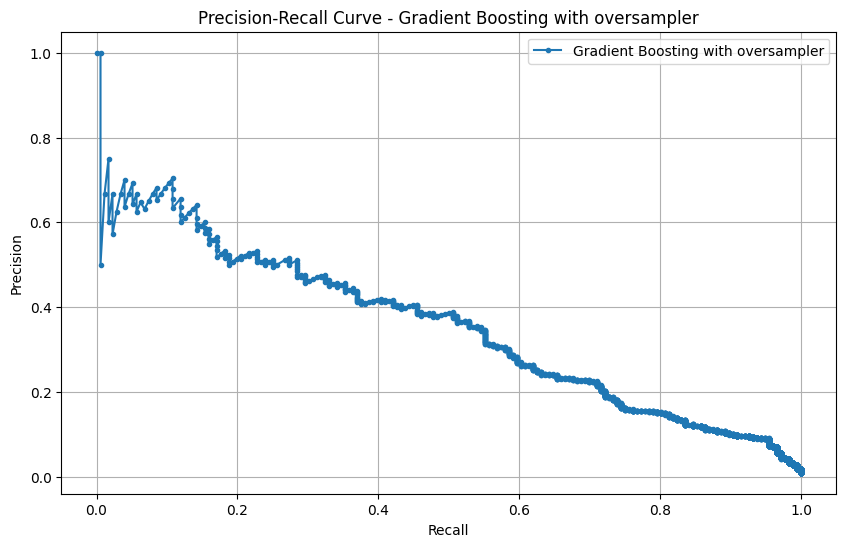

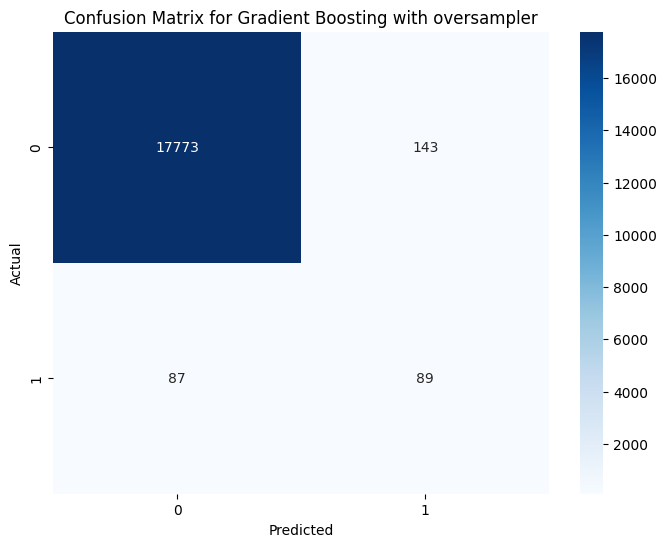

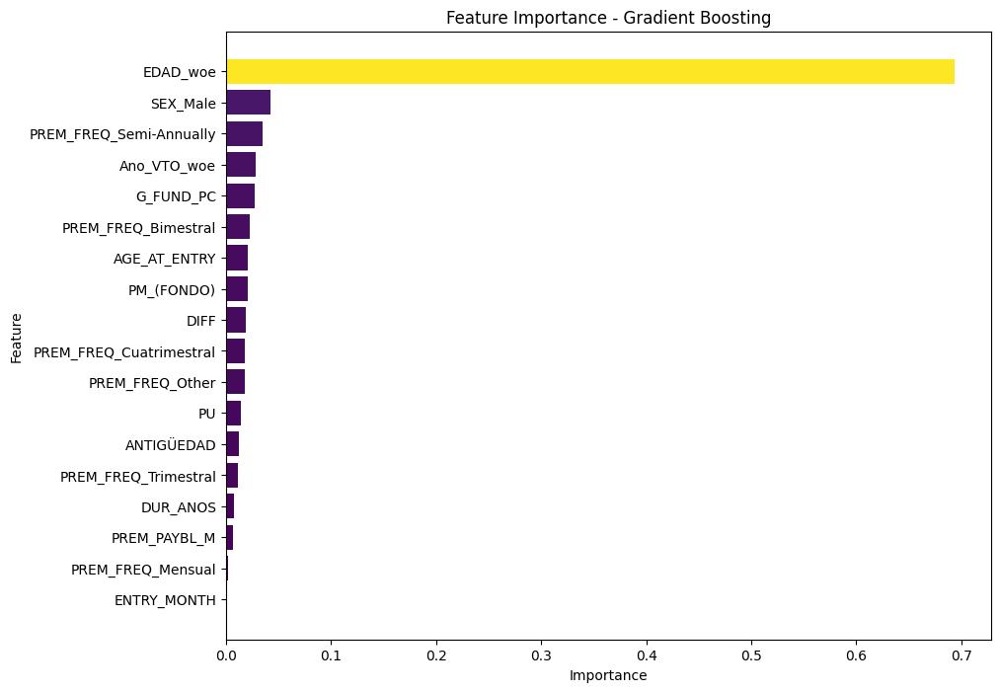

Best F1 score for Gradient Boosting with oversampler on Training Set: 0.64576802507837
Best F1 score for Gradient Boosting with oversampler on Test Set: 0.4362745098039216

Class distribution after resampling with TomekLinks: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Gradient Boosting with tomeklinks on Training Set:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     71665
           1       0.81      0.61      0.70       703

    accuracy                           0.99     72368
   macro avg       0.90      0.81      0.85     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Gradient Boosting with tomeklinks on Training Set:
[[71566    99]
 [  272   431]]
Classification Report for Gradient Boosting with tomeklinks on Test Set:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99     17916
           1       0.39      0.27      0.32       176

    accuracy                           0.99     18092
   macro avg       0.69      0.63      0.66     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting with tomeklinks on Test Set:
[[17844    72]
 [  129   

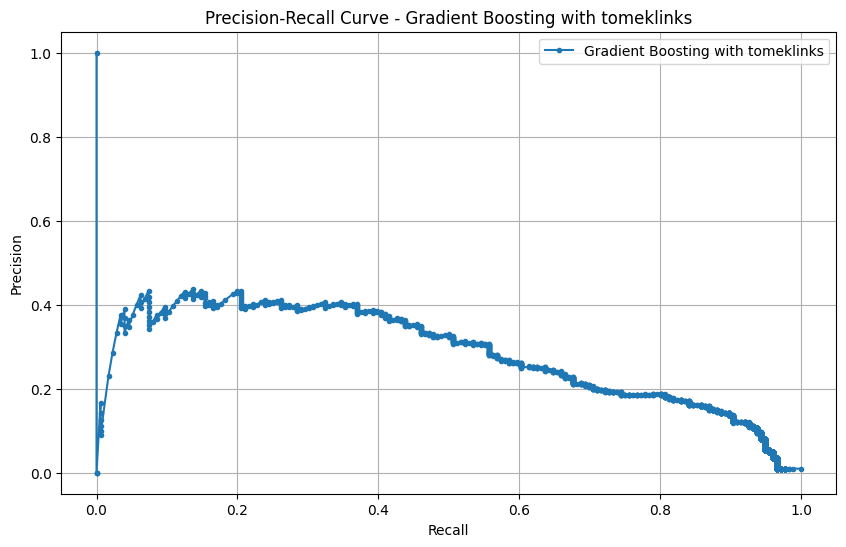

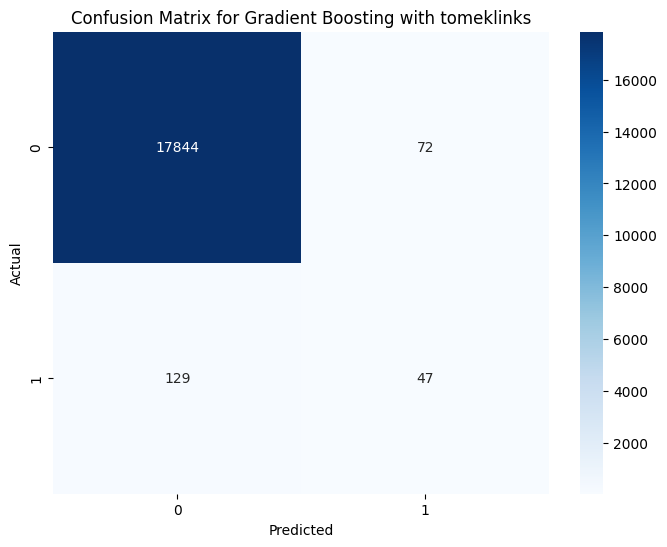

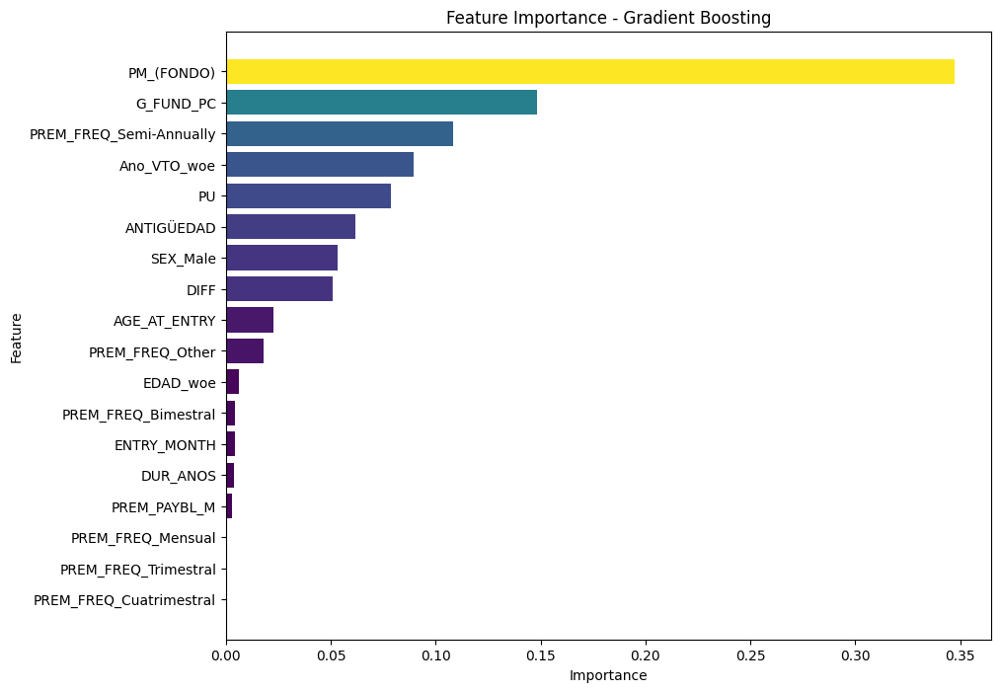

Best F1 score for Gradient Boosting with tomeklinks on Training Set: 0.6991078669910786
Best F1 score for Gradient Boosting with tomeklinks on Test Set: 0.31864406779661014

Class distribution after resampling with EditedNearestNeighbours: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Gradient Boosting with enn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     71665
           1       0.46      0.66      0.54       703

    accuracy                           0.99     72368
   macro avg       0.73      0.83      0.77     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Gradient Boosting with enn on Training Set:
[[71109   556]
 [  236   467]]
Classification Report for Gradient Boosting with enn on Test Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.30      0.45      0.36       176

    accuracy                           0.98     18092
   macro avg       0.65      0.72      0.68     18092
weighted avg       0.99      0.98      0.99     18092

Confusion Matrix for Gradient Boosting with enn on Test Set:
[[17734   182]
 [   97    79]]


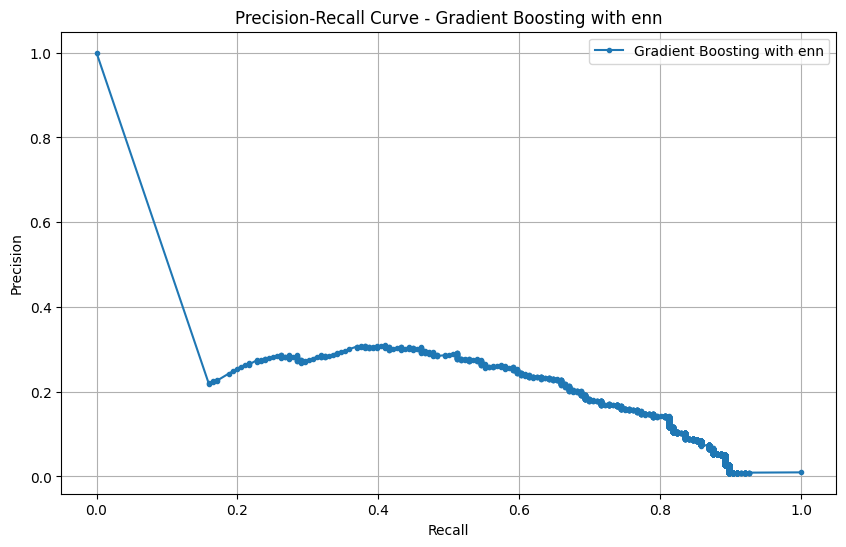

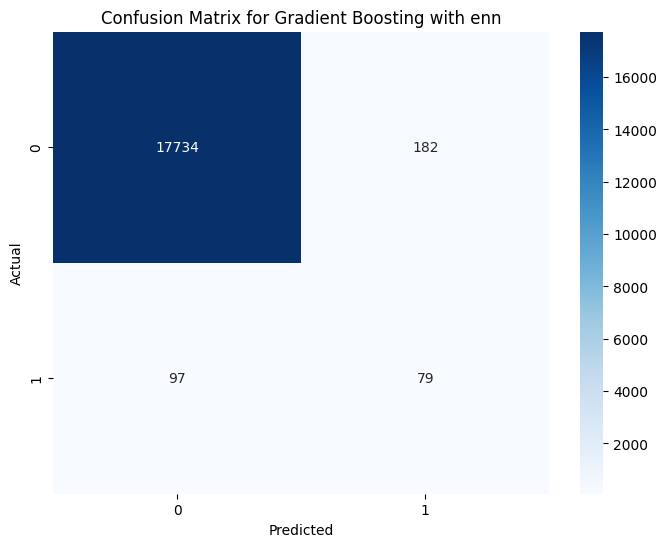

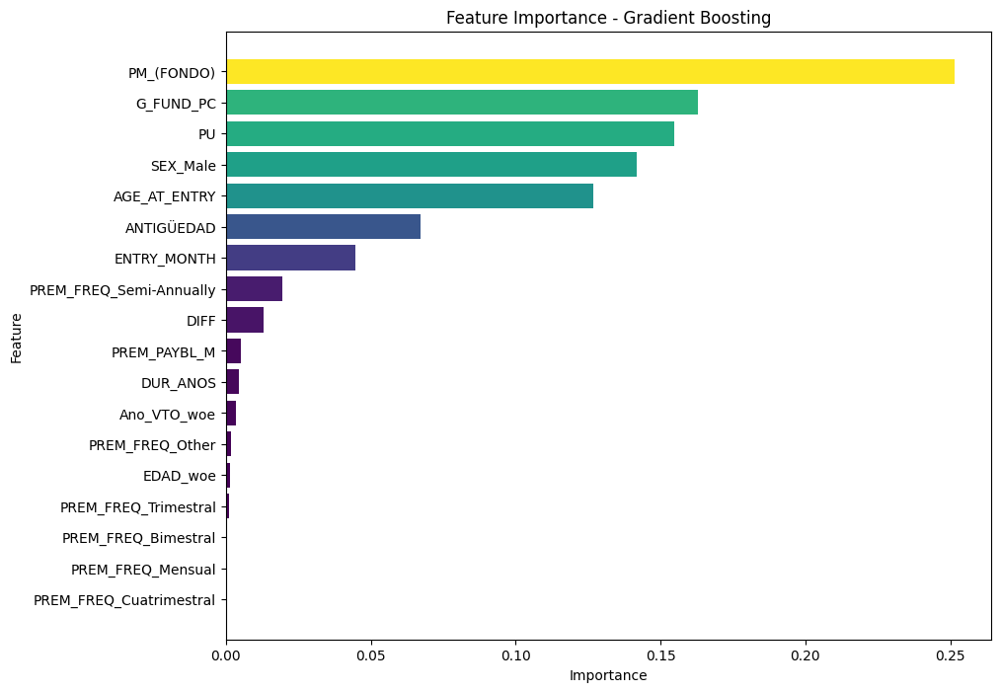

Best F1 score for Gradient Boosting with enn on Training Set: 0.541135573580533
Best F1 score for Gradient Boosting with enn on Test Set: 0.36155606407322655

Class distribution after resampling with SMOTEENN: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Gradient Boosting with smoteenn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     71665
           1       0.40      0.84      0.54       703

    accuracy                           0.99     72368
   macro avg       0.70      0.91      0.77     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Gradient Boosting with smoteenn on Training Set:
[[70769   896]
 [  115   588]]
Classification Report for Gradient Boosting with smoteenn on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.27      0.61      0.38       176

    accuracy                           0.98     18092
   macro avg       0.63      0.80      0.68     18092
weighted avg       0.99      0.98      0.98     18092

Confusion Matrix for Gradient Boosting with smoteenn on Test Set:
[[17628   288]
 [   68   108]]


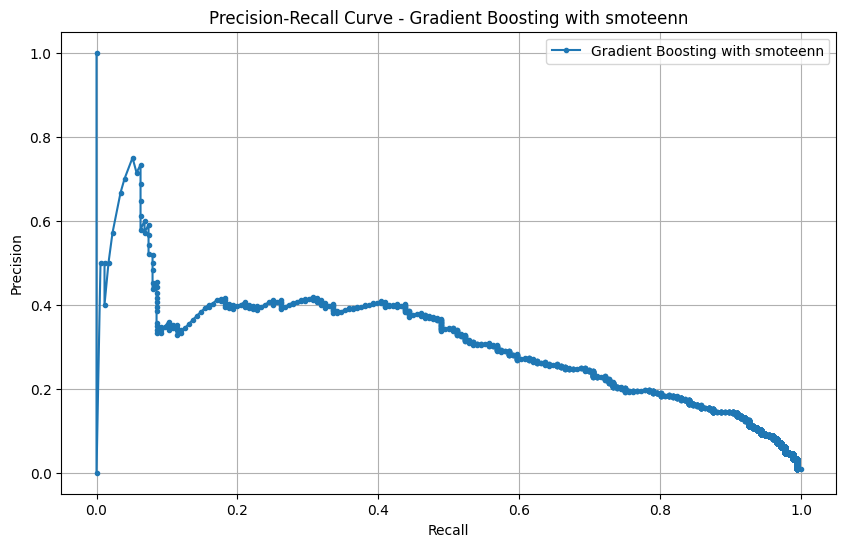

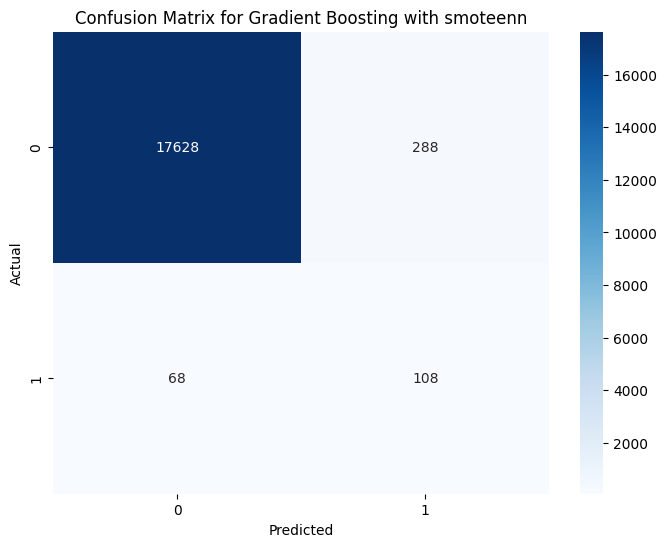

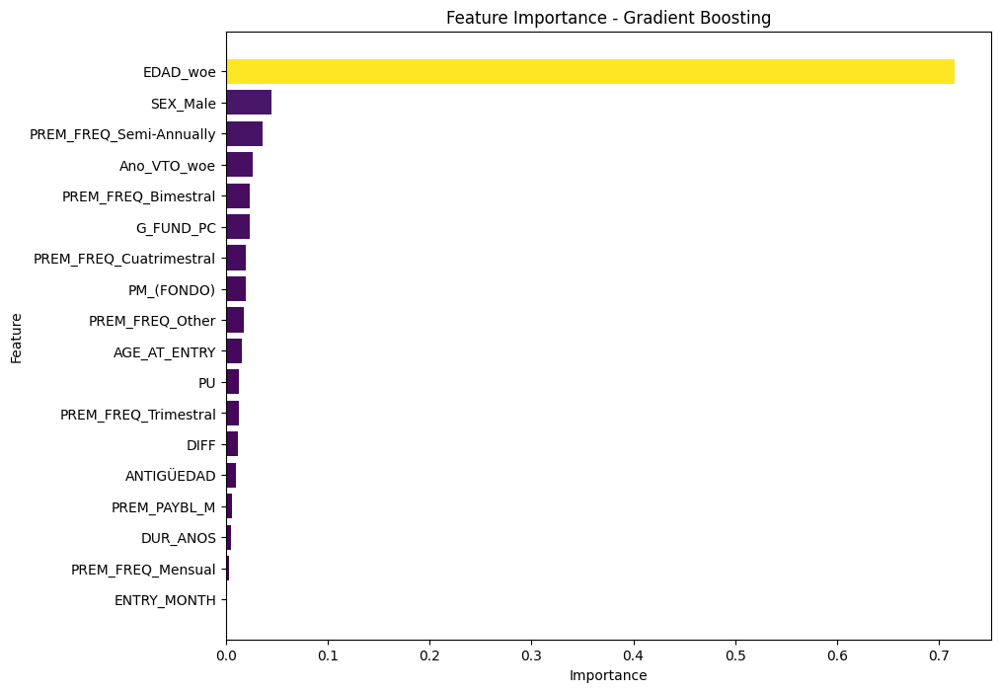

Best F1 score for Gradient Boosting with smoteenn on Training Set: 0.5377229080932785
Best F1 score for Gradient Boosting with smoteenn on Test Set: 0.3776223776223776

Class distribution after resampling with SMOTETomek: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Gradient Boosting with smotemek on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     71665
           1       0.57      0.72      0.63       703

    accuracy                           0.99     72368
   macro avg       0.78      0.86      0.81     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Gradient Boosting with smotemek on Training Set:
[[71275   390]
 [  196   507]]
Classification Report for Gradient Boosting with smotemek on Test Set:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.36      0.49      0.42       176

    accuracy                           0.99     18092
   macro avg       0.68      0.74      0.71     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting with smotemek on Test Set:
[[17764   152]
 [   89    87]]


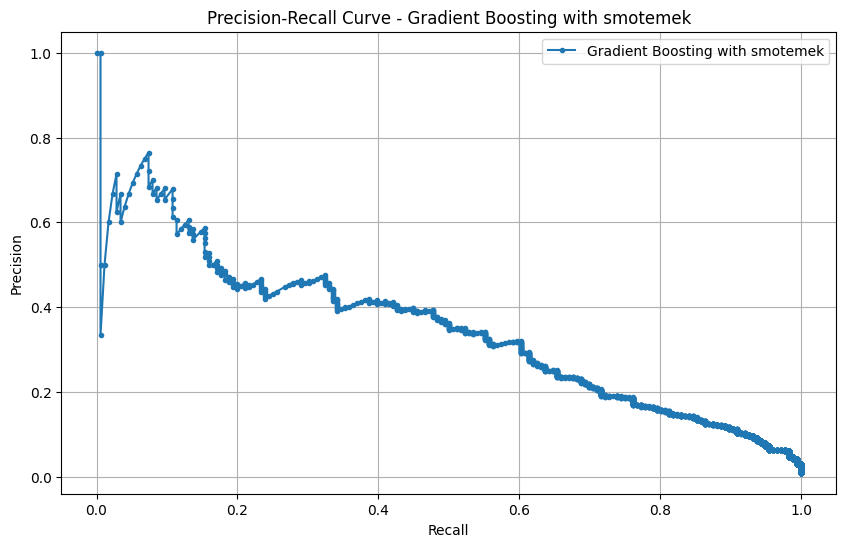

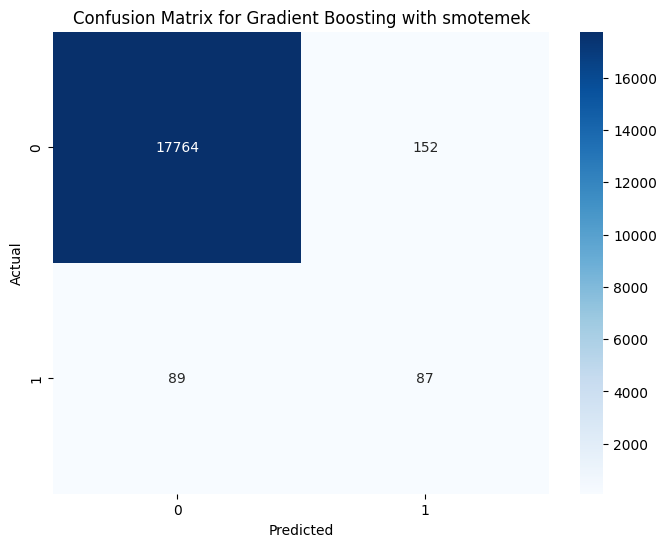

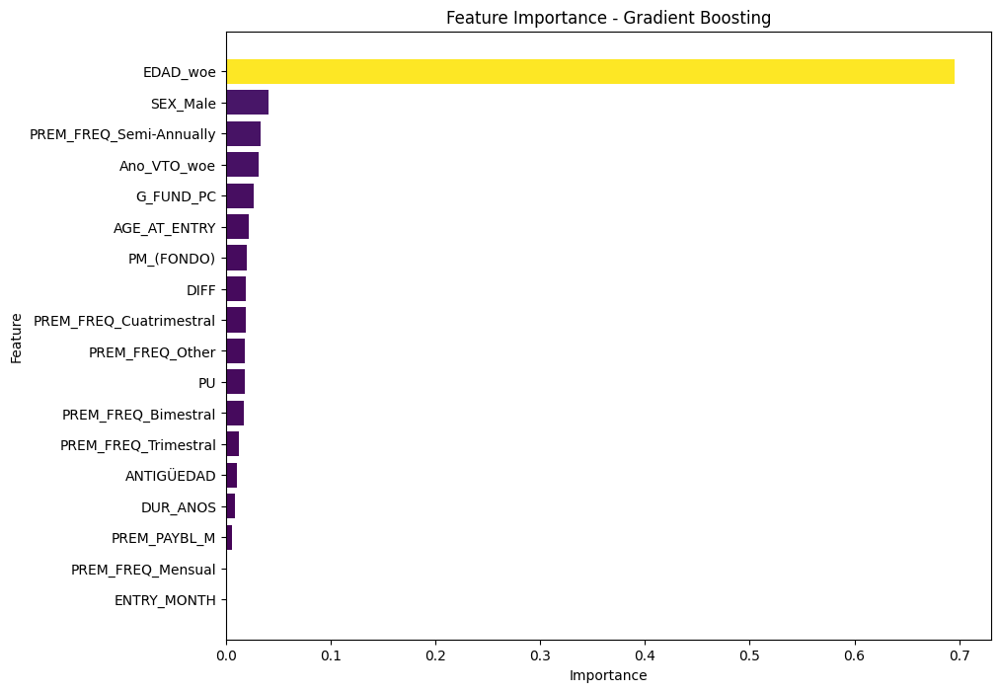

Best F1 score for Gradient Boosting with smotemek on Training Set: 0.63375
Best F1 score for Gradient Boosting with smotemek on Test Set: 0.41927710843373495

Class distribution after resampling with ADASYN: Counter({'RESCATE': 1})


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Classification Report for Gradient Boosting with adasyn on Training Set:
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     71665
           1       0.56      0.72      0.63       703

    accuracy                           0.99     72368
   macro avg       0.78      0.86      0.81     72368
weighted avg       0.99      0.99      0.99     72368

Confusion Matrix for Gradient Boosting with adasyn on Training Set:
[[71261   404]
 [  194   509]]
Classification Report for Gradient Boosting with adasyn on Test Set:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.34      0.49      0.40       176

    accuracy                           0.99     18092
   macro avg       0.67      0.74      0.70     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting with adasyn on Test Set:
[[17748   168]
 [   90    86]]


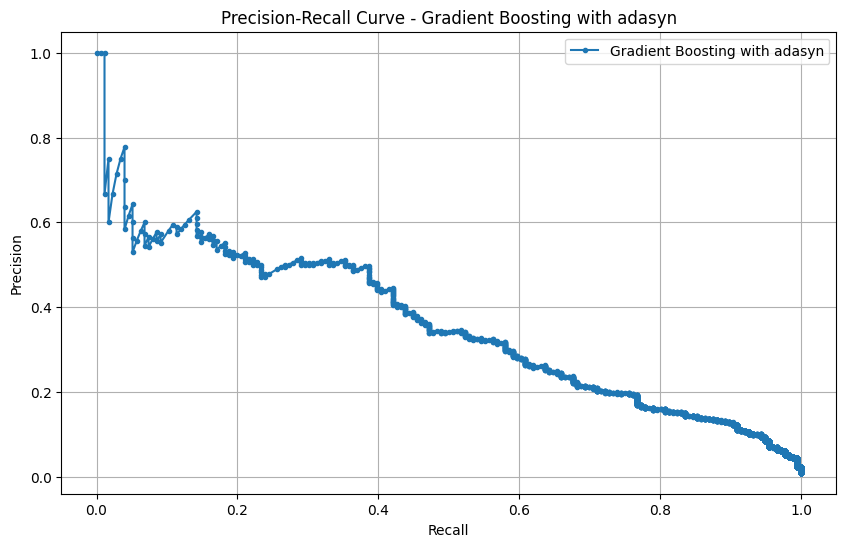

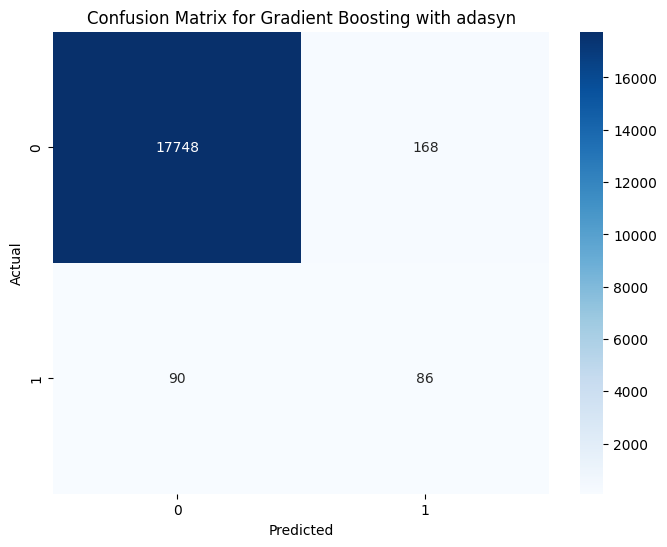

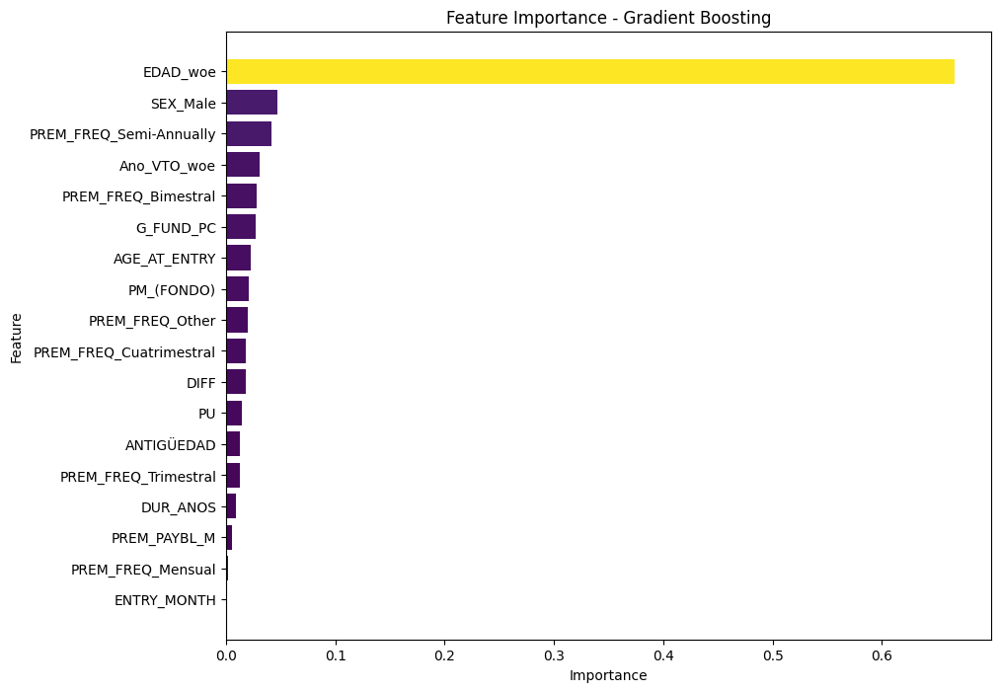

Best F1 score for Gradient Boosting with adasyn on Training Set: 0.629950495049505
Best F1 score for Gradient Boosting with adasyn on Test Set: 0.4



In [16]:

f1_scorer = make_scorer(f1_score, greater_is_better=True)

# Función para aplicar remuestreo
def resample_data(resampler, X, y):
    X_resampled, y_resampled = resampler.fit_resample(X, y)
    print(f"Class distribution after resampling with {resampler.__class__.__name__}: {Counter(y_resampled)}")
    return X_resampled, y_resampled

# Función para evaluar modelos con diferentes técnicas de remuestreo
def evaluate_model(resampler, resampler_name, model, model_name):
    # Preprocesar los datos
    X_train_preprocessed = preprocessor.fit_transform(X_train)
    X_test_preprocessed = preprocessor.transform(X_test)
    
    # Aplicar remuestreo
    X_resampled, y_resampled = resample_data(resampler, X_train_preprocessed, y_train)
    
    # Ajustar el modelo
    model.fit(X_resampled, y_resampled)
    
    # Predecir en el conjunto de prueba
    y_train_pred = model.predict(X_train_preprocessed)
    y_test_pred = model.predict(X_test_preprocessed)
    
    # Reporte de clasificación y matriz de confusión para conjunto de entrenamiento
    print(f"Classification Report for {model_name} with {resampler_name} on Training Set:")
    print(classification_report(y_train, y_train_pred))
    print(f"Confusion Matrix for {model_name} with {resampler_name} on Training Set:")
    conf_matrix_train = confusion_matrix(y_train, y_train_pred)
    print(conf_matrix_train)
    
    # Reporte de clasificación y matriz de confusión para conjunto de prueba
    print(f"Classification Report for {model_name} with {resampler_name} on Test Set:")
    print(classification_report(y_test, y_test_pred))
    print(f"Confusion Matrix for {model_name} with {resampler_name} on Test Set:")
    conf_matrix_test = confusion_matrix(y_test, y_test_pred)
    print(conf_matrix_test)
    
    # Curva precision-recall
    y_test_pred_proba = model.predict_proba(X_test_preprocessed)[:, 1]
    precision, recall, _ = precision_recall_curve(y_test, y_test_pred_proba)
    plt.figure(figsize=(10, 6))
    plt.plot(recall, precision, marker='.', label=f'{model_name} with {resampler_name}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {model_name} with {resampler_name}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot Confusion Matrix for Test Set
    conf_matrix_df = pd.DataFrame(conf_matrix_test, index=[0, 1], columns=[0, 1])
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {model_name} with {resampler_name}')
    plt.show()

    # Plot Feature Importance for Tree-based models
    if model_name in ['Random Forest', 'Gradient Boosting']:
        feature_importances = model.feature_importances_
        feature_names = numeric_features + list(preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        plt.figure(figsize=(10, 8))
        plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color=plt.cm.viridis(feature_importance_df['Importance'] / max(feature_importance_df['Importance'])))
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title(f'Feature Importance - {model_name}')
        plt.gca().invert_yaxis()
        plt.show()
    if model_name == 'Logistic Regression':
        coefficients = model.coef_[0]
        feature_names = numeric_features + list(preprocessor.named_transformers_['cat']['onehot'].get_feature_names_out(categorical_features))
        importance_df = pd.DataFrame({
            'Feature': feature_names,
            'Importance': coefficients
        })
        importance_df['Abs_Importance'] = np.abs(importance_df['Importance'])
        importance_df = importance_df.sort_values(by='Abs_Importance', ascending=False)
        
        plt.figure(figsize=(10, 8))
        plt.barh(importance_df['Feature'], importance_df['Importance'], color=plt.cm.viridis(importance_df['Abs_Importance'] / max(importance_df['Abs_Importance'])))
        plt.xlabel('Coefficient Value')
        plt.ylabel('Feature')
        plt.title('Feature Importance - Logistic Regression')
        plt.gca().invert_yaxis()
        plt.show()
    
    # Guardar el mejor modelo
    joblib.dump(model, f'best_{model_name.lower().replace(" ", "_")}_model_{resampler_name}.joblib')
    
    print(f"Best F1 score for {model_name} with {resampler_name} on Training Set: {f1_score(y_train, y_train_pred)}")
    print(f"Best F1 score for {model_name} with {resampler_name} on Test Set: {f1_score(y_test, y_test_pred)}\n")

# Definir los modelos
models = {
    'Logistic Regression': LogisticRegression(class_weight='balanced', random_state=42, C=0.1, penalty='l1', solver='liblinear'),
    'Random Forest': RandomForestClassifier(random_state=42, class_weight='balanced', min_samples_leaf=1, min_samples_split=10, n_estimators=100),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42, learning_rate=0.2, max_depth=5, n_estimators=200)
}

# Evaluar modelos con diferentes técnicas de remuestreo
resamplers = {
    'oversampler': SMOTE(random_state=42),
    'tomeklinks': TomekLinks(),
    'enn': EditedNearestNeighbours(sampling_strategy='majority'),
    'smoteenn': SMOTEENN(random_state=42, sampling_strategy='minority'), 
    'smotemek': SMOTETomek(sampling_strategy='auto'), 
    'adasyn': ADASYN(sampling_strategy='minority')
}

for model_name, model in models.items():
    for resampler_name, resampler in resamplers.items():
        evaluate_model(resampler, resampler_name, model, model_name)

# Modelo de regresion logistica

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversio

Mejores hiperparámetros para Regresión Logística:  {'classifier__C': 0.1, 'classifier__l1_ratio': None, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs'}
AUC en Conjunto de Entrenamiento: 0.9575676459709258
AUC en Conjunto de Prueba: 0.9616160136191113
Classification Report (F2 Score Threshold) - Entrenamiento:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     71665
           1       0.22      0.54      0.31       703

    accuracy                           0.98     72368
   macro avg       0.61      0.76      0.65     72368
weighted avg       0.99      0.98      0.98     72368

Confusion Matrix (F2 Score Threshold) - Entrenamiento:
[[70282  1383]
 [  322   381]]
Classification Report (F2 Score Threshold) - Prueba:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.23      0.58      0.32       176

    accuracy                           0.98    

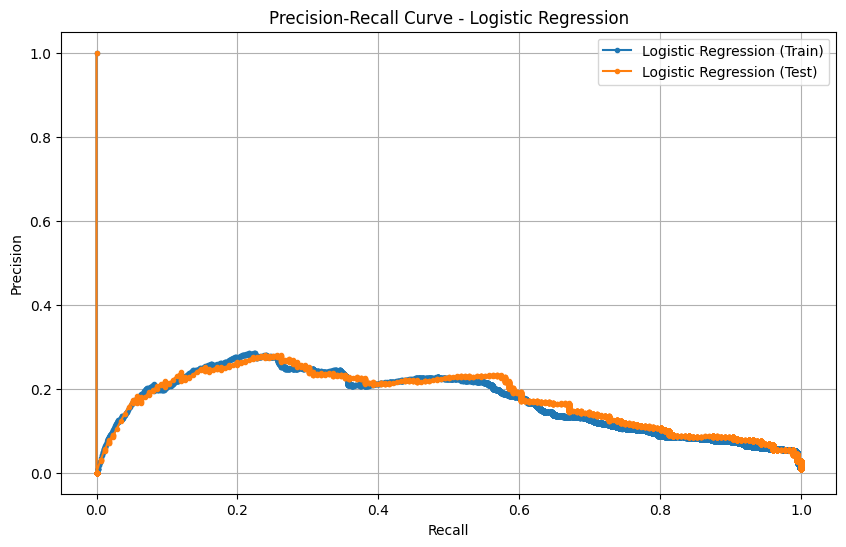

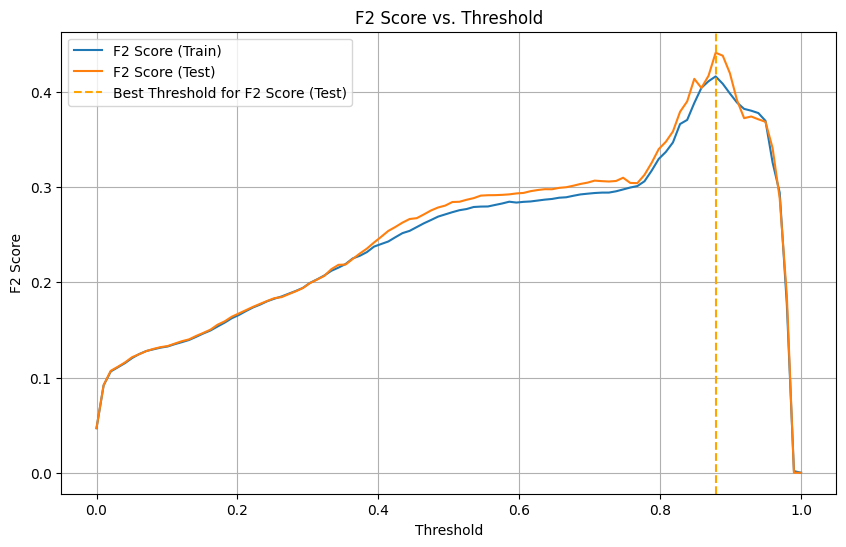

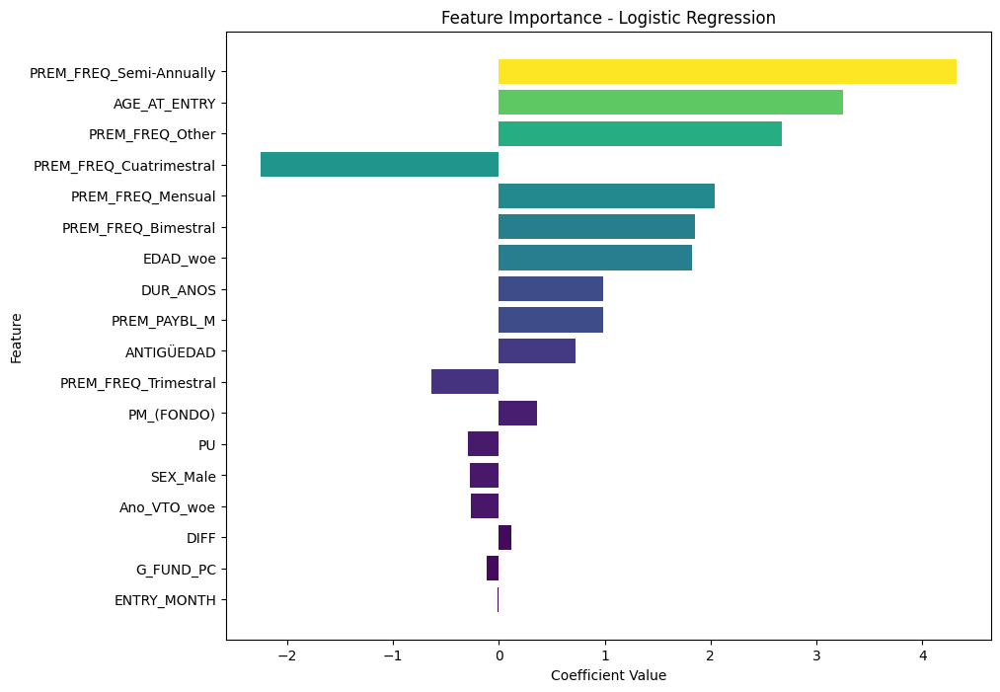

Importancia de características y Razón de Probabilidades (Odds Ratios):
                    Feature  Coefficient  Odds Ratio
15  PREM_FREQ_Semi-Annually     4.319243   75.131744
2              AGE_AT_ENTRY     3.252786   25.862302
14          PREM_FREQ_Other     2.672250   14.472492
12  PREM_FREQ_Cuatrimestral    -2.247458    0.105667
13        PREM_FREQ_Mensual     2.039954    7.690257
11      PREM_FREQ_Bimestral     1.850657    6.363997
10                 EDAD_woe     1.822180    6.185326
7                  DUR_ANOS     0.983225    2.673062
5              PREM_PAYBL_M     0.983225    2.673062
6                ANTIGÜEDAD     0.722348    2.059262
16     PREM_FREQ_Trimestral    -0.635417    0.529715
9                PM_(FONDO)     0.358591    1.431311
0                        PU    -0.287507    0.750131
17                 SEX_Male    -0.275031    0.759549
8               Ano_VTO_woe    -0.261068    0.770228
4                      DIFF     0.116732    1.123818
1                 G_FUND_PC

In [17]:
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, ParameterGrid
from sklearn.metrics import fbeta_score, roc_auc_score, precision_recall_curve, classification_report, confusion_matrix, make_scorer, recall_score, precision_score
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Define el modelo de regresión logística
lr_model = LogisticRegression(class_weight='balanced', random_state=42)

# Crea el pipeline con preprocesamiento y modelo de regresión logística
pipeline_lr = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', lr_model)])

# Define la cuadrícula de hiperparámetros para GridSearchCV
param_grid_lr = {
    'classifier__solver': ['liblinear', 'lbfgs', 'saga'],
    'classifier__C': [0.01, 0.1, 1, 10, 100],
    'classifier__penalty': ['l1', 'l2', 'elasticnet'],
    'classifier__l1_ratio': [0.0, 0.5, 1.0]  # Sólo aplicable si penalty='elasticnet'
}

# Filtra combinaciones de parámetros inválidas
valid_params = []
for params in ParameterGrid(param_grid_lr):
    if params['classifier__penalty'] == 'elasticnet' and params['classifier__solver'] != 'saga':
        continue
    if params['classifier__penalty'] in ['l1', 'elasticnet'] and params['classifier__solver'] == 'lbfgs':
        continue
    if params['classifier__penalty'] != 'elasticnet':
        params['classifier__l1_ratio'] = None
    valid_params.append(params)

# Asegura que todos los parámetros sean listas o arrays
for params in valid_params:
    for key, value in params.items():
        if not isinstance(value, (list, np.ndarray)):
            params[key] = [value]

# Custom scorer to optimize F2 score
f2_scorer = make_scorer(fbeta_score, beta=2, greater_is_better=True)

# Inicializa GridSearchCV con las combinaciones válidas de hiperparámetros
grid_search_lr = GridSearchCV(pipeline_lr, valid_params, scoring=f2_scorer, cv=5)
grid_search_lr.fit(X_train, y_train)

# Obtén el mejor modelo
best_model_lr = grid_search_lr.best_estimator_
print("Mejores hiperparámetros para Regresión Logística: ", grid_search_lr.best_params_)

# Predice probabilidades y clases para ambos conjuntos
y_train_pred_proba = best_model_lr.predict_proba(X_train)[:, 1]
y_test_pred_proba = best_model_lr.predict_proba(X_test)[:, 1]

# Calcula AUC para ambos conjuntos
auc_train = roc_auc_score(y_train, y_train_pred_proba)
auc_test = roc_auc_score(y_test, y_test_pred_proba)
print('AUC en Conjunto de Entrenamiento:', auc_train)
print('AUC en Conjunto de Prueba:', auc_test)

# Encuentra el mejor umbral para F2 score en el conjunto de prueba
thresholds = np.linspace(0, 1, 100)
f2_scores_train = [fbeta_score(y_train, y_train_pred_proba > t, beta=2) for t in thresholds]
f2_scores_test = [fbeta_score(y_test, y_test_pred_proba > t, beta=2) for t in thresholds]
best_threshold_f2 = thresholds[np.argmax(f2_scores_test)]

# Usa el mejor umbral para hacer predicciones finales con F2 score
y_train_pred_best_threshold_f2 = (y_train_pred_proba > best_threshold_f2).astype(int)
y_test_pred_best_threshold_f2 = (y_test_pred_proba > best_threshold_f2).astype(int)

# Reporte de clasificación y matriz de confusión para ambos conjuntos
print("Classification Report (F2 Score Threshold) - Entrenamiento:")
print(classification_report(y_train, y_train_pred_best_threshold_f2))
print("Confusion Matrix (F2 Score Threshold) - Entrenamiento:")
print(confusion_matrix(y_train, y_train_pred_best_threshold_f2))

print("Classification Report (F2 Score Threshold) - Prueba:")
print(classification_report(y_test, y_test_pred_best_threshold_f2))
print("Confusion Matrix (F2 Score Threshold) - Prueba:")
print(confusion_matrix(y_test, y_test_pred_best_threshold_f2))

# Curva precision-recall
precision_train, recall_train, _ = precision_recall_curve(y_train, y_train_pred_proba)
precision_test, recall_test, _ = precision_recall_curve(y_test, y_test_pred_proba)
plt.figure(figsize=(10, 6))
plt.plot(recall_train, precision_train, marker='.', label='Logistic Regression (Train)')
plt.plot(recall_test, precision_test, marker='.', label='Logistic Regression (Test)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Logistic Regression')
plt.legend()
plt.grid(True)
plt.show()

# Plot de las métricas F2 en función del umbral
plt.figure(figsize=(10, 6))
plt.plot(thresholds, f2_scores_train, label='F2 Score (Train)')
plt.plot(thresholds, f2_scores_test, label='F2 Score (Test)')
plt.axvline(best_threshold_f2, color='orange', linestyle='--', label='Best Threshold for F2 Score (Test)')
plt.xlabel('Threshold')
plt.ylabel('F2 Score')
plt.title('F2 Score vs. Threshold')
plt.legend()
plt.grid(True)
plt.show()

# Importancia de características y odds ratios
coefficients = best_model_lr.named_steps['classifier'].coef_[0]
feature_names = numeric_features + list(best_model_lr.named_steps['preprocessor'].transformers_[1][1].get_feature_names_out(categorical_features))
importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Coefficient': coefficients
})
importance_df['Odds Ratio'] = np.exp(importance_df['Coefficient'])
importance_df['Abs_Coefficient'] = np.abs(importance_df['Coefficient'])
importance_df = importance_df.sort_values(by='Abs_Coefficient', ascending=False)

plt.figure(figsize=(10, 8))
plt.barh(importance_df['Feature'], importance_df['Coefficient'], color=plt.cm.viridis(importance_df['Abs_Coefficient'] / max(importance_df['Abs_Coefficient'])))
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.title('Feature Importance - Logistic Regression')
plt.gca().invert_yaxis()
plt.show()

print("Importancia de características y Razón de Probabilidades (Odds Ratios):")
print(importance_df[['Feature', 'Coefficient', 'Odds Ratio']])


Ver que threshold optimiza cada metrica 

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\mbuendiarascon\Ap

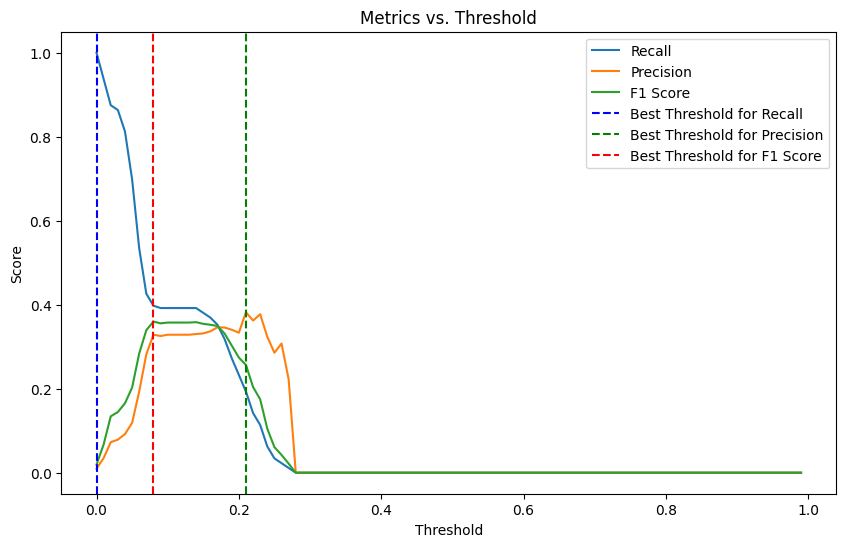

AUC: 0.9434972104670278


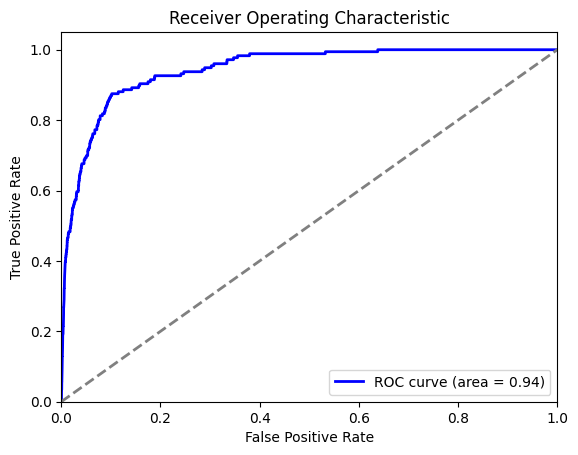

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.33      0.40      0.36       176

    accuracy                           0.99     18092
   macro avg       0.66      0.69      0.68     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix:
[[17773   143]
 [  106    70]]
Best Parameters: {'classifier__C': 0.01, 'classifier__penalty': 'l1'}
Best Threshold for Recall: 0.0
Best Threshold for Precision: 0.21
Best Threshold for F1 Score: 0.08


In [ ]:

# Perform GridSearchCV
grid_search = GridSearchCV(model, param_grid, scoring=scorers, refit='f1_score', cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

# Best model after GridSearchCV
best_model = grid_search.best_estimator_

# Predict probabilities
y_pred_prob = best_model.predict_proba(X_test)[:, 1]

# Evaluate metrics over a range of thresholds
thresholds = np.arange(0.0, 1.0, 0.01)
recall_scores = [recall_score(y_test, y_pred_prob >= t) for t in thresholds]
precision_scores = [precision_score(y_test, y_pred_prob >= t) for t in thresholds]
f1_scores = [f1_score(y_test, y_pred_prob >= t) for t in thresholds]

# Find the best threshold for each metric
best_threshold_recall = thresholds[np.argmax(recall_scores)]
best_threshold_precision = thresholds[np.argmax(precision_scores)]
best_threshold_f1 = thresholds[np.argmax(f1_scores)]

# Plot the metrics
plt.figure(figsize=(10, 6))
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, f1_scores, label='F1 Score')
plt.axvline(best_threshold_recall, color='blue', linestyle='--', label='Best Threshold for Recall')
plt.axvline(best_threshold_precision, color='green', linestyle='--', label='Best Threshold for Precision')
plt.axvline(best_threshold_f1, color='red', linestyle='--', label='Best Threshold for F1 Score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Metrics vs. Threshold')
plt.legend()
plt.show()

# Predict using the best threshold for F1 score
y_pred_optimized = (y_pred_prob >= best_threshold_f1).astype(int)

# Calculate AUC
auc = roc_auc_score(y_test, y_pred_prob)
print('AUC:', auc)

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

# Print classification report
print('Classification Report:')
print(classification_report(y_test, y_pred_optimized))

# Compute confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_optimized)
print('Confusion Matrix:')
print(conf_matrix)

# Print best parameters and best thresholds
print('Best Parameters:', grid_search.best_params_)
print('Best Threshold for Recall:', best_threshold_recall)
print('Best Threshold for Precision:', best_threshold_precision)
print('Best Threshold for F1 Score:', best_threshold_f1)

# RL, Randon Forest y Gradient Boosting

Evaluating Logistic Regression...


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\utils\validation.py:1310: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


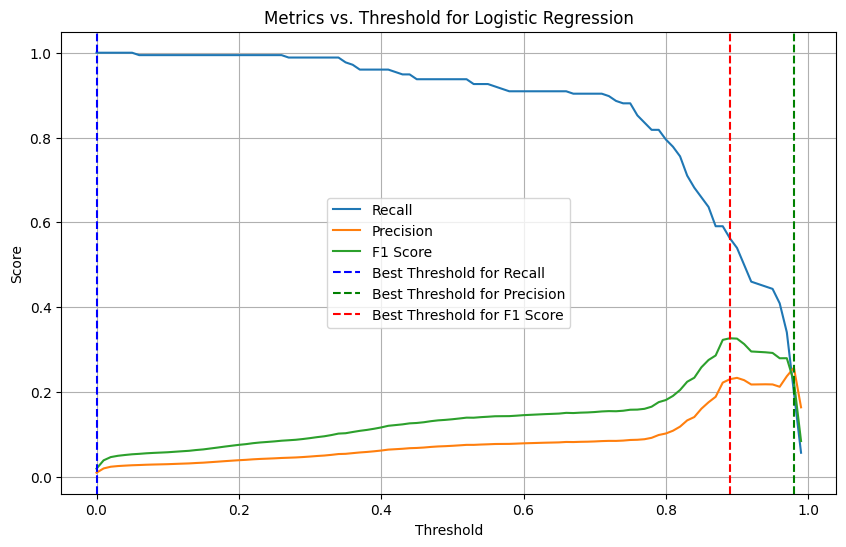

AUC for Logistic Regression: 0.961895093770931


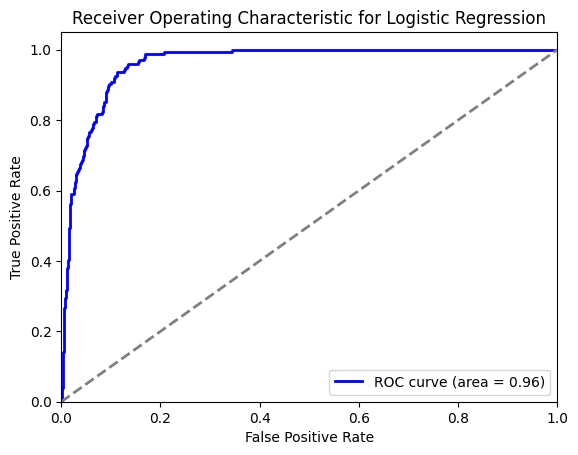

Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.23      0.56      0.33       176

    accuracy                           0.98     18092
   macro avg       0.61      0.77      0.66     18092
weighted avg       0.99      0.98      0.98     18092

Confusion Matrix for Logistic Regression:
[[17585   331]
 [   77    99]]
Best Parameters for Logistic Regression: {'classifier__C': 0.1, 'classifier__penalty': 'l1'}
Best Threshold for Recall for Logistic Regression: 0.0
Best Threshold for Precision for Logistic Regression: 0.98
Best Threshold for F1 Score for Logistic Regression: 0.89




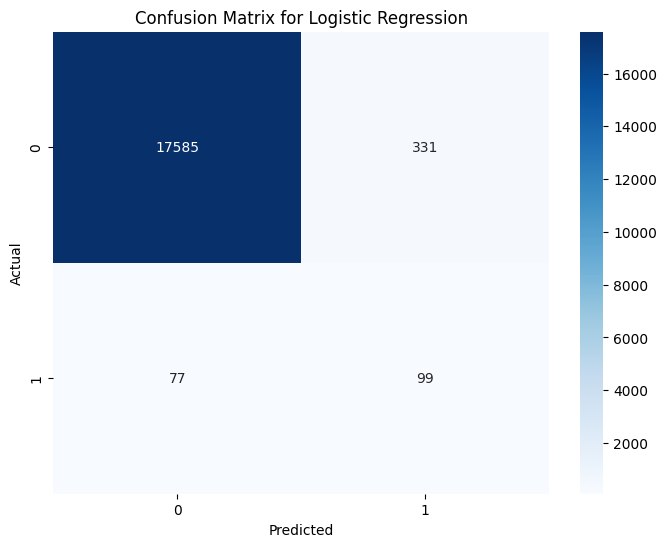

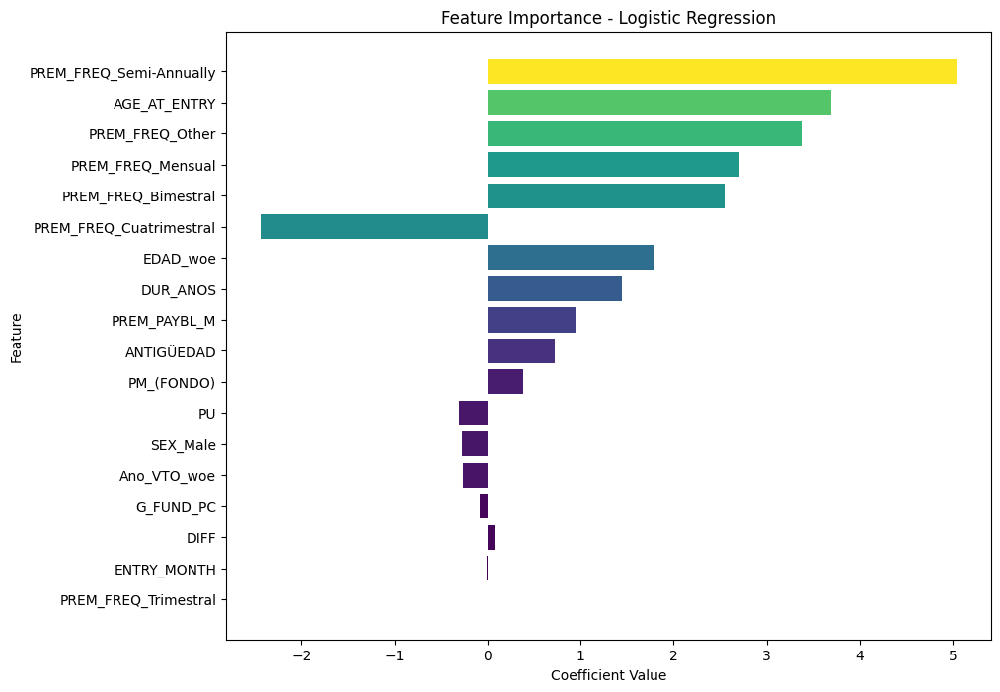

Evaluating Random Forest...


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


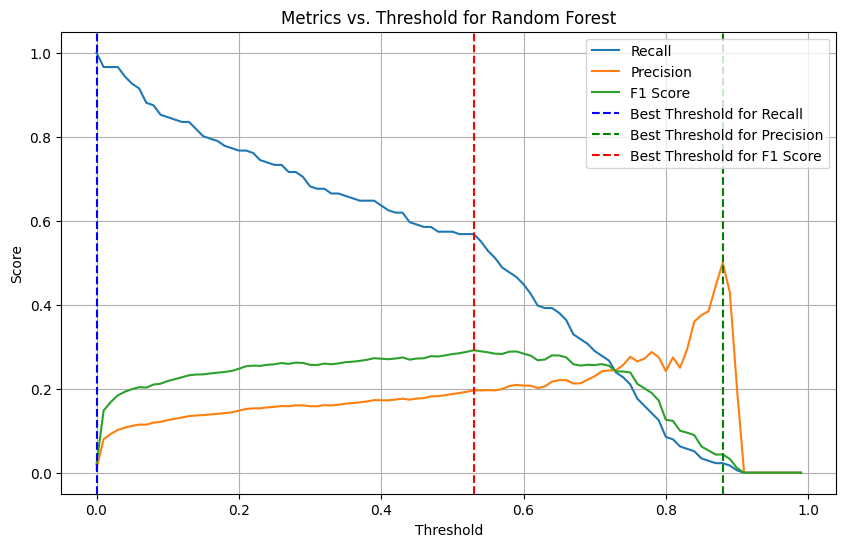

AUC for Random Forest: 0.960651759980921


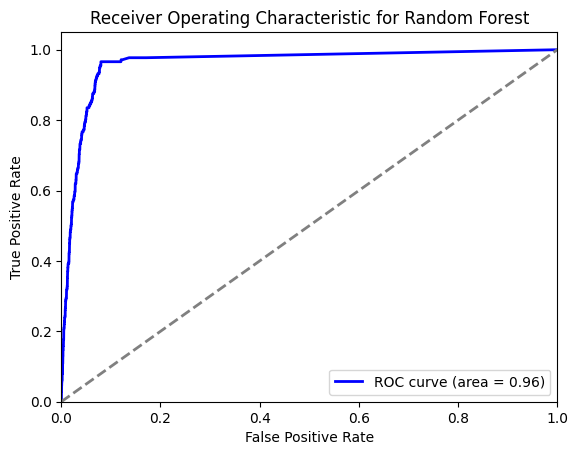

Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.20      0.57      0.29       176

    accuracy                           0.97     18092
   macro avg       0.60      0.77      0.64     18092
weighted avg       0.99      0.97      0.98     18092

Confusion Matrix for Random Forest:
[[17506   410]
 [   76   100]]
Best Parameters for Random Forest: {'classifier__max_depth': 20, 'classifier__n_estimators': 200}
Best Threshold for Recall for Random Forest: 0.0
Best Threshold for Precision for Random Forest: 0.88
Best Threshold for F1 Score for Random Forest: 0.53




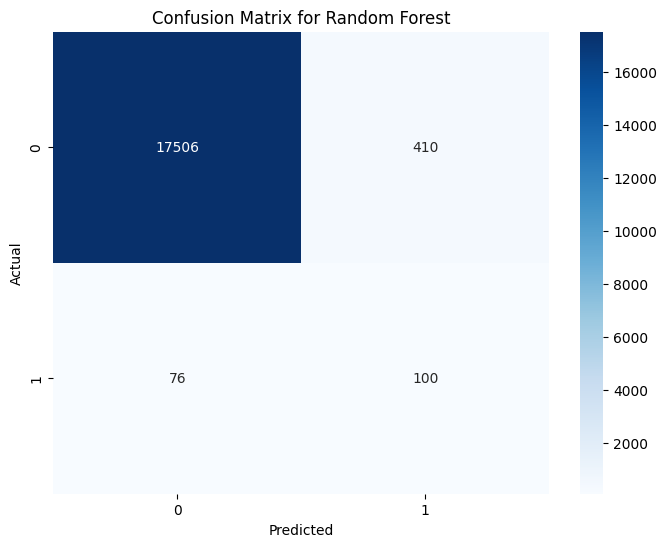

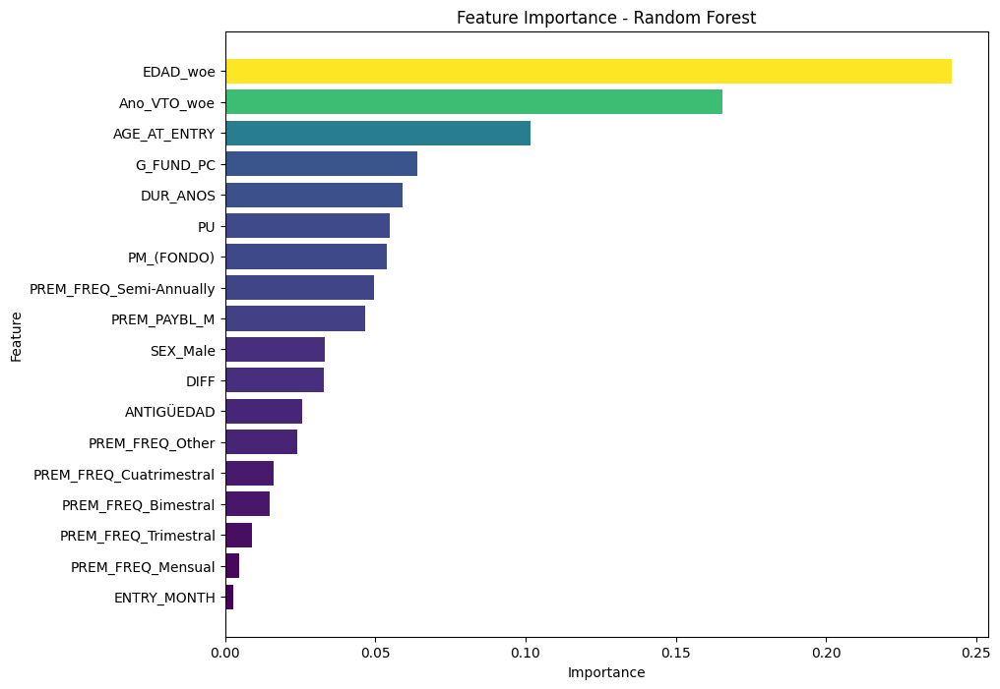

Evaluating Gradient Boosting...


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


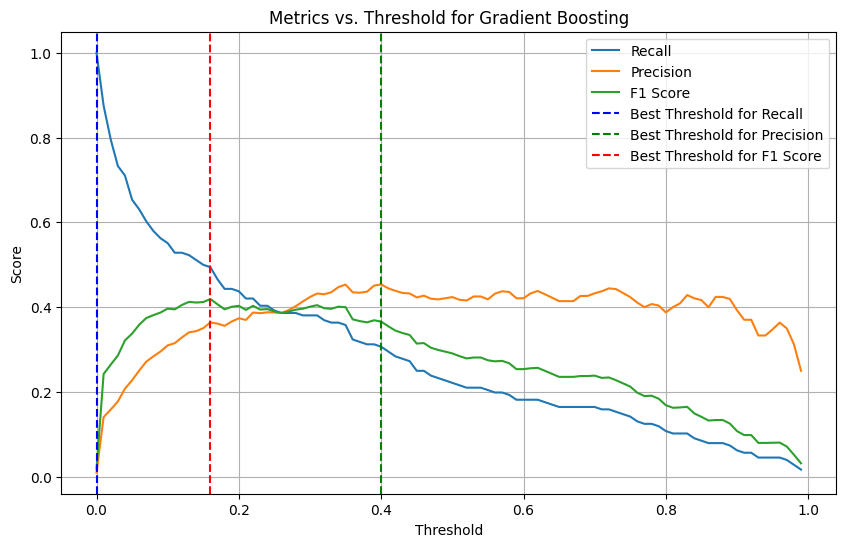

AUC for Gradient Boosting: 0.9699110368588768


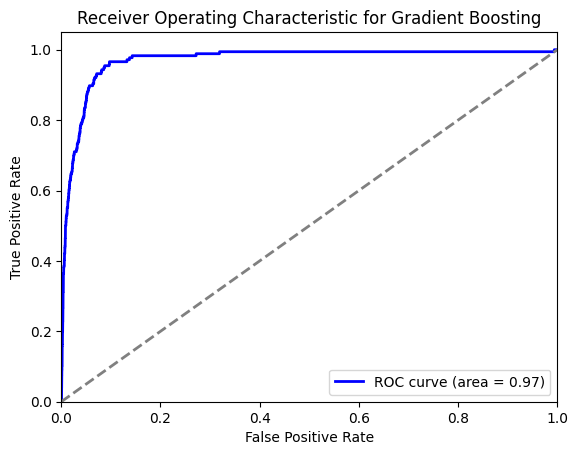

Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.36      0.49      0.42       176

    accuracy                           0.99     18092
   macro avg       0.68      0.74      0.71     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting:
[[17764   152]
 [   89    87]]
Best Parameters for Gradient Boosting: {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200}
Best Threshold for Recall for Gradient Boosting: 0.0
Best Threshold for Precision for Gradient Boosting: 0.4
Best Threshold for F1 Score for Gradient Boosting: 0.16




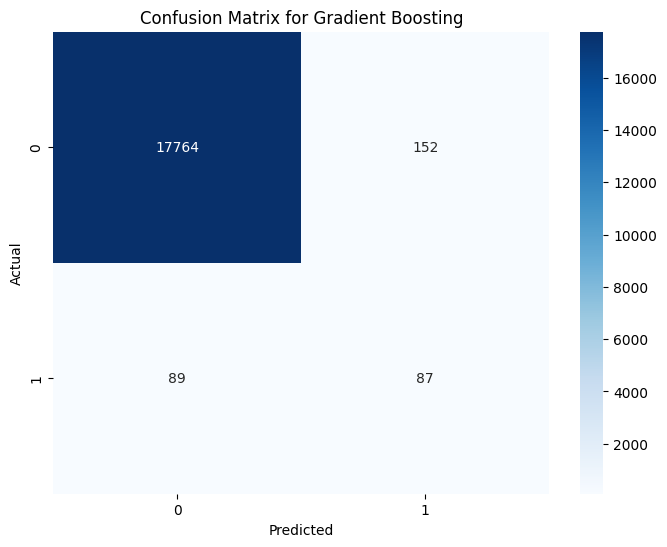

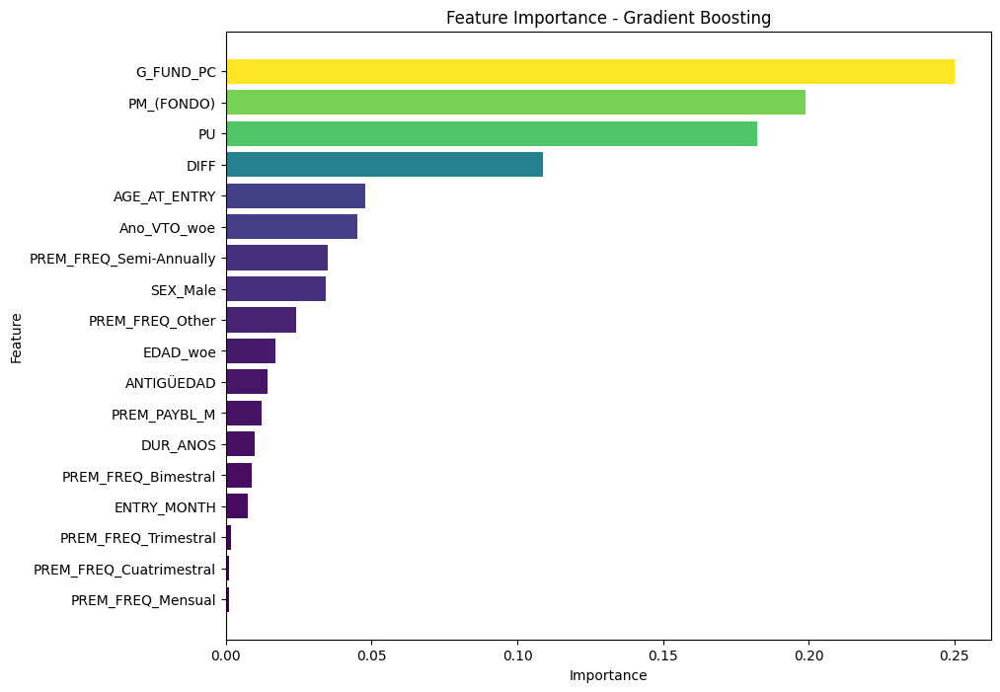

: 

In [57]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
# Define models and their parameter grids
models = [
    ('Logistic Regression', LogisticRegression(solver='liblinear', class_weight='balanced'), 
     {'classifier__C': [0.01, 0.1, 1, 10, 100], 'classifier__penalty': ['l1', 'l2']}),
    
    ('Random Forest', RandomForestClassifier(class_weight='balanced'), 
     {'classifier__n_estimators': [50, 100, 200], 'classifier__max_depth': [None, 10, 20, 30]}),
    
    ('Gradient Boosting', GradientBoostingClassifier(), 
     {'classifier__n_estimators': [50, 100, 200], 'classifier__learning_rate': [0.01, 0.1, 0.2], 
      'classifier__max_depth': [3, 4, 5]})
]

# Define custom scorers
scorers = {
    'recall_score': make_scorer(recall_score),
    'f1_score': make_scorer(f1_score)
}

# Loop through models and evaluate
for name, model, param_grid in models:
    print(f"Evaluating {name}...")
    
    # Create a pipeline with preprocessing and the model
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)])
    
    # Perform GridSearchCV
    grid_search = GridSearchCV(pipeline, param_grid, scoring=scorers, refit='f1_score', cv=5, n_jobs=-1)
    grid_search.fit(X_train, y_train)
    
    # Best model after GridSearchCV
    best_model = grid_search.best_estimator_
    
    # Predict probabilities
    y_pred_prob = best_model.predict_proba(X_test)[:, 1]
    
    # Evaluate metrics over a range of thresholds
    thresholds = np.arange(0.0, 1.0, 0.01)
    recall_scores = [recall_score(y_test, y_pred_prob >= t) for t in thresholds]
    precision_scores = [precision_score(y_test, y_pred_prob >= t) for t in thresholds]
    f1_scores = [f1_score(y_test, y_pred_prob >= t) for t in thresholds]
    
    # Find the best threshold for each metric
    best_threshold_recall = thresholds[np.argmax(recall_scores)]
    best_threshold_precision = thresholds[np.argmax(precision_scores)]
    best_threshold_f1 = thresholds[np.argmax(f1_scores)]
    
    # Plot the metrics
    plt.figure(figsize=(10, 6))
    plt.plot(thresholds, recall_scores, label='Recall')
    plt.plot(thresholds, precision_scores, label='Precision')
    plt.plot(thresholds, f1_scores, label='F1 Score')
    plt.axvline(best_threshold_recall, color='blue', linestyle='--', label='Best Threshold for Recall')
    plt.axvline(best_threshold_precision, color='green', linestyle='--', label='Best Threshold for Precision')
    plt.axvline(best_threshold_f1, color='red', linestyle='--', label='Best Threshold for F1 Score')
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title(f'Metrics vs. Threshold for {name}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Predict using the best threshold for F1 score
    y_pred_optimized = (y_pred_prob >= best_threshold_f1).astype(int)
    
    # Calculate AUC
    auc = roc_auc_score(y_test, y_pred_prob)
    print(f'AUC for {name}:', auc)
    # Plot ROC Curve
    fpr, tpr, _ = roc_curve(y_test, y_pred_prob)
    plt.figure()
    plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic for {name}')
    plt.legend(loc="lower right")
    plt.show()
    
    # Print classification report
    print(f'Classification Report for {name}:')
    print(classification_report(y_test, y_pred_optimized))
    
    # Compute confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred_optimized)
    print(f'Confusion Matrix for {name}:')
    print(conf_matrix)
    
    # Print best parameters and best thresholds
    print(f'Best Parameters for {name}:', grid_search.best_params_)
    print(f'Best Threshold for Recall for {name}:', best_threshold_recall)
    print(f'Best Threshold for Precision for {name}:', best_threshold_precision)
    print(f'Best Threshold for F1 Score for {name}:', best_threshold_f1)
    print("\n" + "="*80 + "\n")
    
    # Plot Confusion Matrix
    conf_matrix_df = pd.DataFrame(conf_matrix, index=[0, 1], columns=[0, 1])
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix for {name}')
    plt.show()

    # Plot Feature Importance for Tree-based models
    if name in ['Random Forest', 'Gradient Boosting']:
        feature_importances = best_model.named_steps['classifier'].feature_importances_
        feature_names = numeric_features + list(best_model.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))
        feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
        feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
        
        plt.figure(figsize=(10, 8))
        plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color=plt.cm.viridis(feature_importance_df['Importance'] / max(feature_importance_df['Importance'])))
        plt.xlabel('Importance')
        plt.ylabel('Feature')
        plt.title(f'Feature Importance - {name}')
        plt.gca().invert_yaxis()
        plt.show()
    if name == 'Logistic Regression':
        coefficients = best_model.named_steps['classifier'].coef_[0]
        feature_names = numeric_features + list(best_model.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))
        importance_df = pd.DataFrame({
            'Feature': feature_names,
            'Importance': coefficients
        })
        importance_df['Abs_Importance'] = np.abs(importance_df['Importance'])
        importance_df = importance_df.sort_values(by='Abs_Importance', ascending=False)
        
        plt.figure(figsize=(10, 8))
        plt.barh(importance_df['Feature'], importance_df['Importance'], color=plt.cm.viridis(importance_df['Abs_Importance'] / max(importance_df['Abs_Importance'])))
        plt.xlabel('Coefficient Value')
        plt.ylabel('Feature')
        plt.title('Feature Importance - Logistic Regression')
        plt.gca().invert_yaxis()
        plt.show()
    #30 mins de ejecucion 

In [41]:
import joblib

## Optimizacion de parametros

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarni

Mejores hiperparámetros para Random Forest:  {'classifier__max_depth': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 10, 'classifier__n_estimators': 100}
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.38      0.45      0.41       176

    accuracy                           0.99     18092
   macro avg       0.69      0.72      0.70     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Random Forest:
[[17788   128]
 [   97    79]]


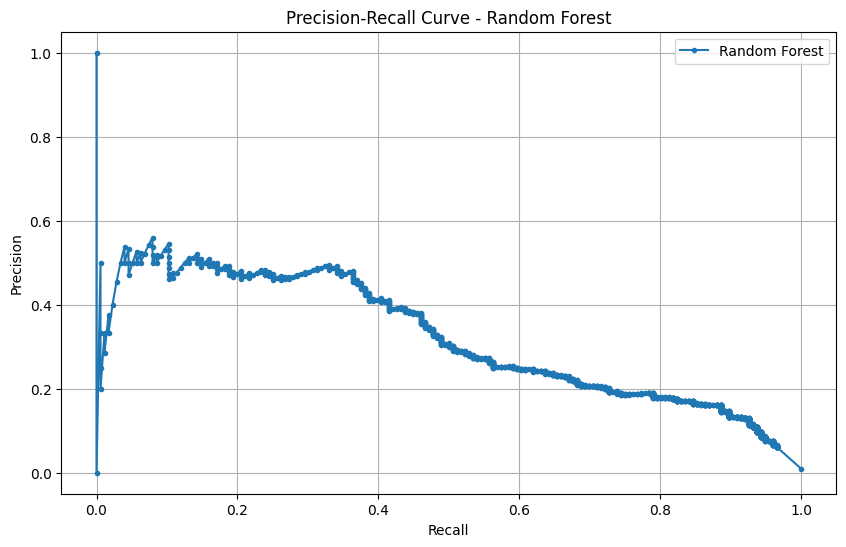

Best threshold for Random Forest: 0.5454545454545455
Best F1 score for Random Forest: 0.412532637075718



In [42]:
rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')

# Crea el pipeline con preprocesamiento y modelo Random Forest
pipeline_rf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', rf_model)])

# Define la cuadrícula de hiperparámetros para GridSearchCV
param_grid_rf = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4, 10]
}

# Custom scorer to optimize F1 score
f1_scorer = make_scorer(f1_score, greater_is_better=True)

# Inicializa GridSearchCV con las combinaciones de hiperparámetros
grid_search_rf = GridSearchCV(pipeline_rf, param_grid_rf, scoring=f1_scorer, cv=5)
grid_search_rf.fit(X_train, y_train)

# Obtén el mejor modelo
best_model_rf = grid_search_rf.best_estimator_
print("Mejores hiperparámetros para Random Forest: ", grid_search_rf.best_params_)

# Predice probabilidades y clases
y_pred_proba_rf = best_model_rf.predict_proba(X_test)[:, 1]

# Encuentra el mejor umbral para F1 score
thresholds = np.linspace(0, 1, 100)
f1_scores = [f1_score(y_test, y_pred_proba_rf > t) for t in thresholds]
best_threshold_rf = thresholds[np.argmax(f1_scores)]

# Usa el mejor umbral para hacer predicciones finales
y_pred_best_threshold_rf = (y_pred_proba_rf > best_threshold_rf).astype(int)

# Reporte de clasificación y matriz de confusión
print("Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_best_threshold_rf))
print("Confusion Matrix for Random Forest:")
print(confusion_matrix(y_test, y_pred_best_threshold_rf))

# Curva precision-recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Random Forest')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend()
plt.grid(True)
plt.show()

# Output the best threshold and F1 score
print(f"Best threshold for Random Forest: {best_threshold_rf}")
print(f"Best F1 score for Random Forest: {max(f1_scores)}\n")

# mirar resultado para añadirlo al tfm 

In [46]:
# auc
auc = roc_auc_score(y_test, y_pred_proba_rf)
print(f'AUC for random foresy:', auc)

AUC for random foresy: 0.9622791461162191


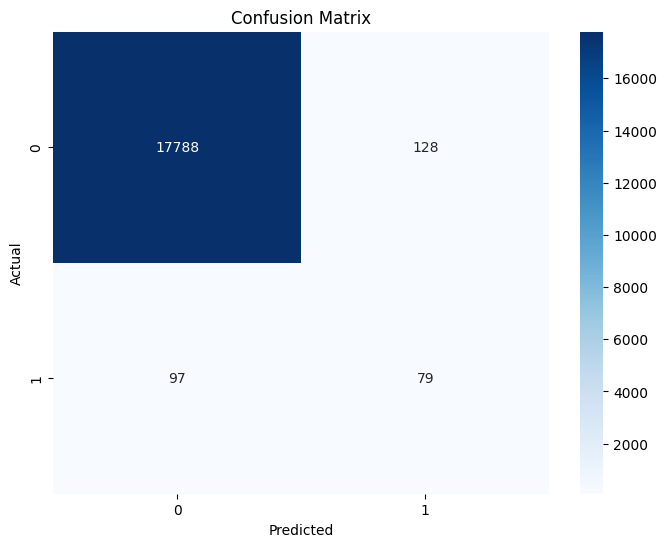

In [44]:
conf_matrix = confusion_matrix(y_test, y_pred_best_threshold_rf)
conf_matrix_df = pd.DataFrame(conf_matrix, index=best_model.classes_, columns=best_model.classes_)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

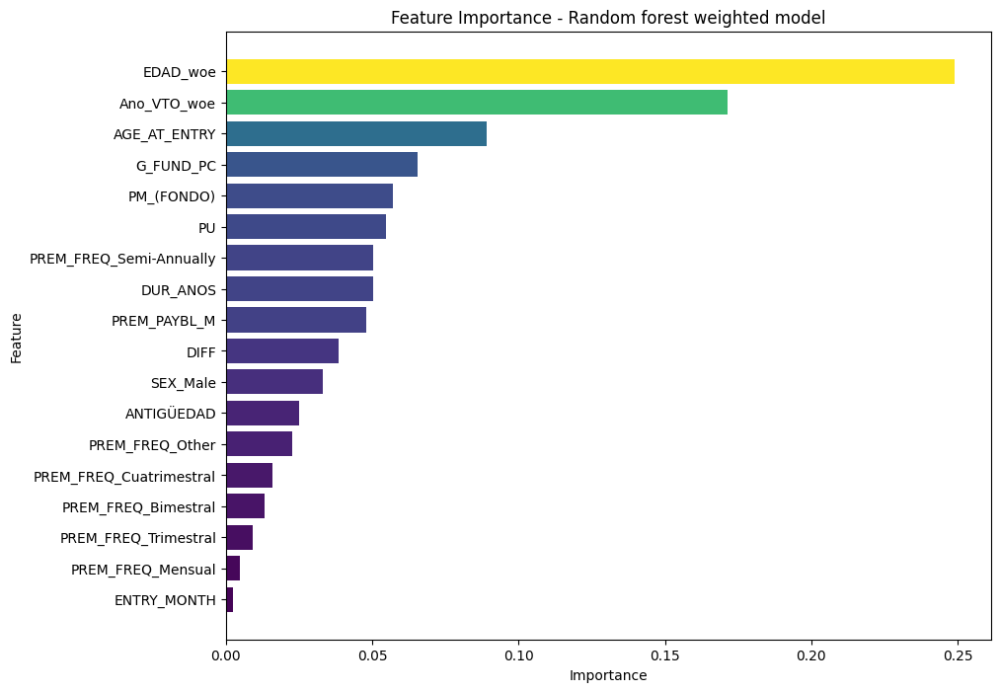

In [45]:
import matplotlib.cm as cm
feature_importances = best_model_rf.named_steps['classifier'].feature_importances_
feature_names = numeric_features + list(best_model.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
#lot feature_importance with color 
    
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color= cm.viridis(feature_importance_df['Importance'] / max(feature_importance_df['Importance'])))
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title(f'Feature Importance - Random forest weighted model')
plt.gca().invert_yaxis()
plt.show()

In [34]:
import joblib

In [35]:
# Guarda el mejor modelo
joblib.dump(best_model_rf.named_steps['classifier'], 'best_random_forest_model.joblib')
# Guarda el pipeline de preprocesamiento
joblib.dump(best_model_rf.named_steps['preprocessor'], 'preprocessing_pipeline_rf.joblib')



['preprocessing_pipeline_rf.joblib']

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: D

Mejores hiperparámetros para Gradient Boosting:  {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200}
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.40      0.45      0.42       176

    accuracy                           0.99     18092
   macro avg       0.70      0.72      0.71     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting:
[[17795   121]
 [   96    80]]


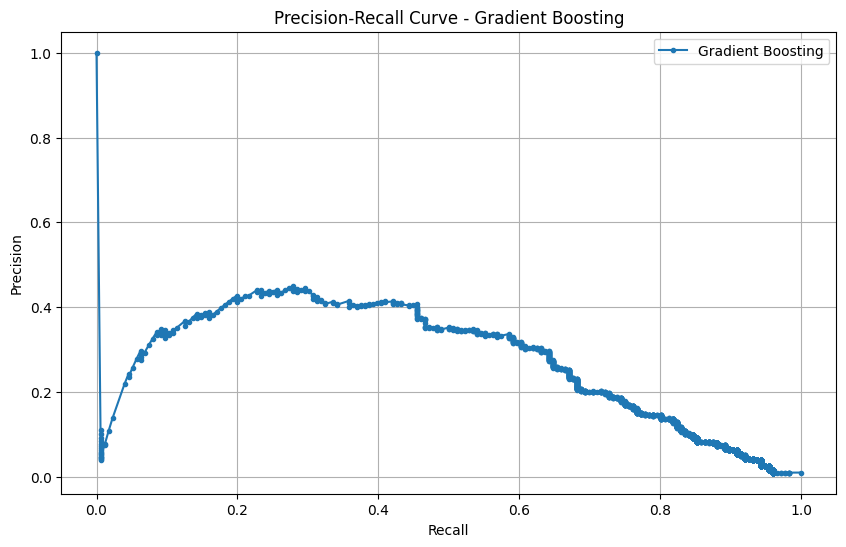

Best threshold for Gradient Boosting: 0.26262626262626265
Best F1 score for Gradient Boosting: 0.4244031830238727



In [51]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
# Definir el modelo Gradient Boosting
gb_model = GradientBoostingClassifier(random_state=42)

# Crea el pipeline con preprocesamiento y modelo Gradient Boosting
pipeline_gb = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', gb_model)])

# Define la cuadrícula de hiperparámetros para GridSearchCV
param_grid_gb = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 4, 5]
}

# Inicializa GridSearchCV con las combinaciones de hiperparámetros
grid_search_gb = GridSearchCV(pipeline_gb, param_grid_gb, scoring=f1_scorer, cv=5)
grid_search_gb.fit(X_train, y_train)

# Obtén el mejor modelo
best_model_gb = grid_search_gb.best_estimator_
print("Mejores hiperparámetros para Gradient Boosting: ", grid_search_gb.best_params_)

# Predice probabilidades y clases
y_pred_proba_gb = best_model_gb.predict_proba(X_test)[:, 1]

# Encuentra el mejor umbral para F1 score
thresholds = np.linspace(0, 1, 100)
f1_scores = [f1_score(y_test, y_pred_proba_gb > t) for t in thresholds]
best_threshold_gb = thresholds[np.argmax(f1_scores)]

# Usa el mejor umbral para hacer predicciones finales
y_pred_best_threshold_gb = (y_pred_proba_gb > best_threshold_gb).astype(int)

# Reporte de clasificación y matriz de confusión
print("Classification Report for Gradient Boosting:")
print(classification_report(y_test, y_pred_best_threshold_gb))
print("Confusion Matrix for Gradient Boosting:")
print(confusion_matrix(y_test, y_pred_best_threshold_gb))

# Curva precision-recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_gb)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Gradient Boosting')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Gradient Boosting')
plt.legend()
plt.grid(True)
plt.show()

# Guarda el mejor modelo
joblib.dump(best_model_gb.named_steps['classifier'], 'best_gradient_boosting_model.joblib')
# Guarda el pipeline de preprocesamiento
joblib.dump(best_model_gb.named_steps['preprocessor'], 'preprocessing_pipeline_gb.joblib')

# Output the best threshold and F1 score
print(f"Best threshold for Gradient Boosting: {best_threshold_gb}")
print(f"Best F1 score for Gradient Boosting: {max(f1_scores)}\n")


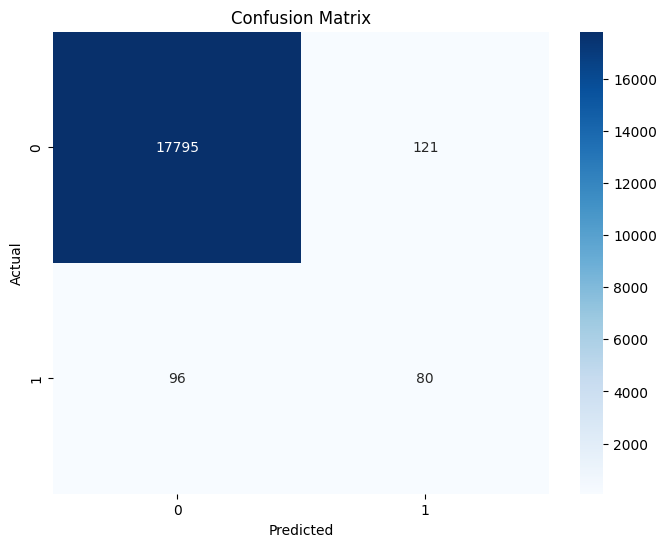

In [52]:
conf_matrix = confusion_matrix(y_test, y_pred_best_threshold_gb)
conf_matrix_df = pd.DataFrame(conf_matrix, index=best_model.classes_, columns=best_model.classes_)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Modelos de clasificacion binaria

### regresión logistica
- Balanceo de clases 
- Optimizacion del F1 
- Busqueda del threshold optimo

### Random forest 
- busqueda de hipermarametros 
- balanceo de clases
- optimizacion del F1

### Gradient boosting
- balanceo de clase 
- optimizacion del threshold 
- optimizacion del F1

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: D

Gradient Boosting - Cross-Validation F1 Score: 0.9529988133802852
Gradient Boosting - Cross-Validation Precision: 0.9440586140220653
Gradient Boosting - Cross-Validation Recall: 0.9621153980325123


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Gradient Boosting Test Set Evaluation:
Accuracy: 0.9373203625912006
ROC-AUC: 0.9529366208975218
              precision    recall  f1-score   support

           0       1.00      0.94      0.97     17916
           1       0.11      0.76      0.19       176

    accuracy                           0.94     18092
   macro avg       0.55      0.85      0.58     18092
weighted avg       0.99      0.94      0.96     18092



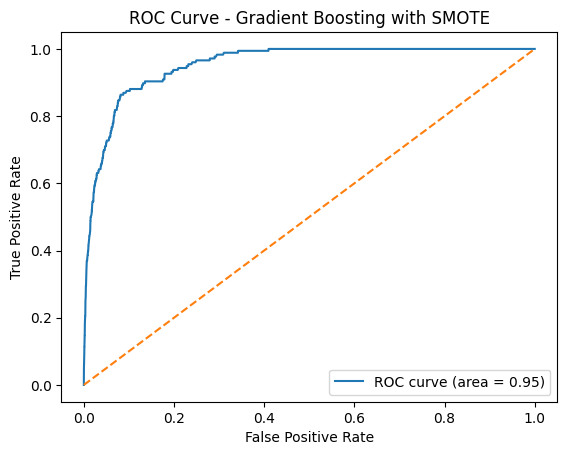

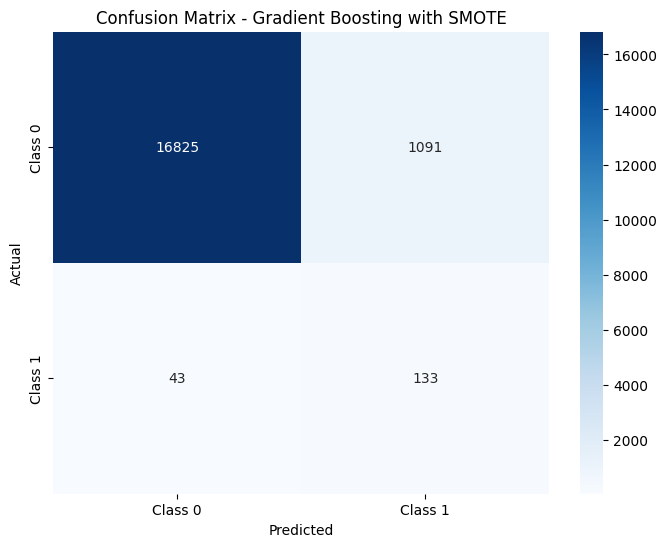

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

# Initialize Gradient Boosting model
gbc_model = GradientBoostingClassifier(random_state=42)

# Perform cross-validation
f1_scores_gbc = cross_val_score(gbc_model, X_res, y_res, cv=kf, scoring='f1')
precision_scores_gbc = cross_val_score(gbc_model, X_res, y_res, cv=kf, scoring='precision')
recall_scores_gbc = cross_val_score(gbc_model, X_res, y_res, cv=kf, scoring='recall')

print('Gradient Boosting - Cross-Validation F1 Score:', f1_scores_gbc.mean())
print('Gradient Boosting - Cross-Validation Precision:', precision_scores_gbc.mean())
print('Gradient Boosting - Cross-Validation Recall:', recall_scores_gbc.mean())

# Fit the model on the entire resampled training set
gbc_model.fit(X_res, y_res)

# Make predictions on the test set
y_pred_gbc = gbc_model.predict(X_test_selected)
y_pred_proba_gbc = gbc_model.predict_proba(X_test_selected)[:, 1]

# Evaluate the model on the test set
print('Gradient Boosting Test Set Evaluation:')
print(f'Accuracy: {accuracy_score(y_test, y_pred_gbc)}')
print(f'ROC-AUC: {roc_auc_score(y_test, y_pred_proba_gbc)}')
print(classification_report(y_test, y_pred_gbc))

# Plot ROC curve
fpr_gbc, tpr_gbc, _ = roc_curve(y_test, y_pred_proba_gbc)
plt.figure()
plt.plot(fpr_gbc, tpr_gbc, label='ROC curve (area = %0.2f)' % roc_auc_score(y_test, y_pred_proba_gbc))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve - Gradient Boosting with SMOTE')
plt.legend(loc="lower right")
plt.show()

# Plot confusion matrix
conf_matrix_gbc = confusion_matrix(y_test, y_pred_gbc)
conf_matrix_df_gbc = pd.DataFrame(conf_matrix_gbc, index=['Class 0', 'Class 1'], columns=['Class 0', 'Class 1'])
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df_gbc, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix - Gradient Boosting with SMOTE')
plt.show()


# Modelo Random forest y Gradient boosting con funcion para evaluar modelos 

In [20]:
from imblearn.ensemble import BalancedRandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
import joblib 

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\imblearn\ensemble\_forest.py:577: FutureWarning: The default of `sampling_strategy` will change from `'auto'` to `'all'` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `'all'` to silence this warning and adopt the future behaviour.
  warn(
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\imblearn\ensemble\_forest.py:589: FutureWarning: The default of `replacement` will change from `False` to `True` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `True` to silence this warning and adopt the future behaviour.
  warn(
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\imblearn\ensemble\_forest.py:601: FutureWarning: The default of `bootstrap` will change from `True` to `False` in version 0.13. This change will follow the implementation proposed in the original paper. Set to `F

Mejores hiperparámetros para Balanced Random Forest:  {'classifier__max_depth': None, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 100}
AUC: 0.9753848134729749
Classification Report for Balanced Random Forest:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.32      0.43      0.37       176

    accuracy                           0.99     18092
   macro avg       0.66      0.71      0.68     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Balanced Random Forest:
[[17758   158]
 [  100    76]]


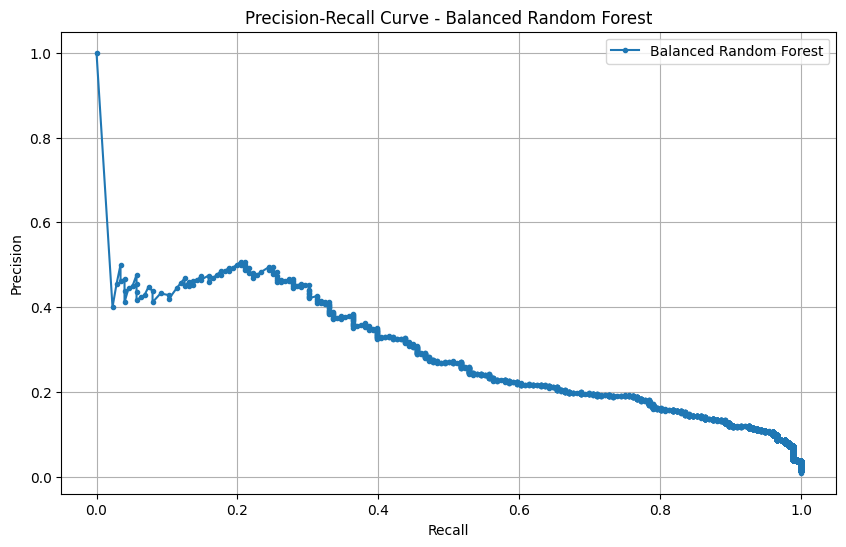

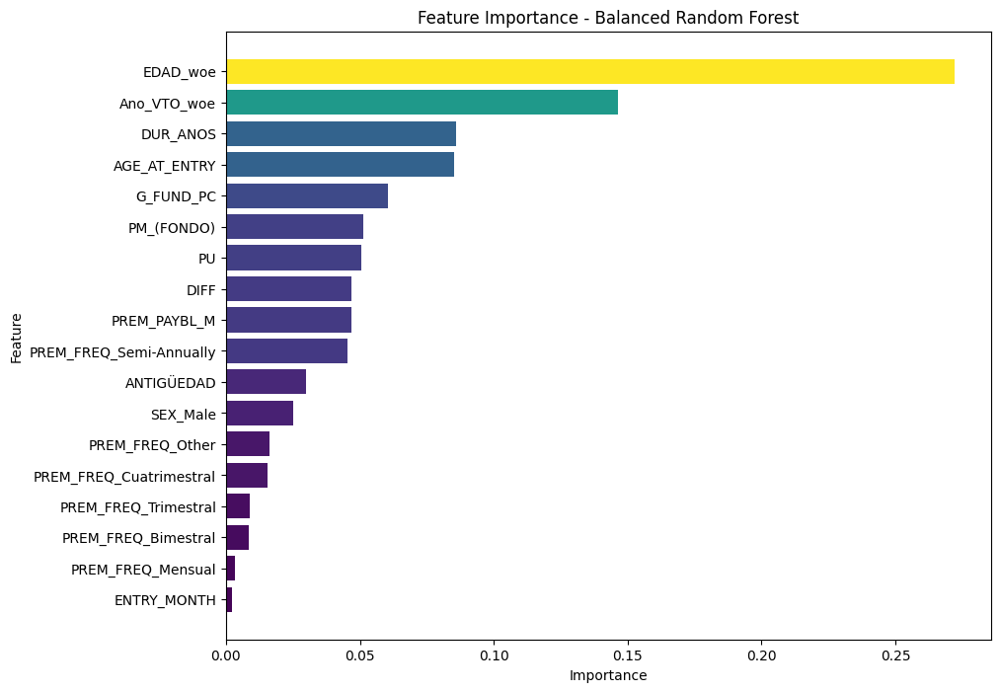

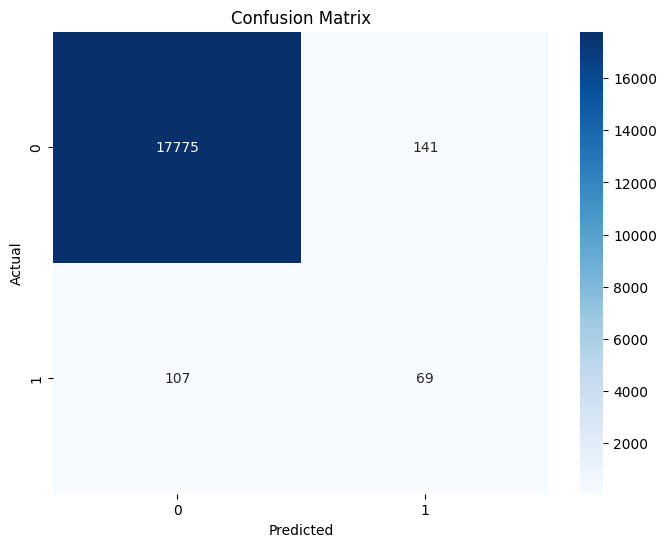

Best threshold for Balanced Random Forest: 0.9494949494949496
Best F1 score for Balanced Random Forest: 0.37073170731707317



In [21]:
f1_scorer = make_scorer(f1_score, greater_is_better=True)

# Función para ajustar el modelo, obtener la importancia de las características y evaluar el modelo
def evaluate_and_plot_importance(model, param_grid, model_name):
    # Crear el pipeline
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    # Inicializar GridSearchCV
    grid_search = GridSearchCV(pipeline, param_grid, scoring=f1_scorer, cv=5)
    grid_search.fit(X_train, y_train)
    
    # Obtener el mejor modelo
    best_model = grid_search.best_estimator_
    print(f"Mejores hiperparámetros para {model_name}: ", grid_search.best_params_)
    
    # Predecir probabilidades y clases
    y_pred_proba = best_model.predict_proba(X_test)[:, 1]
    
    # Calcular AUC
    auc = roc_auc_score(y_test, y_pred_proba)
    print(f"AUC: {auc}")

    # Encontrar el mejor umbral para F1 score
    thresholds = np.linspace(0, 1, 100)
    f1_scores = [f1_score(y_test, y_pred_proba > t) for t in thresholds]
    best_threshold = thresholds[np.argmax(f1_scores)]
    
    # Usar el mejor umbral para hacer predicciones finales
    y_pred_best_threshold = (y_pred_proba > best_threshold).astype(int)
    
    # Reporte de clasificación y matriz de confusión
    print(f"Classification Report for {model_name}:")
    print(classification_report(y_test, y_pred_best_threshold))
    print(f"Confusion Matrix for {model_name}:")
    print(confusion_matrix(y_test, y_pred_best_threshold))
    
    # Curva precision-recall
    precision, recall, _ = precision_recall_curve(y_test, y_pred_proba)
    plt.figure(figsize=(10, 6))
    plt.plot(recall, precision, marker='.', label=model_name)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve - {model_name}')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Obtener la importancia de las características
    feature_importances = best_model.named_steps['classifier'].feature_importances_
    feature_names = numeric_features + list(best_model.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))
    feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
    
    # Generar colores para las barras
    colors = cm.viridis(feature_importance_df['Importance'] / max(feature_importance_df['Importance']))
    
    # Plotear la importancia de las características
    plt.figure(figsize=(10, 8))
    plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color=colors)
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.title(f'Feature Importance - {model_name}')
    plt.gca().invert_yaxis()
    plt.show()
    #matriz de confusion
    conf_matrix_df = pd.DataFrame(conf_matrix, index=[0, 1], columns=[0, 1])
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()
    # Guardar el mejor modelo
    joblib.dump(best_model.named_steps['classifier'], f'best_{model_name.lower().replace(" ", "_")}_model.joblib')
    # Guardar el pipeline de preprocesamiento
    joblib.dump(best_model.named_steps['preprocessor'], f'preprocessing_pipeline_{model_name.lower().replace(" ", "_")}.joblib')
    
    print(f"Best threshold for {model_name}: {best_threshold}")
    print(f"Best F1 score for {model_name}: {max(f1_scores)}\n")

# Definir el modelo Random Forest y su grid de hiperparámetros
# rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')
# param_grid_rf = {
#     'classifier__n_estimators': [50, 100, 200],
#     'classifier__max_depth': [None, 10, 20, 30],
#     'classifier__min_samples_split': [2, 5, 10],
#     'classifier__min_samples_leaf': [1, 2, 4]
# }

# # Evaluar y plotear la importancia de las características para Random Forest
# evaluate_and_plot_importance(rf_model, param_grid_rf, "Random Forest")

# Definir el modelo Gradient Boosting y su grid de hiperparámetros
# gb_model = GradientBoostingClassifier(random_state=42)
# param_grid_gb = {
#     'classifier__n_estimators': [50, 100, 200],
#     'classifier__learning_rate': [0.01, 0.1, 0.2],
#     'classifier__max_depth': [3, 4, 5]
# }

# # Evaluar y plotear la importancia de las características para Gradient Boosting
# evaluate_and_plot_importance(gb_model, param_grid_gb, "Gradient Boosting")
gb_model = GradientBoostingClassifier(random_state=42)
param_grid_gb = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 4, 5],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__subsample': [0.8, 0.9, 1.0]
}
evaluate_and_plot_importance(gb_model, param_grid_gb, "Gradient Boosting")
brf_model = BalancedRandomForestClassifier(random_state=42)
param_grid_brf = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4],
    'classifier__max_features': ['auto', 'sqrt', 'log2']
}
# Evaluar y plotear la importancia de las características para Gradient Boosting
evaluate_and_plot_importance(brf_model, param_grid_brf, "Balanced Random Forest")




C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: D

Mejores hiperparámetros para Gradient Boosting:  {'classifier__learning_rate': 0.1, 'classifier__max_depth': 5, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 5, 'classifier__n_estimators': 200, 'classifier__subsample': 0.8}
AUC: 0.9761564066654488
Classification Report for Gradient Boosting:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     17916
           1       0.40      0.45      0.42       176

    accuracy                           0.99     18092
   macro avg       0.70      0.72      0.71     18092
weighted avg       0.99      0.99      0.99     18092

Confusion Matrix for Gradient Boosting:
[[17798   118]
 [   97    79]]


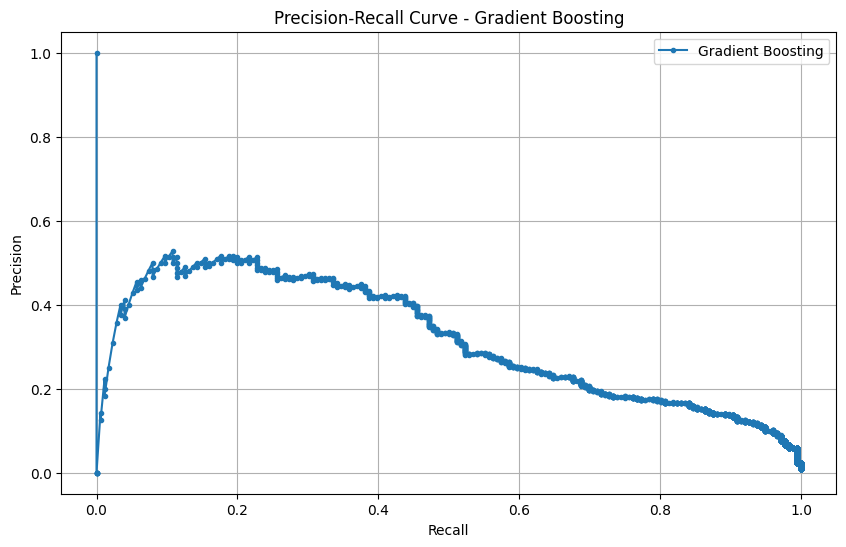

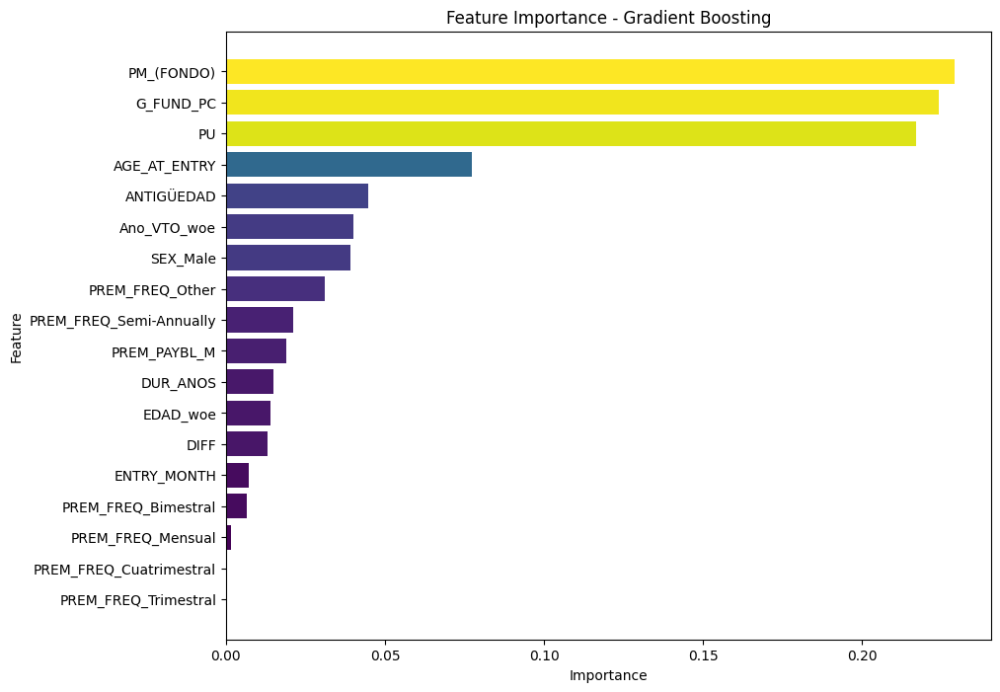

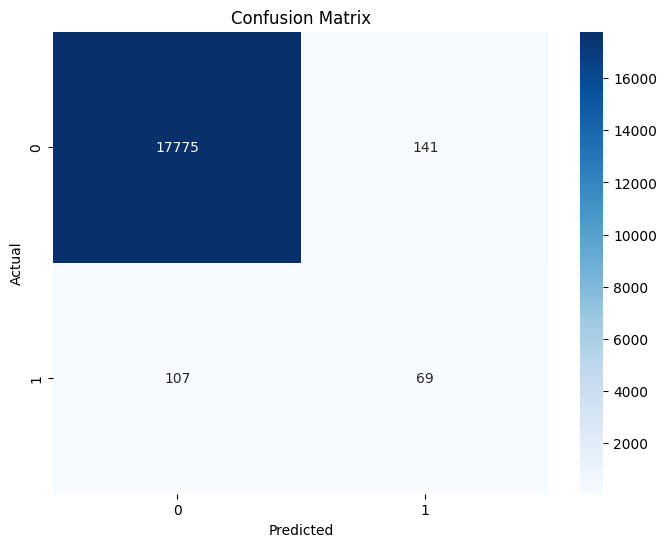

Best threshold for Gradient Boosting: 0.22222222222222224
Best F1 score for Gradient Boosting: 0.42359249329758714



In [22]:
evaluate_and_plot_importance(gb_model, param_grid_gb, "Gradient Boosting")

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


Mejores hiperparámetros para Random Forest:  {'classifier__max_depth': None, 'classifier__min_samples_leaf': 10, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 100}
Classification Report for Random Forest (F2 Score Threshold):
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     17916
           1       0.23      0.69      0.34       176

    accuracy                           0.97     18092
   macro avg       0.61      0.83      0.66     18092
weighted avg       0.99      0.97      0.98     18092

Confusion Matrix for Random Forest (F2 Score Threshold):
[[17498   418]
 [   54   122]]


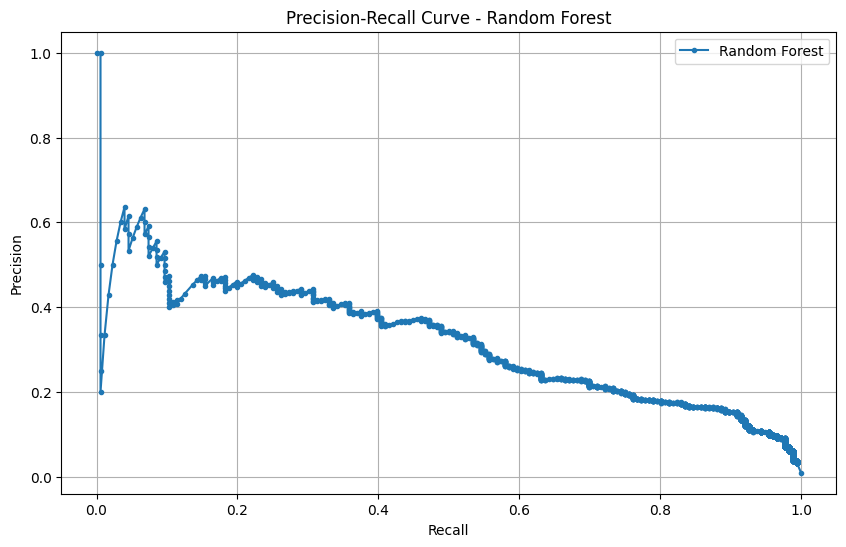

AUC for Random Forest: 0.9751564751669406


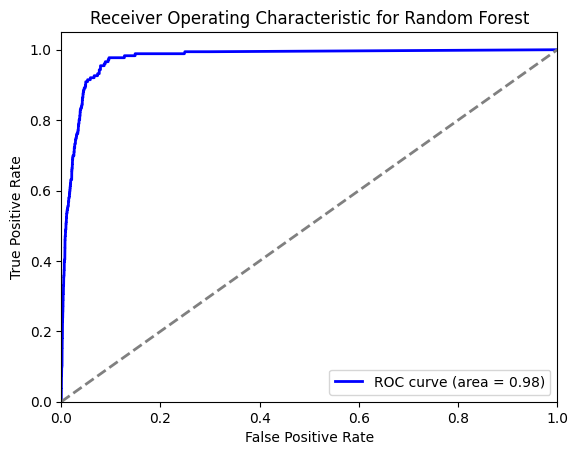

Best threshold for Random Forest: 0.5555555555555556
Best F2 score for Random Forest: 0.4903536977491961

AUC for random foresy: 0.9751564751669406


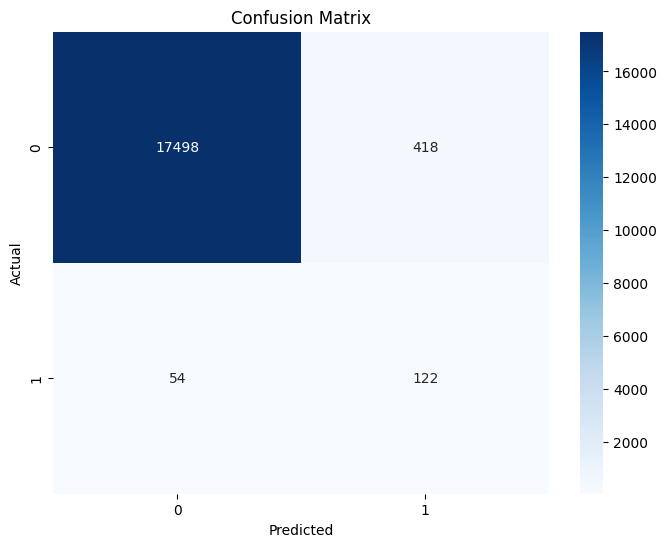

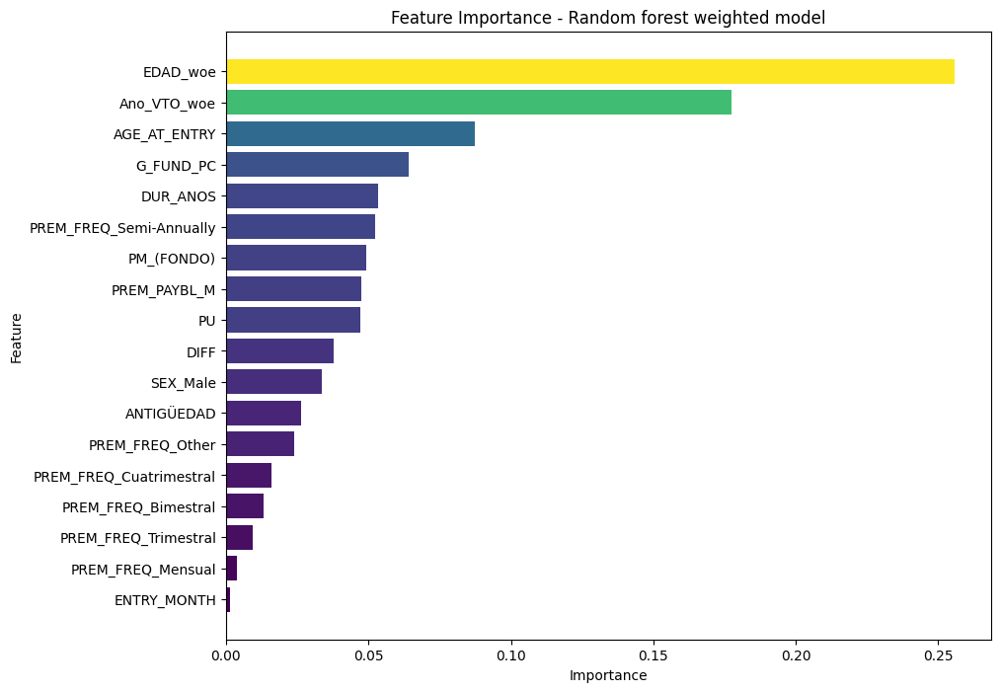

In [25]:
from sklearn.metrics import f1_score, recall_score, precision_score, make_scorer, classification_report, confusion_matrix, precision_recall_curve, roc_auc_score, roc_curve, fbeta_score
# Define el modelo Random Forest
rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')

# Crea el pipeline con preprocesamiento y modelo Random Forest
pipeline_rf = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', rf_model)])

# Define la cuadrícula de hiperparámetros para GridSearchCV
param_grid_rf = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__max_depth': [None, 10, 20, 30],
    'classifier__min_samples_split': [2, 5, 10],
    'classifier__min_samples_leaf': [1, 2, 4, 10]
}

# Custom scorer to optimize F2 score
f2_scorer = make_scorer(fbeta_score, beta=2, greater_is_better=True)

# Inicializa GridSearchCV con las combinaciones de hiperparámetros
grid_search_rf = GridSearchCV(pipeline_rf, param_grid_rf, scoring=f2_scorer, cv=5, n_jobs=-1)
grid_search_rf.fit(X_train, y_train)

# Obtén el mejor modelo
best_model_rf = grid_search_rf.best_estimator_
print("Mejores hiperparámetros para Random Forest: ", grid_search_rf.best_params_)

# Predice probabilidades y clases
y_pred_proba_rf = best_model_rf.predict_proba(X_test)[:, 1]

# Encuentra el mejor umbral para F2 score
thresholds = np.linspace(0, 1, 100)
f2_scores = [fbeta_score(y_test, y_pred_proba_rf > t, beta=2) for t in thresholds]
best_threshold_rf = thresholds[np.argmax(f2_scores)]

# Usa el mejor umbral para hacer predicciones finales
y_pred_best_threshold_rf = (y_pred_proba_rf > best_threshold_rf).astype(int)

# Reporte de clasificación y matriz de confusión
print("Classification Report for Random Forest (F2 Score Threshold):")
print(classification_report(y_test, y_pred_best_threshold_rf))
print("Confusion Matrix for Random Forest (F2 Score Threshold):")
print(confusion_matrix(y_test, y_pred_best_threshold_rf))

# Curva precision-recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_rf)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Random Forest')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Random Forest')
plt.legend()
plt.grid(True)
plt.show()

# Calcular AUC
auc = roc_auc_score(y_test, y_pred_proba_rf)
print(f'AUC for Random Forest: {auc}')

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_rf)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Random Forest')
plt.legend(loc="lower right")
plt.show()

# Output the best threshold and F2 score
print(f"Best threshold for Random Forest: {best_threshold_rf}")
print(f"Best F2 score for Random Forest: {max(f2_scores)}\n")

# auc
auc = roc_auc_score(y_test, y_pred_proba_rf)
print(f'AUC for random foresy:', auc)

conf_matrix = confusion_matrix(y_test, y_pred_best_threshold_rf)
conf_matrix_df = pd.DataFrame(conf_matrix, index=best_model.classes_, columns=best_model.classes_)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

import matplotlib.cm as cm

feature_importances = best_model_rf.named_steps['classifier'].feature_importances_
feature_names = numeric_features + list(best_model.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
#lot feature_importance with color 
    
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color= cm.viridis(feature_importance_df['Importance'] / max(feature_importance_df['Importance'])))
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title(f'Feature Importance - Random forest weighted model')
plt.gca().invert_yaxis()
plt.show()

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\sklearn\preprocessing\_label.py:114: D

Mejores hiperparámetros para Gradient Boosting:  {'classifier__learning_rate': 0.2, 'classifier__max_depth': 5, 'classifier__n_estimators': 200}
Classification Report for Gradient Boosting (F2 Score Threshold):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.31      0.60      0.40       176

    accuracy                           0.98     18092
   macro avg       0.65      0.79      0.70     18092
weighted avg       0.99      0.98      0.99     18092

Confusion Matrix for Gradient Boosting (F2 Score Threshold):
[[17677   239]
 [   71   105]]


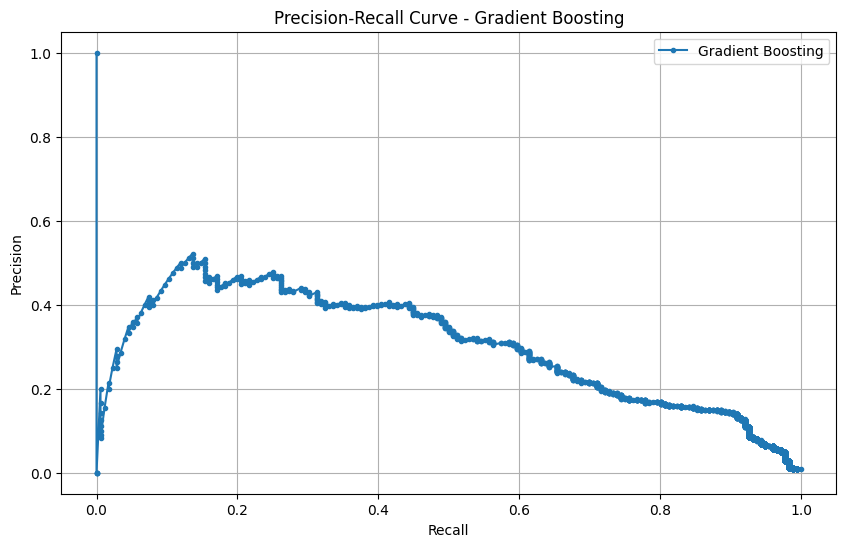

AUC for Gradient Boosting: 0.9599426426860704


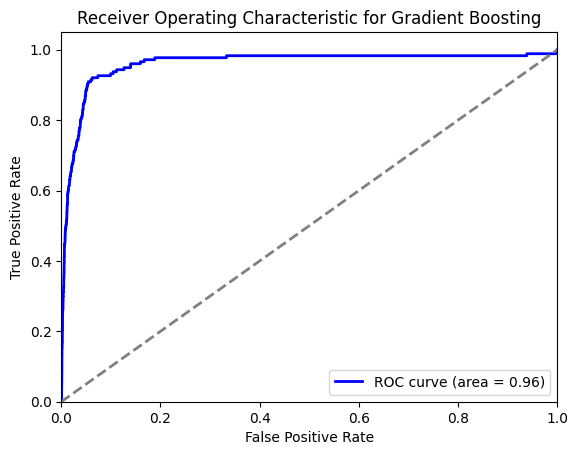

Best threshold for Gradient Boosting: 0.09090909090909091
Best F2 score for Gradient Boosting: 0.5009541984732825



In [20]:
gb_model = GradientBoostingClassifier(random_state=42)

# Crea el pipeline con preprocesamiento y modelo Gradient Boosting
pipeline_gb = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('classifier', gb_model)])

# Define la cuadrícula de hiperparámetros para GridSearchCV
param_grid_gb = {
    'classifier__n_estimators': [50, 100, 200],
    'classifier__learning_rate': [0.01, 0.1, 0.2],
    'classifier__max_depth': [3, 4, 5]
}

# Custom scorer to optimize F2 score
f2_scorer = make_scorer(fbeta_score, beta=2, greater_is_better=True)

# Inicializa GridSearchCV con las combinaciones de hiperparámetros
grid_search_gb = GridSearchCV(pipeline_gb, param_grid_gb, scoring=f2_scorer, cv=5)
grid_search_gb.fit(X_train, y_train)

# Obtén el mejor modelo
best_model_gb = grid_search_gb.best_estimator_
print("Mejores hiperparámetros para Gradient Boosting: ", grid_search_gb.best_params_)

# Predice probabilidades y clases
y_pred_proba_gb = best_model_gb.predict_proba(X_test)[:, 1]

# Encuentra el mejor umbral para F2 score
thresholds = np.linspace(0, 1, 100)
f2_scores = [fbeta_score(y_test, y_pred_proba_gb > t, beta=2) for t in thresholds]
best_threshold_gb = thresholds[np.argmax(f2_scores)]

# Usa el mejor umbral para hacer predicciones finales
y_pred_best_threshold_gb = (y_pred_proba_gb > best_threshold_gb).astype(int)

# Reporte de clasificación y matriz de confusión
print("Classification Report for Gradient Boosting (F2 Score Threshold):")
print(classification_report(y_test, y_pred_best_threshold_gb))
print("Confusion Matrix for Gradient Boosting (F2 Score Threshold):")
print(confusion_matrix(y_test, y_pred_best_threshold_gb))

# Curva precision-recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_gb)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Gradient Boosting')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve - Gradient Boosting')
plt.legend()
plt.grid(True)
plt.show()

# Calcular AUC
auc = roc_auc_score(y_test, y_pred_proba_gb)
print(f'AUC for Gradient Boosting: {auc}')

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_gb)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic for Gradient Boosting')
plt.legend(loc="lower right")
plt.show()

# Guarda el mejor modelo
joblib.dump(best_model_gb.named_steps['classifier'], 'best_gradient_boosting_model.joblib')
# Guarda el pipeline de preprocesamiento
joblib.dump(best_model_gb.named_steps['preprocessor'], 'preprocessing_pipeline_gb.joblib')

# Output the best threshold and F2 score
print(f"Best threshold for Gradient Boosting: {best_threshold_gb}")
print(f"Best F2 score for Gradient Boosting: {max(f2_scores)}\n")

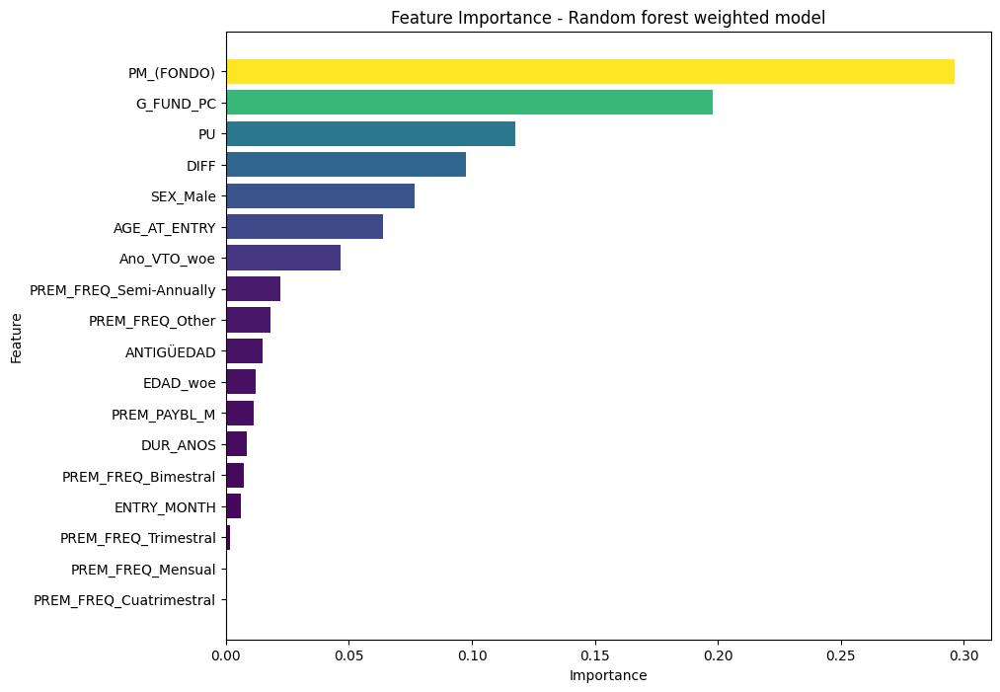

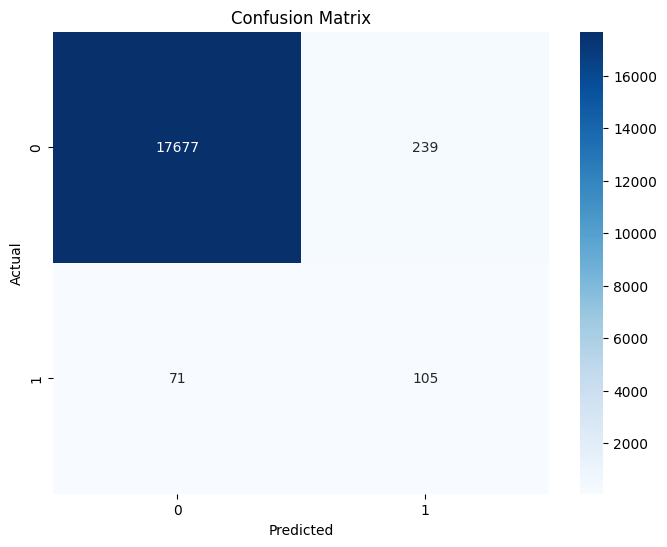

In [43]:
import matplotlib.cm as cm

feature_importances = best_model_gb.named_steps['classifier'].feature_importances_
feature_names = numeric_features + list(best_model_gb.named_steps['preprocessor'].transformers_[1][1]['onehot'].get_feature_names_out(categorical_features))
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
#lot feature_importance with color 
    
plt.figure(figsize=(10, 8))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'], color= cm.viridis(feature_importance_df['Importance'] / max(feature_importance_df['Importance'])))
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title(f'Feature Importance - Random forest weighted model')
plt.gca().invert_yaxis()
plt.show()

conf_matrix = confusion_matrix(y_test, y_pred_best_threshold_gb)
conf_matrix_df = pd.DataFrame(conf_matrix, index=best_model_gb.classes_, columns=best_model_gb.classes_)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Con el modelo obtenido hacer un clustering en funcion a las predicciones 
cambiar al modelo gradient boosting que para hacer el clustering y comparar resultados, ya que las varibales que mayor importancia tienen son las variables numericas a ver como identifica a clientes de esa manera 

In [18]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, recall_score, precision_score, make_scorer, classification_report, confusion_matrix, precision_recall_curve, roc_auc_score, roc_curve, fbeta_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import joblib
import matplotlib.cm as cm
from sklearn.manifold import TSNE

In [23]:
preprocessor_path = 'preprocessing_pipeline_gb.joblib'  # Ajusta el nombre del archivo según sea necesario
model_path = 'best_gradient_boosting_model.joblib'  # Ajusta el nombre del archivo según sea necesario

preprocessor = joblib.load(preprocessor_path)
model = joblib.load(model_path)

AUC: 0.9599426426860704


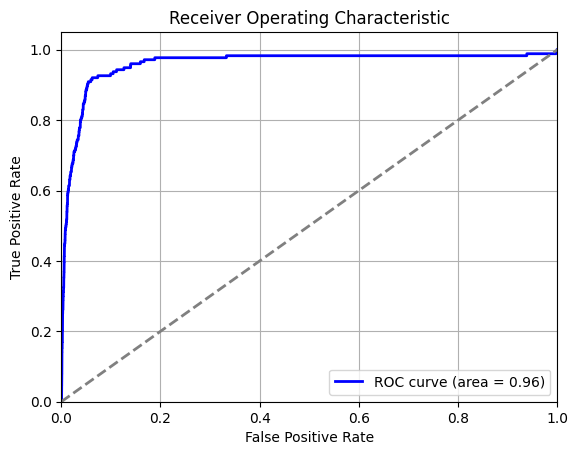

Classification Report (F2 Score Threshold):
              precision    recall  f1-score   support

           0       1.00      0.99      0.99     17916
           1       0.30      0.60      0.40       176

    accuracy                           0.98     18092
   macro avg       0.65      0.79      0.70     18092
weighted avg       0.99      0.98      0.99     18092

Confusion Matrix (F2 Score Threshold):
[[17674   242]
 [   71   105]]


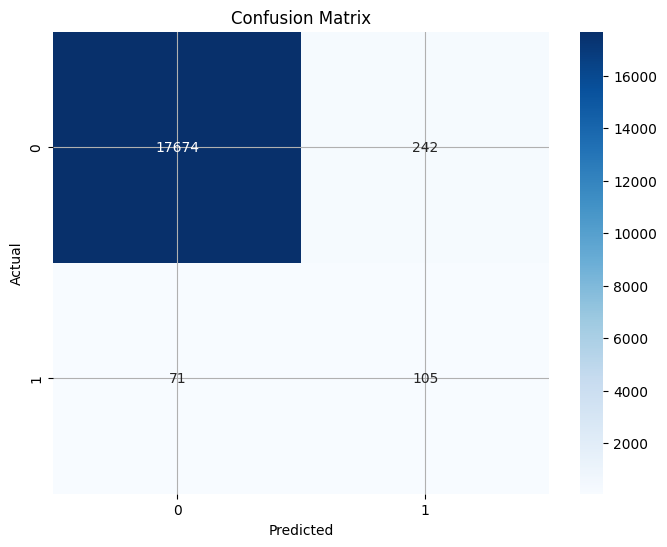

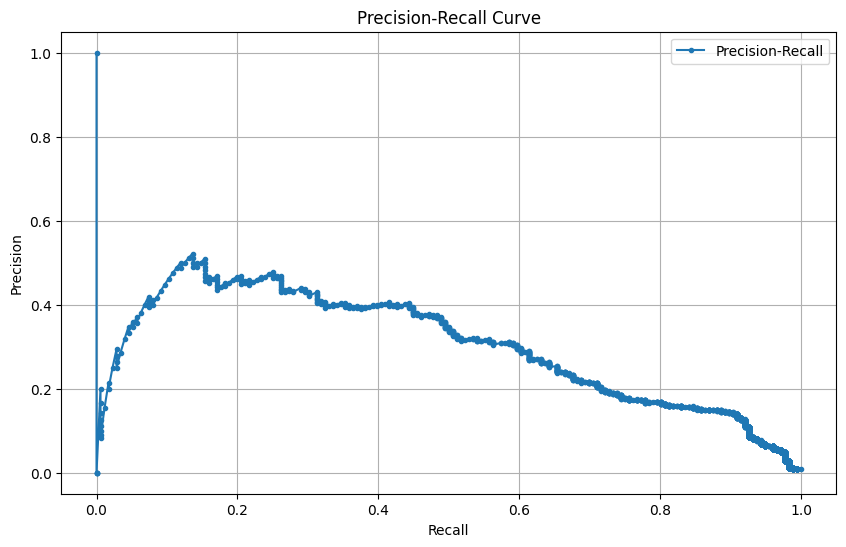

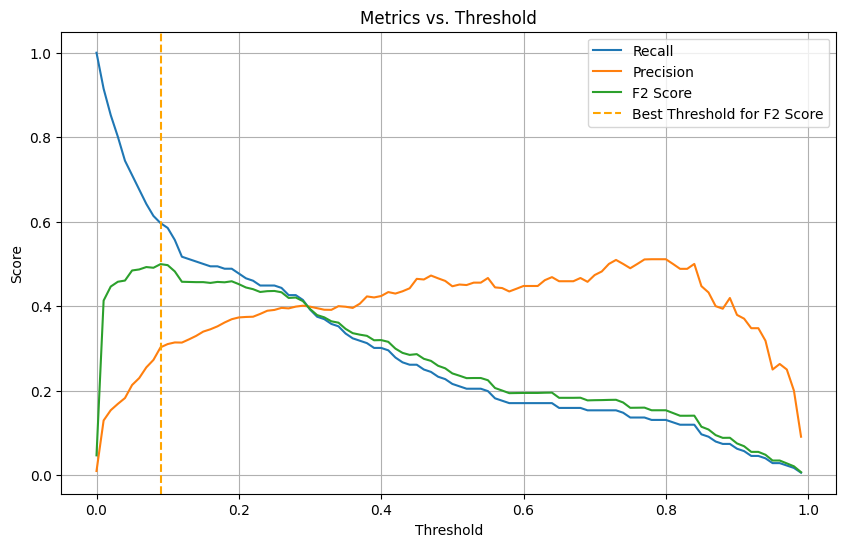

In [25]:
X_test_transformed = preprocessor.transform(X_test)
# Predice probabilidades
y_pred_proba_gb = model.predict_proba(X_test_transformed)[:, 1]

# Evaluar métricas en un rango de umbrales
thresholds = np.arange(0.0, 1.0, 0.01)
recall_scores = [recall_score(y_test, y_pred_proba_gb >= t) for t in thresholds]
precision_scores = [precision_score(y_test, y_pred_proba_gb >= t) for t in thresholds]
f2_scores = [fbeta_score(y_test, y_pred_proba_gb >= t, beta=2) for t in thresholds]

# Encontrar el mejor umbral para F2 score
best_threshold_f2 = thresholds[np.argmax(f2_scores)]

# Predecir usando el mejor umbral para F2 score
y_pred_optimized = (y_pred_proba_gb >= best_threshold_f2).astype(int)
# Calcular AUC
auc = roc_auc_score(y_test, y_pred_proba_gb)
print(f'AUC:', auc)

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_pred_proba_gb)
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

# Reporte de clasificación
print("Classification Report (F2 Score Threshold):")
print(classification_report(y_test, y_pred_optimized))

# Matriz de confusión
conf_matrix = confusion_matrix(y_test, y_pred_optimized)
print("Confusion Matrix (F2 Score Threshold):")
print(conf_matrix)

# Plot Matriz de Confusión
conf_matrix_df = pd.DataFrame(conf_matrix, index=[0, 1], columns=[0, 1])
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.grid(True)
plt.show()

# Curva precision-recall
precision, recall, _ = precision_recall_curve(y_test, y_pred_proba_gb)
plt.figure(figsize=(10, 6))
plt.plot(recall, precision, marker='.', label='Precision-Recall')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()

# Plot de las métricas F2 en función del umbral
plt.figure(figsize=(10, 6))
plt.plot(thresholds, recall_scores, label='Recall')
plt.plot(thresholds, precision_scores, label='Precision')
plt.plot(thresholds, f2_scores, label='F2 Score')
plt.axvline(best_threshold_f2, color='orange', linestyle='--', label='Best Threshold for F2 Score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Metrics vs. Threshold')
plt.legend()
plt.grid(True)
plt.show()


In [32]:
y_pred_proba_rf

array([0.        , 0.87448422, 0.01843492, ..., 0.        , 0.        ,
       0.        ])

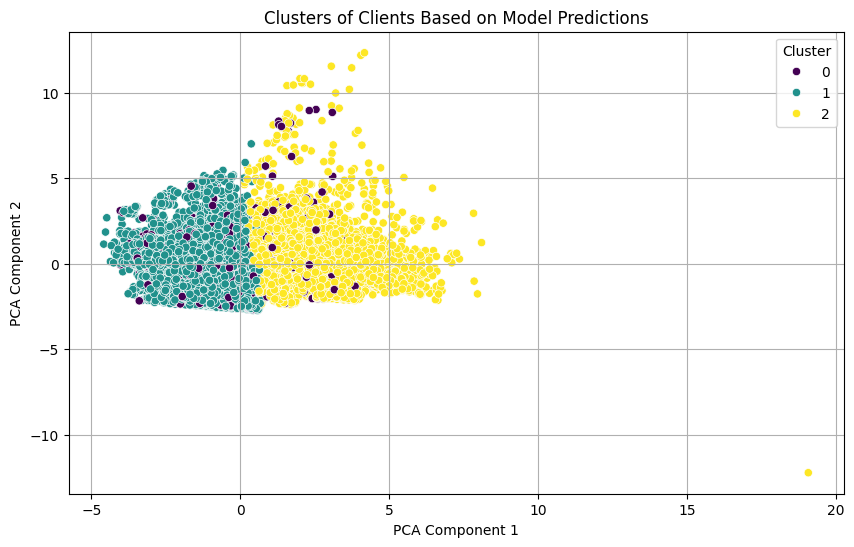

               PU  G_FUND_PC  AGE_AT_ENTRY  ENTRY_MONTH      DIFF  \
cluster                                                             
0       -0.013474  -0.083327     -0.047904    -0.033523 -0.052499   
1       -0.074651  -0.351564     -0.643822    -0.049900 -0.128425   
2        0.125892   0.604375      1.026688     0.063696  0.209675   

         PREM_PAYBL_M  ANTIGÜEDAD  DUR_ANOS  Ano_VTO_woe  PM_(FONDO)  \
cluster                                                                
0            0.085475    0.032110  0.085475    -0.093881    0.001522   
1            0.641790    0.147417  0.641790    -0.558167   -0.061015   
2           -1.030115   -0.205592 -1.030115     0.921408    0.114309   

         EDAD_woe  PREM_FREQ_Bimestral  PREM_FREQ_Cuatrimestral  \
cluster                                                           
0       -0.081010             1.000000                 0.000000   
1       -0.575192             0.000000                 0.089085   
2        0.939261        

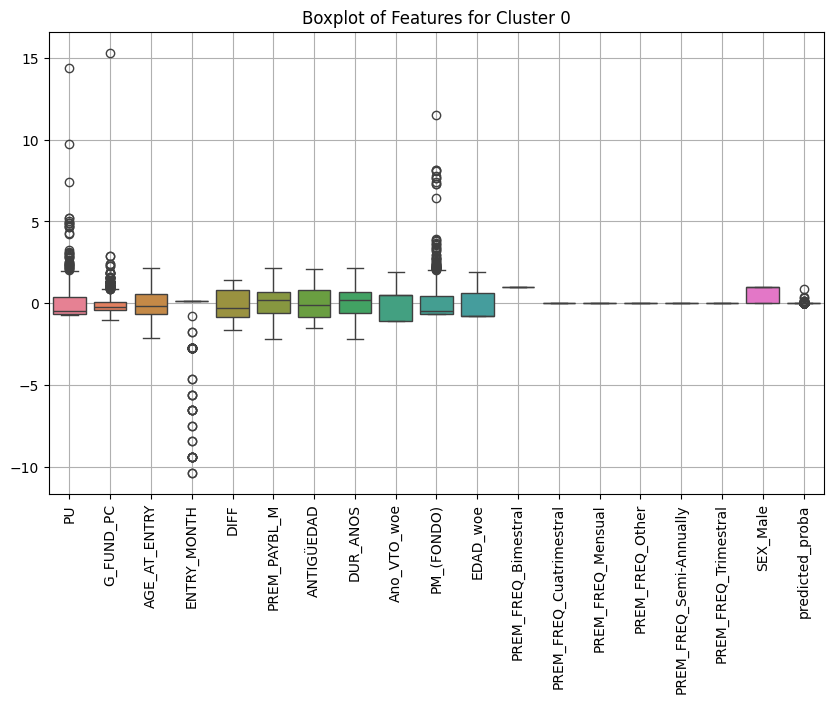

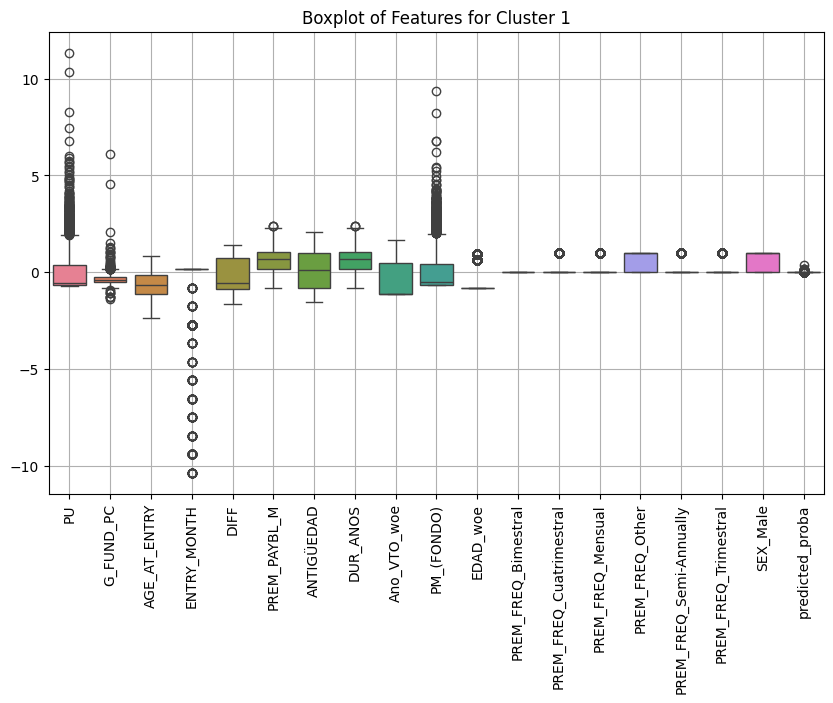

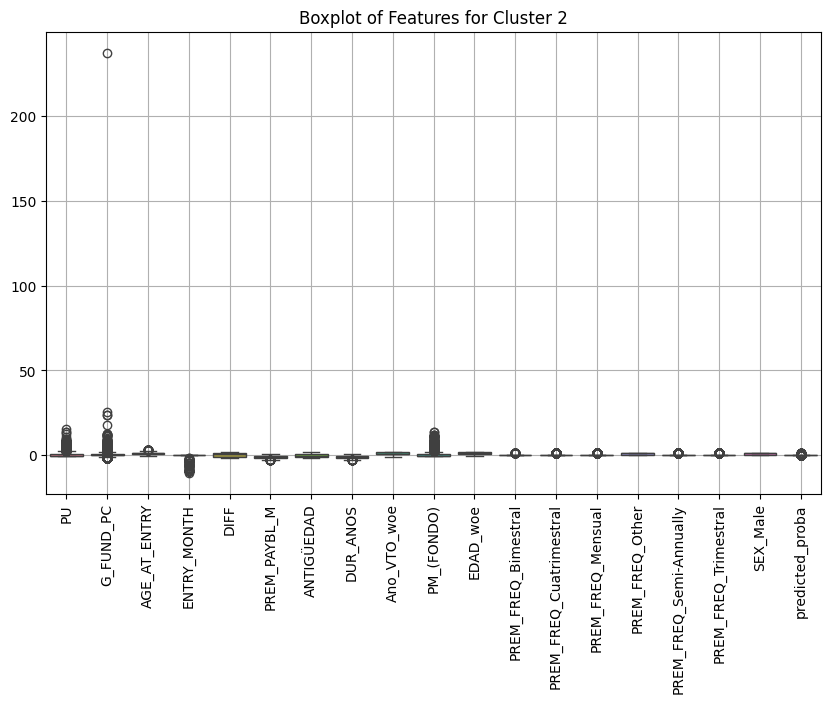

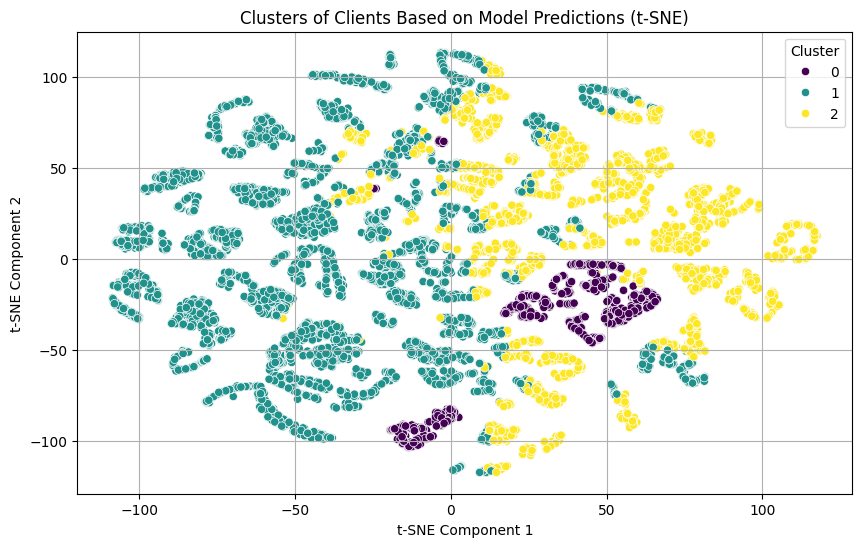

In [26]:

# Ajustar el preprocesador
preprocessor.fit(X_train)

# Transformar X_test utilizando el preprocesador ajustado
X_test_transformed = preprocessor.transform(X_test)

# Crear un DataFrame con las características transformadas
feature_names = numeric_features + list(preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features))
X_test_with_proba = pd.DataFrame(X_test_transformed, columns=feature_names)
X_test_with_proba['predicted_proba'] = y_pred_proba_gb

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test_with_proba)

# Aplicar K-Means para clustering
n_clusters = 3  # Ajustar el número de clusters según sea necesario
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Añadir los clusters a los datos originales
X_test_with_proba['cluster'] = clusters

# Visualizar los clusters usando PCA para reducción de dimensionalidad
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=clusters, palette='viridis', legend='full')
plt.title('Clusters of Clients Based on Model Predictions')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# Análisis de los clusters
cluster_analysis = X_test_with_proba.groupby('cluster').mean()
print(cluster_analysis)

# Visualización de las características más importantes por cluster
for cluster in range(n_clusters):
    cluster_data = X_test_with_proba[X_test_with_proba['cluster'] == cluster]
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=cluster_data.drop(columns='cluster'))
    plt.title(f'Boxplot of Features for Cluster {cluster}')
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

# Intentar visualización con t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_components[:, 0], y=tsne_components[:, 1], hue=clusters, palette='viridis', legend='full')
plt.title('Clusters of Clients Based on Model Predictions (t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

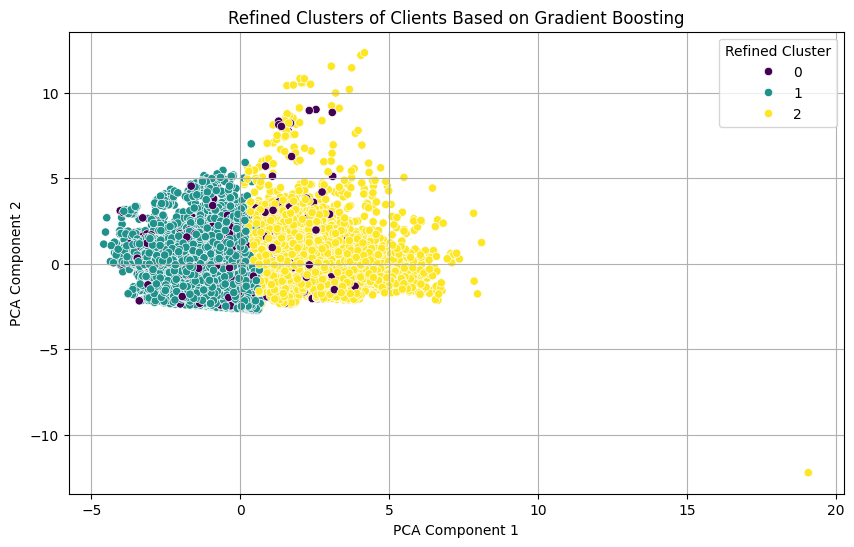

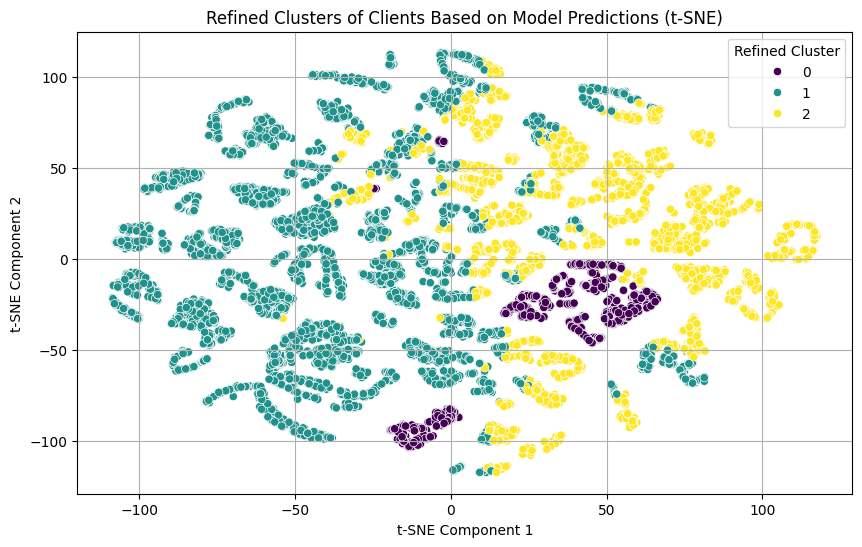

In [27]:
# Aplicar Gradient Boosting para mejorar las asignaciones de clúster
gb_clf = GradientBoostingClassifier(random_state=42, learning_rate= 0.2, max_depth= 5, n_estimators= 200)
gb_clf.fit(X_scaled, clusters)

# Predecir las asignaciones de clúster refinadas
refined_clusters = gb_clf.predict(X_scaled)
X_test_with_proba['refined_cluster'] = refined_clusters

# Visualizar los clusters refinados usando PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=refined_clusters, palette='viridis', legend='full')
plt.title('Refined Clusters of Clients Based on Gradient Boosting')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Refined Cluster')
plt.grid(True)
plt.show()

# Visualización con t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_components[:, 0], y=tsne_components[:, 1], hue=refined_clusters, palette='viridis', legend='full')
plt.title('Refined Clusters of Clients Based on Model Predictions (t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Refined Cluster')
plt.grid(True)
plt.show()

In [31]:
from scipy.stats import kruskal

# Realizar el test de Kruskal-Wallis para cada característica
kruskal_results = {}
for feature in feature_names:
    groups = [X_test_with_proba[X_test_with_proba['refined_cluster'] == cluster][feature] for cluster in range(n_clusters)]
    stat, p_val = kruskal(*groups)
    kruskal_results[feature] = p_val

# Crear un DataFrame con los resultados del test de Kruskal-Wallis
kruskal_df = pd.DataFrame(list(kruskal_results.items()), columns=['Feature', 'P-Value'])
kruskal_df = kruskal_df.sort_values(by='P-Value')

# Mostrar las características más importantes (menor P-Value)
print("Características más importantes por P-Value (Kruskal-Wallis):")
print(kruskal_df.head(10))


Características más importantes por P-Value (Kruskal-Wallis):
                Feature       P-Value
8           Ano_VTO_woe  0.000000e+00
1             G_FUND_PC  0.000000e+00
2          AGE_AT_ENTRY  0.000000e+00
14      PREM_FREQ_Other  0.000000e+00
5          PREM_PAYBL_M  0.000000e+00
7              DUR_ANOS  0.000000e+00
11  PREM_FREQ_Bimestral  0.000000e+00
10             EDAD_woe  0.000000e+00
6            ANTIGÜEDAD  1.645366e-96
4                  DIFF  1.415437e-88


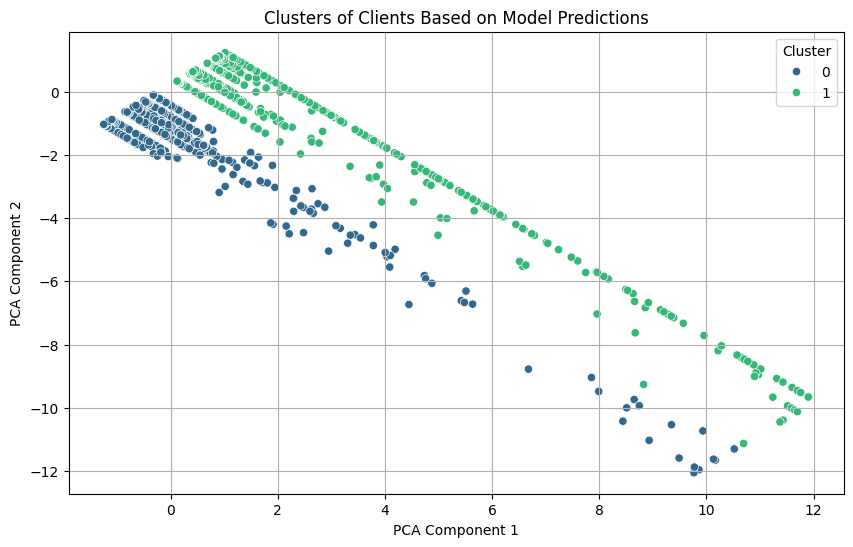

Variables que más contribuyen a la primera componente principal:
predicted_proba    0.707107
DIFF               0.707107
Name: PCA Component 1, dtype: float64

Variables que más contribuyen a la segunda componente principal:
DIFF               0.707107
predicted_proba   -0.707107
Name: PCA Component 2, dtype: float64
             DIFF  predicted_proba
cluster                           
0       -0.903672         0.007597
1        0.953333         0.011897


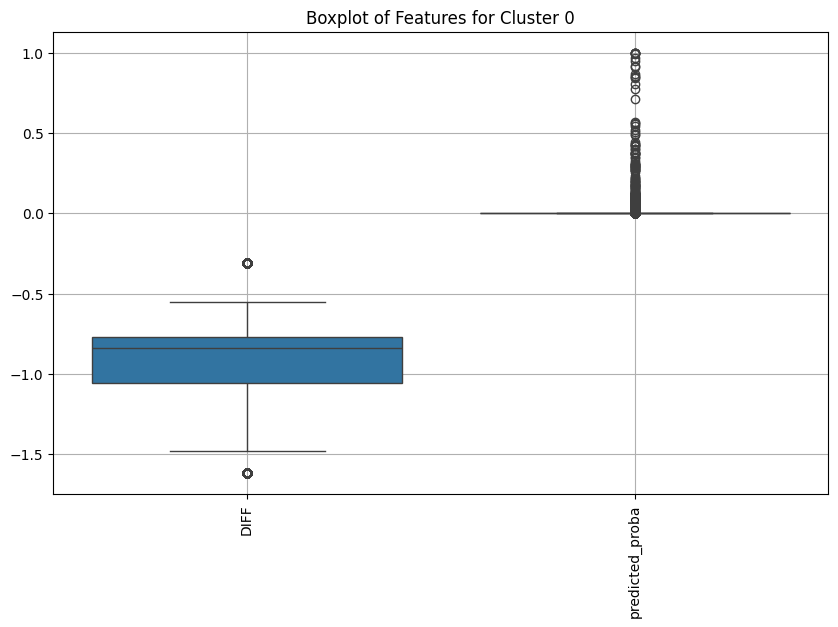

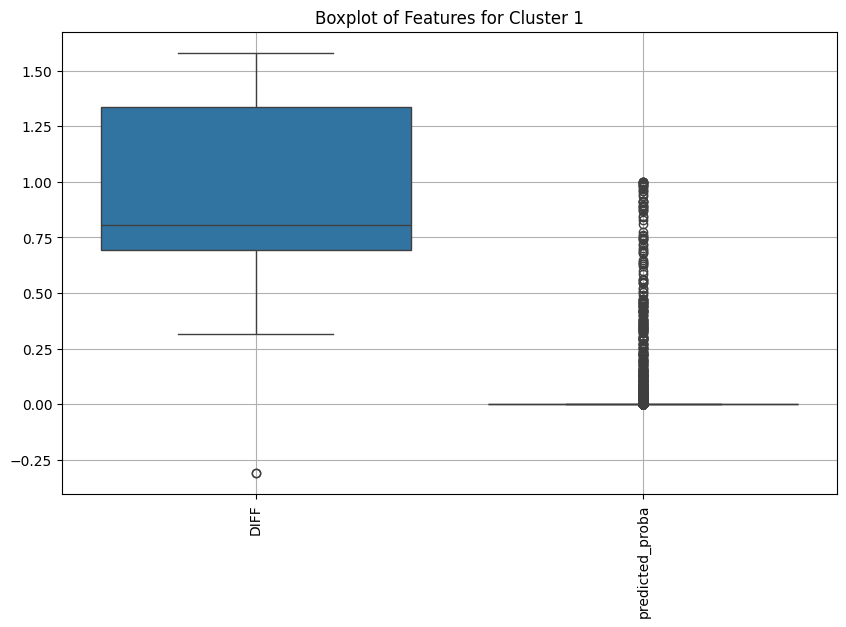

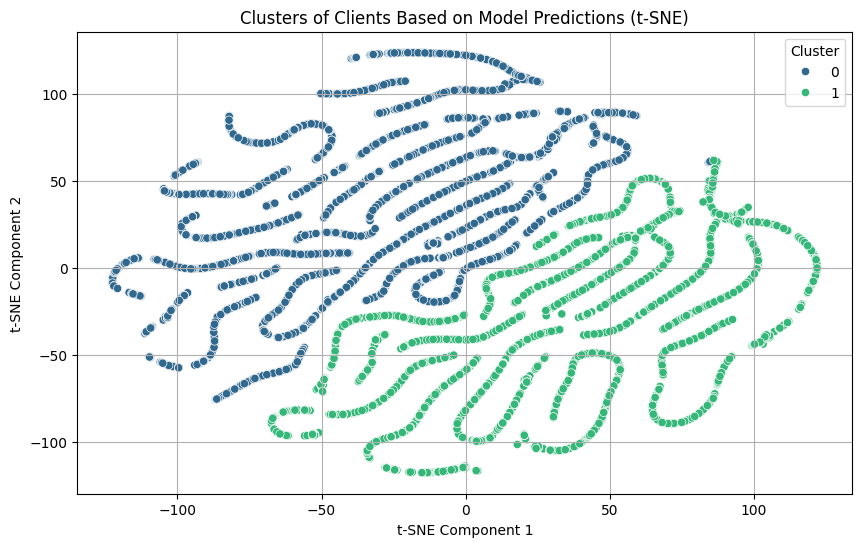

In [66]:
# Ajustar el preprocesador
preprocessor.fit(X_train)

# Transformar X_test utilizando el preprocesador ajustado
X_test_transformed = preprocessor.transform(X_test)

# Crear un DataFrame con las características transformadas
feature_names = numeric_features + list(preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features))
X_test_with_proba = pd.DataFrame(X_test_transformed, columns=feature_names)
X_test_with_proba['predicted_proba'] = y_pred_proba_gb

# Excluir variables de frecuencia de pólizas y ENTRY_MONTH
features_to_exclude = ['PREM_FREQ_Bimestral', 'PREM_FREQ_Cuatrimestral', 'PREM_FREQ_Mensual', 
                       'PREM_FREQ_Other', 'PREM_FREQ_Semi-Annually', 'PREM_FREQ_Trimestral', 'ENTRY_MONTH', 'SEX_Male', 'G_FUND_PC', 'DUR_ANOS', 'ANTIGÜEDAD', 'PREM_PAYBL_M', 'PU', 'AGE_AT_ENTRY', 'Ano_VTO_woe',  'PM_(FONDO)',  'EDAD_woe']
X_test_with_proba = X_test_with_proba.drop(columns=features_to_exclude)

# Escalar las características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_test_with_proba)

# Aplicar K-Means para clustering
n_clusters = 2  # Ajustar el número de clusters según sea necesario
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

# Añadir los clusters a los datos originales
X_test_with_proba['cluster'] = clusters

# Visualizar los clusters usando PCA para reducción de dimensionalidad
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=components[:, 0], y=components[:, 1], hue=clusters, palette='viridis', legend='full')
plt.title('Clusters of Clients Based on Model Predictions')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


loadings = pca.components_.T
pca_df = pd.DataFrame(loadings, columns=['PCA Component 1', 'PCA Component 2'], index= X_test_with_proba.columns[:-1])

# Mostrar las variables que más contribuyen a cada componente principal
print("Variables que más contribuyen a la primera componente principal:")
print(pca_df['PCA Component 1'].sort_values(ascending=False))

print("\nVariables que más contribuyen a la segunda componente principal:")
print(pca_df['PCA Component 2'].sort_values(ascending=False))

# Análisis de los clusters
cluster_analysis = X_test_with_proba.groupby('cluster').mean()
print(cluster_analysis)

# Visualización de las características más importantes por cluster
for cluster in range(n_clusters):
    cluster_data = X_test_with_proba[X_test_with_proba['cluster'] == cluster]
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=cluster_data.drop(columns='cluster'))
    plt.title(f'Boxplot of Features for Cluster {cluster}')
    plt.xticks(rotation=90)
    plt.grid(True)
    plt.show()

# Intentar visualización con t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_components = tsne.fit_transform(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x=tsne_components[:, 0], y=tsne_components[:, 1], hue=clusters, palette='viridis', legend='full')
plt.title('Clusters of Clients Based on Model Predictions (t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


C:\Users\mbuendiarascon\AppData\Local\Temp\ipykernel_45112\431338576.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Explained Variance', y='Feature', data=pca_importance_df, palette='viridis')


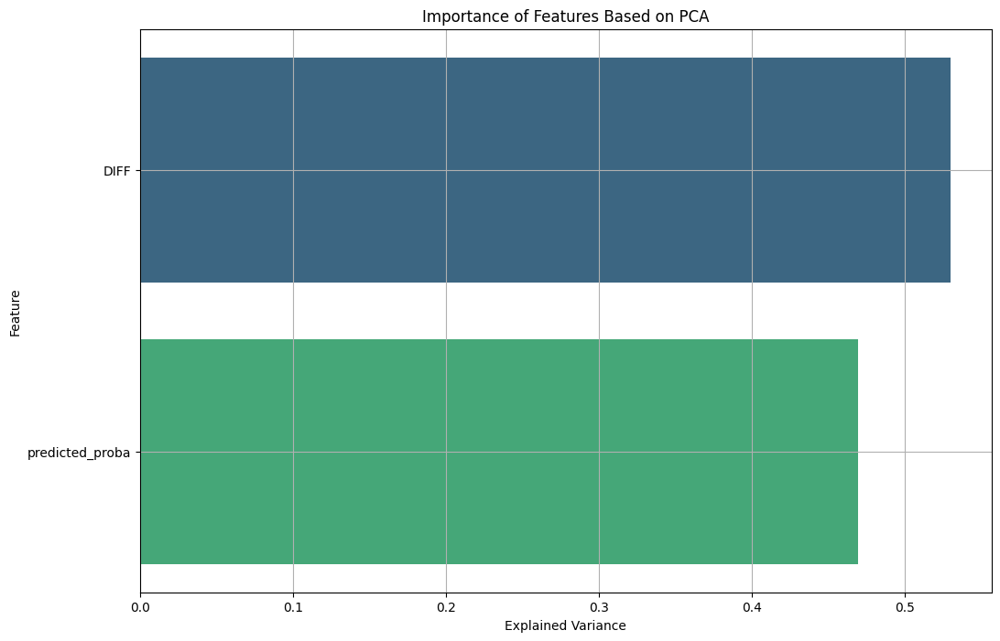

Explained variance by each principal component:
Principal Component 1: 0.5305
Principal Component 2: 0.4695


In [64]:
# Extraer las componentes principales y su importancia
pca_full = PCA(n_components=X_scaled.shape[1])
pca_full.fit(X_scaled)
components_full = pca_full.transform(X_scaled)
explained_variance = pca_full.explained_variance_ratio_

# Crear un DataFrame para la importancia de las características
pca_importance_df = pd.DataFrame({'Feature': X_test_with_proba.columns[:-1], 'Explained Variance': explained_variance})

# Ordenar las características por su importancia
pca_importance_df = pca_importance_df.sort_values(by='Explained Variance', ascending=False)

# Visualizar la importancia de las características
plt.figure(figsize=(12, 8))
sns.barplot(x='Explained Variance', y='Feature', data=pca_importance_df, palette='viridis')
plt.title('Importance of Features Based on PCA')
plt.xlabel('Explained Variance')
plt.ylabel('Feature')
plt.grid(True)
plt.show()

# Mostrar las componentes principales y su varianza explicada
print("Explained variance by each principal component:")
for i, variance in enumerate(explained_variance):
    print(f"Principal Component {i+1}: {variance:.4f}")

In [65]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X_scaled, clusters)
print(f'Silhouette Score: {silhouette_avg}')


Silhouette Score: 0.7326563521249294


In [62]:

# Calcular el score de sensibilidad
X_test['sensitivity_score'] = y_pred_proba_gb * feature_importances['DIFF']

# Normalizar el score para facilitar la interpretación
scaler = StandardScaler()
X_test['normalized_sensitivity_score'] = scaler.fit_transform(X_test[['sensitivity_score']])

# Mostrar los asegurados con mayor sensibilidad
top_sensitive_clients = X_test.sort_values(by='normalized_sensitivity_score', ascending=False)
print(top_sensitive_clients[['normalized_sensitivity_score']].head(10))

NameError: name 'feature_importances' is not defined

In [46]:
# Definir una función para calcular el test de Kruskal-Wallis para todas las variables
def kruskal_wallis_overall(X, clusters):
    h_statistics = []
    p_values = []
    for i, column in enumerate(X.columns):
        groups = [X[column][clusters == cluster] for cluster in np.unique(clusters)]
        h_stat, p_val = kruskal(*groups)
        h_statistics.append(h_stat)
        p_values.append(p_val)
        print(f"Variable: {column}, H-statistic: {h_stat}, p-value: {p_val}")
    # Calcular el overall H-statistic como la media de los H-statistics individuales
    overall_h_statistic = np.mean(h_statistics)
    return overall_h_statistic, h_statistics, p_values

# Calcular el overall score de Kruskal-Wallis
overall_h_statistic, h_statistics, p_values = kruskal_wallis_overall(X_test_with_proba.drop(columns=['cluster']), refined_clusters)

print(f"Overall H-statistic for Kruskal-Wallis test: {overall_h_statistic}")

Variable: PU, H-statistic: 302.67164643148004, p-value: 1.8866314208930049e-66
Variable: G_FUND_PC, H-statistic: 8293.975850333027, p-value: 0.0
Variable: AGE_AT_ENTRY, H-statistic: 11229.720404069474, p-value: 0.0
Variable: DIFF, H-statistic: 404.56009981757404, p-value: 1.415436939632925e-88
Variable: PREM_PAYBL_M, H-statistic: 11215.651788361405, p-value: 0.0
Variable: ANTIGÜEDAD, H-statistic: 441.10041180029737, p-value: 1.6453662886119037e-96
Variable: DUR_ANOS, H-statistic: 11215.651788361405, p-value: 0.0
Variable: Ano_VTO_woe, H-statistic: 8422.170475102761, p-value: 0.0
Variable: PM_(FONDO), H-statistic: 219.09260705071787, p-value: 2.658550204632833e-48
Variable: EDAD_woe, H-statistic: 9031.219953436832, p-value: 0.0
Variable: predicted_proba, H-statistic: 4904.451083400445, p-value: 0.0
Overall H-statistic for Kruskal-Wallis test: 5970.933282560493


In [84]:
from scipy.stats import shapiro, levene, kruskal, f_oneway

# Función para realizar el test de Shapiro-Wilk (Normalidad) y Levene (Homogeneidad de Varianzas)
def evaluate_assumptions(df, cluster_col):
    results = []
    for column in df.columns:
        if column == cluster_col:
            continue
        shapiro_p_values = []
        levene_p_value = None
        cluster_groups = [group[column].values for name, group in df.groupby(cluster_col)]
        
        # Test de Normalidad para cada clúster
        for group in cluster_groups:
            stat, p = shapiro(group)
            shapiro_p_values.append(p)
        
        # Test de Homogeneidad de Varianzas
        stat, levene_p_value = levene(*cluster_groups)
        
        results.append({
            'Variable': column,
            'Shapiro p-values': shapiro_p_values,
            'Levene p-value': levene_p_value
        })
    
    return pd.DataFrame(results)

# Realizar la evaluación de supuestos
assumption_results = evaluate_assumptions(X_test_with_proba, 'refined_cluster')

# Mostrar los resultados
print(assumption_results)

# Realizar ANOVA y Kruskal-Wallis para todas las variables
def perform_tests(df, cluster_col):
    anova_results = []
    kruskal_results = []
    for column in df.columns:
        if column == cluster_col:
            continue
        cluster_groups = [group[column].values for name, group in df.groupby(cluster_col)]
        
        # Test ANOVA
        stat_anova, p_anova = f_oneway(*cluster_groups)
        
        # Test de Kruskal-Wallis
        stat_kruskal, p_kruskal = kruskal(*cluster_groups)
        
        anova_results.append({
            'Variable': column,
            'ANOVA F-value': stat_anova,
            'ANOVA p-value': p_anova
        })
        
        kruskal_results.append({
            'Variable': column,
            'Kruskal H-statistic': stat_kruskal,
            'Kruskal p-value': p_kruskal
        })
    
    return pd.DataFrame(anova_results), pd.DataFrame(kruskal_results)

# Realizar los tests
anova_results, kruskal_results = perform_tests(X_test_with_proba, 'refined_cluster')

# Mostrar los resultados
print("ANOVA Results:")
print(anova_results)

print("Kruskal-Wallis Results:")
print(kruskal_results)

                   Variable  \
0                        PU   
1                 G_FUND_PC   
2              AGE_AT_ENTRY   
3               ENTRY_MONTH   
4                      DIFF   
5              PREM_PAYBL_M   
6                ANTIGÜEDAD   
7                  DUR_ANOS   
8               Ano_VTO_woe   
9                PM_(FONDO)   
10                 EDAD_woe   
11      PREM_FREQ_Bimestral   
12  PREM_FREQ_Cuatrimestral   
13        PREM_FREQ_Mensual   
14          PREM_FREQ_Other   
15  PREM_FREQ_Semi-Annually   
16     PREM_FREQ_Trimestral   
17                 SEX_Male   
18          predicted_proba   
19                  cluster   

                                     Shapiro p-values  Levene p-value  
0   [7.894911672079003e-48, 1.2820593360963982e-83...    1.009183e-21  
1   [3.929612630338926e-51, 1.0578297857140976e-71...    3.305017e-72  
2   [2.6919218283505604e-08, 1.0022577704920421e-2...   2.183059e-109  
3   [1.0156275317394433e-62, 2.1656653334284865e-1...    2.1

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10316.
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 6291.
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: Input data has range zero. The results may not be accurate.
  res = hypotest_fun_out(*samples, **kwds)
C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_morestats.py:3345: RuntimeWarning: invalid value encountered in scalar divide
  W = numer / denom


ANOVA Results:
                   Variable  ANOVA F-value  ANOVA p-value
0                        PU   7.925650e+01   5.361380e-35
1                 G_FUND_PC   4.771370e+02  1.155936e-202
2              AGE_AT_ENTRY   1.361448e+04   0.000000e+00
3               ENTRY_MONTH   2.458755e+01   2.168961e-11
4                      DIFF   2.314550e+02  5.559165e-100
5              PREM_PAYBL_M   1.366324e+04   0.000000e+00
6                ANTIGÜEDAD   2.457568e+02  4.937105e-106
7                  DUR_ANOS   1.366324e+04   0.000000e+00
8               Ano_VTO_woe   8.013963e+03   0.000000e+00
9                PM_(FONDO)   5.691822e+01   2.281331e-25
10                 EDAD_woe   8.869932e+03   0.000000e+00
11      PREM_FREQ_Bimestral   2.376176e+05   0.000000e+00
12  PREM_FREQ_Cuatrimestral   7.367738e+01   1.355014e-32
13        PREM_FREQ_Mensual   3.264201e+01   7.067635e-15
14          PREM_FREQ_Other   1.122391e+03   0.000000e+00
15  PREM_FREQ_Semi-Annually   9.610948e+01   3.022685e-42

C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)


In [89]:
import numpy as np
from scipy.stats import kruskal

# Asumiendo que `X_test_transformed` contiene las características transformadas y `refined_clusters` contiene las asignaciones de clúster refinadas.

# Definir una función para calcular el test de Kruskal-Wallis para todas las variables
def kruskal_wallis_overall(X, clusters):
    h_statistics = []
    p_values = []
    for i, column in enumerate(X.columns):
        groups = [X[column][clusters == cluster] for cluster in np.unique(clusters)]
        h_stat, p_val = kruskal(*groups)
        h_statistics.append(h_stat)
        p_values.append(p_val)
        print(f"Variable: {column}, H-statistic: {h_stat}, p-value: {p_val}")
    # Calcular el overall H-statistic como la media de los H-statistics individuales
    overall_h_statistic = np.mean(h_statistics)
    return overall_h_statistic, h_statistics, p_values

# Calcular el overall score de Kruskal-Wallis
overall_h_statistic, h_statistics, p_values = kruskal_wallis_overall(pd.DataFrame(X_test_transformed, refined_clusters), refined_clusters)

print(f"Overall H-statistic for Kruskal-Wallis test: {overall_h_statistic}")


Variable: 0, H-statistic: 302.67164643148004, p-value: 1.8866314208930049e-66
Variable: 1, H-statistic: 8293.975850333027, p-value: 0.0
Variable: 2, H-statistic: 11229.720404069474, p-value: 0.0
Variable: 3, H-statistic: 64.35396538891223, p-value: 1.0609965494518389e-14
Variable: 4, H-statistic: 404.56009981757404, p-value: 1.415436939632925e-88
Variable: 5, H-statistic: 11215.651788361405, p-value: 0.0
Variable: 6, H-statistic: 441.10041180029737, p-value: 1.6453662886119037e-96
Variable: 7, H-statistic: 11215.651788361405, p-value: 0.0
Variable: 8, H-statistic: 8422.170475102761, p-value: 0.0
Variable: 9, H-statistic: 219.09260705071787, p-value: 2.658550204632833e-48
Variable: 10, H-statistic: 9031.219953436832, p-value: 0.0
Variable: 11, H-statistic: 17427.646928776398, p-value: 0.0
Variable: 12, H-statistic: 146.180259070168, p-value: 1.8086730244248226e-32
Variable: 13, H-statistic: 65.05645108644501, p-value: 7.467429660812835e-15
Variable: 14, H-statistic: 1997.1863928870303, 

In [48]:
from scipy.stats import f_oneway

In [61]:
# Test ANOVA para verificar si hay diferencias significativas en INT_GAR entre los clusters
f_val, p_val = f_oneway(
    X_test_with_proba[X_test_with_proba['refined_cluster'] == 0]['DIFF'],
    X_test_with_proba[X_test_with_proba['refined_cluster'] == 1]['DIFF'],
    X_test_with_proba[X_test_with_proba['refined_cluster'] == 2]['DIFF']
)
print(f"ANOVA results for DIFF: F-value = {f_val}, p-value = {p_val}")

# Test ANOVA para verificar si hay diferencias significativas en INT_MERCADO entre los clusters
f_val, p_val = f_oneway(
    X_test_with_proba[X_test_with_proba['refined_cluster'] == 0]['G_FUND_PC'],
    X_test_with_proba[X_test_with_proba['refined_cluster'] == 1]['G_FUND_PC'],
    X_test_with_proba[X_test_with_proba['refined_cluster'] == 2]['G_FUND_PC']
)
print(f"ANOVA results for INTERES MINIMO GARANTIZADO: F-value = {f_val}, p-value = {p_val}")

ANOVA results for DIFF: F-value = 231.45503385229034, p-value = 5.559164739281708e-100
ANOVA results for INTERES MINIMO GARANTIZADO: F-value = 477.1369881625012, p-value = 1.1559360909877118e-202


In [67]:
from scipy.stats import shapiro

# Verificar normalidad para cada grupo
groups = X_test_with_proba['refined_cluster'].unique()
for group in groups:
    stat, p = shapiro(X_test_with_proba[X_test_with_proba['refined_cluster'] == group]['DIFF'])
    print(f'Normality test for DIFF in cluster {group}: W-statistic = {stat}, p-value = {p}')
    
    stat, p = shapiro(X_test_with_proba[X_test_with_proba['refined_cluster'] == group]['G_FUND_PC'])
    print(f'Normality test for INTERES MINIMO GARANTIZADO in cluster {group}: W-statistic = {stat}, p-value = {p}')

Normality test for DIFF in cluster 2: W-statistic = 0.8954824279404193, p-value = 3.40961023380908e-54
Normality test for INTERES MINIMO GARANTIZADO in cluster 2: W-statistic = 0.13038736622607938, p-value = 1.0380310247584399e-98
Normality test for DIFF in cluster 1: W-statistic = 0.8972469634784787, p-value = 1.5932086013925354e-63
Normality test for INTERES MINIMO GARANTIZADO in cluster 1: W-statistic = 0.8460495780891919, p-value = 1.0578297857140976e-71
Normality test for DIFF in cluster 0: W-statistic = 0.8974029542867621, p-value = 2.1905229409551483e-30
Normality test for INTERES MINIMO GARANTIZADO in cluster 0: W-statistic = 0.5708753263885078, p-value = 3.929612630338926e-51


C:\Users\mbuendiarascon\AppData\Roaming\Python\Python312\site-packages\scipy\stats\_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 10316.
  res = hypotest_fun_out(*samples, **kwds)


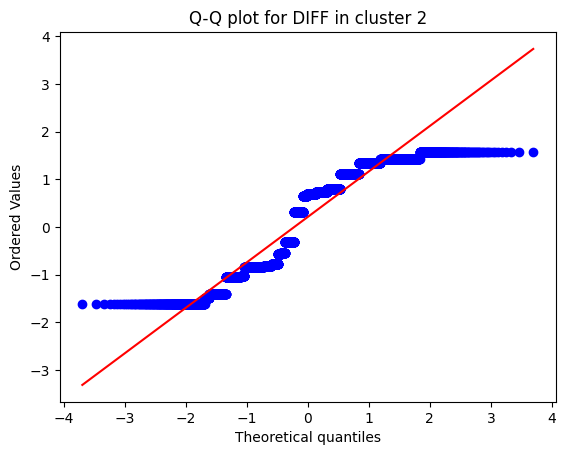

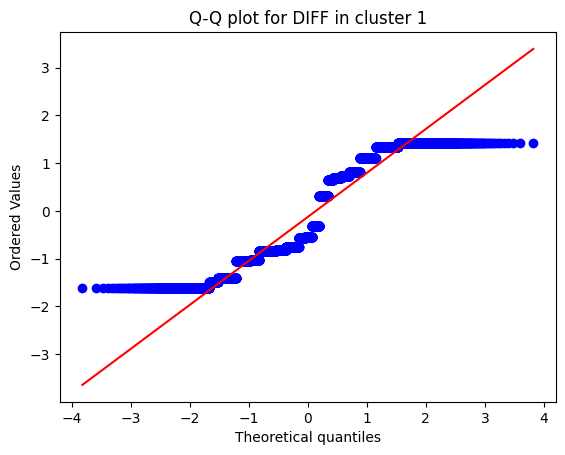

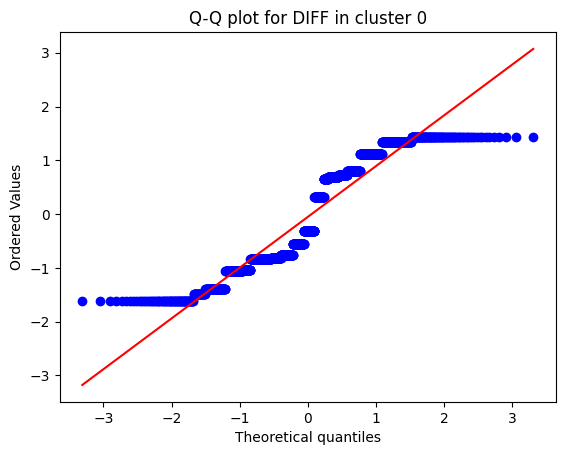

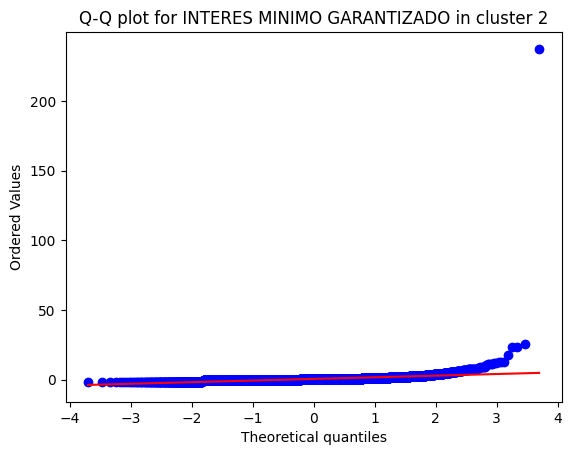

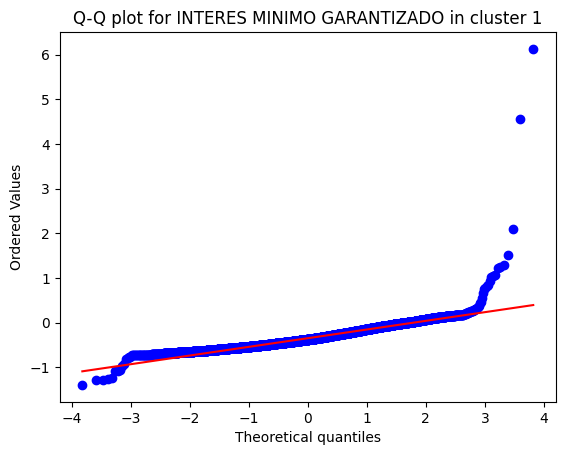

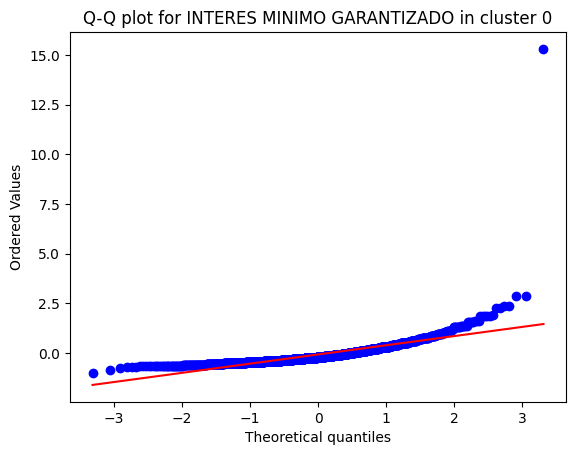

In [70]:
import scipy.stats as stats

# Gráficos Q-Q para DIFF
for group in groups:
    stats.probplot(X_test_with_proba[X_test_with_proba['refined_cluster'] == group]['DIFF'], dist="norm", plot=plt)
    plt.title(f'Q-Q plot for DIFF in cluster {group}')
    plt.show()
    
# Gráficos Q-Q para INTERES MINIMO GARANTIZADO
for group in groups:
    stats.probplot(X_test_with_proba[X_test_with_proba['refined_cluster'] == group]['G_FUND_PC'], dist="norm", plot=plt)
    plt.title(f'Q-Q plot for INTERES MINIMO GARANTIZADO in cluster {group}')
    plt.show()

In [62]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(X_scaled, refined_clusters)
print(f'Silhouette Score: {silhouette_avg}')

Silhouette Score: 0.19166442772233255


In [65]:
from scipy.stats import kruskal
# Obtener los datos por cluster
data_cluster_0 = X_test_with_proba[X_test_with_proba['refined_cluster'] == 0]['DIFF']
data_cluster_1 = X_test_with_proba[X_test_with_proba['refined_cluster'] == 1]['DIFF']
data_cluster_2 = X_test_with_proba[X_test_with_proba['refined_cluster'] == 2]['DIFF']


# Realizar el test de Kruskal-Wallis
kruskal_test_diff = kruskal(data_cluster_0, data_cluster_1, data_cluster_2)
print(f"Kruskal-Wallis test results for DIFF: H-statistic = {kruskal_test_diff.statistic}, p-value = {kruskal_test_diff.pvalue}")
# Obtener los datos por cluster
data_cluster_0 = X_test_with_proba[X_test_with_proba['refined_cluster'] == 0]['G_FUND_PC']
data_cluster_1 = X_test_with_proba[X_test_with_proba['refined_cluster'] == 1]['G_FUND_PC']
data_cluster_2 = X_test_with_proba[X_test_with_proba['refined_cluster'] == 2]['G_FUND_PC']


# Realizar el test de Kruskal-Wallis
kruskal_test_interes = kruskal(data_cluster_0, data_cluster_1, data_cluster_2)
print(f"Kruskal-Wallis test results for INTERES MINIMO GARANTIZADO: H-statistic = {kruskal_test_interes.statistic}, p-value = {kruskal_test_interes.pvalue}")



Kruskal-Wallis test results for DIFF: H-statistic = 404.56009981757404, p-value = 1.415436939632925e-88
Kruskal-Wallis test results for INTERES MINIMO GARANTIZADO: H-statistic = 8293.975850333027, p-value = 0.0


Cluster Averages:
               PU  G_FUND_PC  AGE_AT_ENTRY  ENTRY_MONTH      DIFF  \
cluster                                                             
0       -0.014250  -0.085601     -0.051266    -0.033892 -0.052194   
1        0.123539   0.618094      1.041800     0.064516  0.211530   
2       -0.070622  -0.347268     -0.631141    -0.048903 -0.125301   

         PREM_PAYBL_M  ANTIGÜEDAD  DUR_ANOS  Ano_VTO_woe  PM_(FONDO)  \
cluster                                                                
0            0.088881    0.032458  0.088881    -0.097585    0.000809   
1           -1.044609   -0.205234 -1.044609     0.934880    0.112400   
2            0.628732    0.142698  0.628732    -0.546902   -0.057572   

         EDAD_woe  PREM_FREQ_Bimestral  PREM_FREQ_Cuatrimestral  \
cluster                                                           
0       -0.085064             1.000000                 0.000000   
1        0.965681             0.008929                 0.091558   
2      

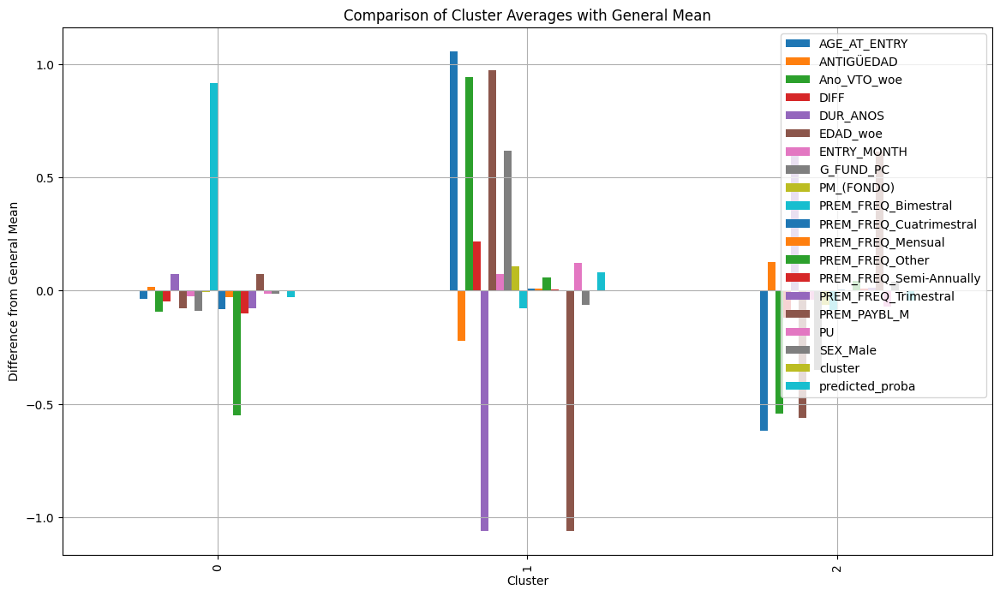

In [40]:
# Datos promedios de cada cluster
cluster_data = X_test_with_proba.groupby('cluster').mean()

# Calcular el promedio general de los datos para comparación
general_mean = X_test_with_proba.mean()

# Imprimir los datos promedio por cluster y el promedio general
print("Cluster Averages:")
print(cluster_data)
print("\nGeneral Mean:")
print(general_mean)

# Comparar cada cluster con el promedio general
comparison = cluster_data - general_mean
print("\nComparison with General Mean:")
print(comparison)

comparison = cluster_data - general_mean

# Graficar la comparación
comparison.plot(kind='bar', figsize=(14, 8))
plt.title('Comparison of Cluster Averages with General Mean')
plt.xlabel('Cluster')
plt.ylabel('Difference from General Mean')
plt.legend(loc='best')
plt.grid(True)
plt.show()
